# Stalk the Stock

Importing libraries and modules

In [1]:
import numpy as np

import pandas as pd
from pandas_datareader import data as web

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
%matplotlib inline

import plotly.express as px
import plotly.graph_objects as go

from plotly.subplots import make_subplots

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode()

import warnings
warnings.simplefilter("ignore")

from datetime import date, timedelta
import time
import datetime

import yfinance as yf

import cufflinks as cf
cf.go_offline()

from scipy.signal import argrelextrema
from scipy.stats import linregress

In [2]:
#ticker.cashflow

In [3]:
#ticker.major_holders

In [4]:
# ticker = yf.Ticker('INFY')
# ticker.history(period="5y")
# ticker.financials

Stock input and fetching its data

In [5]:
stock_name = input("Enter the stock name\n")
stock_data = yf.download(tickers = stock_name + '.NS' ,period = '10y', interval = '1d')
stock_data

Enter the stock name
TATAELXSI
[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2012-11-12,108.650002,111.375000,108.650002,110.300003,95.481705,29640
2012-11-15,109.099998,110.150002,108.500000,109.449997,94.745888,12490
2012-11-16,111.449997,111.449997,108.250000,108.599998,94.010101,19382
2012-11-19,108.974998,109.000000,106.900002,107.125000,92.733253,11412
2012-11-20,107.824997,108.500000,106.000000,106.300003,92.019089,22522
...,...,...,...,...,...,...
2022-11-03,6943.000000,6943.000000,6880.149902,6892.649902,6892.649902,189007
2022-11-04,6920.000000,6941.000000,6852.250000,6908.049805,6908.049805,197189
2022-11-07,6972.000000,7040.000000,6951.299805,6976.450195,6976.450195,142033


Plotting Candlestick for the stock

In [6]:
#adding stock data(olhc and volume) to plot
x_axis = stock_data.index

opens = stock_data['Open']
low = stock_data['Low']
high = stock_data['High']
close = stock_data['Close']
volume = stock_data['Volume']

#plotting the candlesticks chart
stock_candle = go.Candlestick(x=x_axis, open=opens, low=low,
                           high=high, close=close, name=stock_name+ '_candle')

stock_volume = go.Bar(x=x_axis, y=volume, name=stock_name + '_volume' )

fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(trace=stock_candle, secondary_y=True)
fig.add_trace(trace=stock_volume, secondary_y=False)

#adding different timeframes to view the chart
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=15,
                     label="15M",
                     step="minute",
                     stepmode="backward"),
                dict(count=45,
                     label="45M",
                     step="minute",
                     stepmode="backward"),
                dict(count=1,
                     label="1HR",
                     step="hour",
                     stepmode="todate"),
                dict(count=1,
                     label="1D",
                     step="day",
                     stepmode="todate"),
                dict(count=3,
                     label="3D",
                     step="day",
                     stepmode="todate"),
                dict(count=7,
                     label="1W",
                     step="day",
                     stepmode="backward"),
                dict(count=14,
                     label="2W",
                     step="day",
                     stepmode="backward"),
                dict(count=1,
                     label="1M",
                     step="month",
                     stepmode="backward"),
                dict(label="All", step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

#labelling the chart
fig.update_layout(xaxis_title='Date',
                  yaxis_title="Price",
                  title=stock_name,
                  width=1200, height=800)

#removing time period when the market is closed
fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)
fig.show()

INDICATORS

In [7]:
#fetching historical stock data
stock_data = yf.download(tickers = stock_name + '.NS' ,period = '10y', interval = '1d')
x_axis = stock_data.index

[*********************100%***********************]  1 of 1 completed


Simple Moving Average (SMA)

In [8]:
#SMA for price and volume

#taking input from user for SMA parameters
x = int(input("Shorter Period for SMA\n") or 50)
y = int(input("Longer Period for SMA\n") or 200)
z = int(input("Period for average Volume\n") or 10)

#fetching data to be plotted
MAx_data = stock_data['Close'].rolling(x).mean()
MAy_data = stock_data['Close'].rolling(y).mean()
price_data = stock_data['Close']
Volume_MA_data = stock_data['Volume'].rolling(z).mean()

#plotting SMA
MAx = go.Scatter(x=x_axis, y=MAx_data, line=dict(color='green', width=1), name="SMA"+str(x))
MAy = go.Scatter(x=x_axis, y=MAy_data, line=dict(color='red', width=1), name="SMA"+str(y))
price = go.Scatter(x=x_axis, y=price_data, line=dict(color='orange', width=1), name="price")
stock_volume = go.Bar(x=x_axis, y=stock_data['Volume'], marker_color='blue',name=stock_name + '_volume' )
MA_volume = go.Scatter(x=x_axis, y=Volume_MA_data, line=dict(color='black', width=1), name="Volume_SMA"+str(z))

#storing SMA data
stock_data["SMA"+str(x)] = MAx_data
stock_data["SMA"+str(y)] = MAy_data
stock_data["Volume_SMA"+str(z)] = Volume_MA_data

fig = make_subplots(specs=[[{"secondary_y": True}]])

#removing time period when the market is closed
fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

fig.add_trace(trace=stock_volume, secondary_y = False)
fig.add_trace(trace=MAx, secondary_y = True)
fig.add_trace(trace=MAy, secondary_y = True)
fig.add_trace(trace=price, secondary_y = True)
fig.add_trace(trace = MA_volume, secondary_y=False)
fig.update_xaxes(rangeslider_visible=True)
fig.show()

Shorter Period for SMA

Longer Period for SMA

Period for average Volume



In [9]:
# SMA Using cufflinks library for comparison.

qf=cf.QuantFig(stock_data, title=stock_name,legend='top',name='cf_SMA')
qf.add_sma(periods=20, color='green')
qf.add_sma(periods=200, color='red')

qf.iplot()

Exponential Moving Average (EMA)

Shorter Period for EMA

Longer Period for EMA



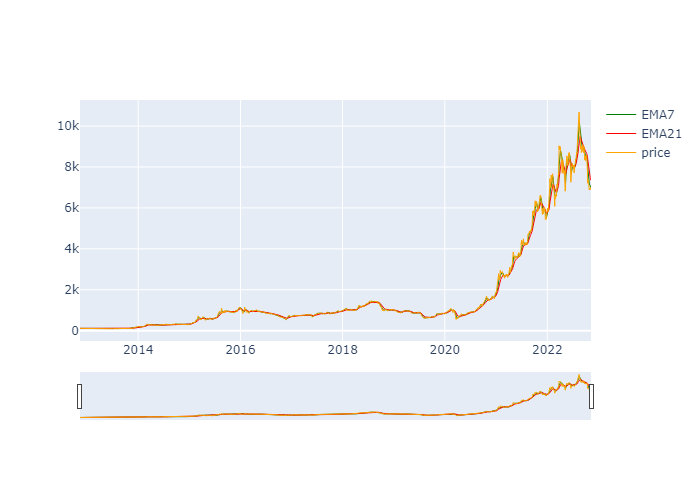

In [10]:
#EMA

#user input for EMA parameters
x = int(input("Shorter Period for EMA\n") or 7)
y = int(input("Longer Period for EMA\n") or 21)

#fetching data to plot EMA
EMAx_data = stock_data['Close'].ewm(span=x, adjust=False).mean()
EMAy_data = stock_data['Close'].ewm(span=y, adjust=False).mean()
price_data = stock_data['Close']

#storing EMA data
stock_data["EMA"+str(x)] = EMAx_data
stock_data["EMA"+str(y)] = EMAy_data

#plotting EMA
EMAx = go.Scatter(x=x_axis, y=EMAx_data, line=dict(color='green', width=1), name="EMA"+str(x))
EMAy = go.Scatter(x=x_axis, y=EMAy_data, line=dict(color='red', width=1), name="EMA"+str(y))
price = go.Scatter(x=x_axis, y=price_data, line=dict(color='orange', width=1), name="price")

fig = go.Figure()

fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                        
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

fig.add_trace(trace=EMAx)
fig.add_trace(trace=EMAy)
fig.add_trace(trace=price)
fig.update_xaxes(rangeslider_visible=True)
fig.show("png")

Relative Strength Index (RSI)

Enter the time period for RSI

Enter overbought region
Enter oversold region


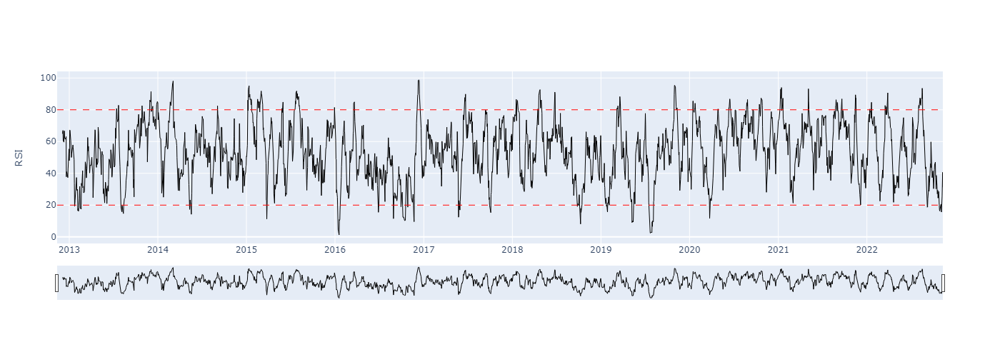

In [11]:
#RSI

#taking input from user for RSI parameter
period = int(input("Enter the time period for RSI\n") or 14)
a = int(input("Enter overbought region") or 80)
b = int(input("Enter oversold region") or 20)

#defining a function to calculate RSI 
def RSI(df,period):
    temp_df = pd.DataFrame()
    temp_df = df
    temp_df['Price_Change'] = temp_df['Close'] - temp_df['Close'].shift(1)
    temp_df['Daily_gain'] = np.where(temp_df['Price_Change']>=0,temp_df['Price_Change'],0)
    temp_df['Daily_loss'] = np.where(temp_df['Price_Change']<0,abs(temp_df['Price_Change']),0)
    temp_df['Avg_gain'] = temp_df['Daily_gain'].rolling(period).sum()
    temp_df['Avg_loss'] = temp_df['Daily_loss'].rolling(period).sum()
    temp_df['RS'] = temp_df['Avg_gain']/temp_df['Avg_loss']
    temp_df['RSI'] = (temp_df['RS']/(1+temp_df['RS']))*100
    df['RSI_'+str(period)] = temp_df['RSI']
    
RSI(stock_data,period)

#plotting RSI    
RSI_data = stock_data['RSI_'+str(period)]

RSI_curve = go.Scatter(x=x_axis, y=RSI_data, 
                      line=dict(color='black', width=1), name="RSI")

fig = go.Figure()
fig.add_trace(RSI_curve)
                                              
fig.update_xaxes(
    rangeslider_visible=True)
fig.update_yaxes(title="RSI")

fig.update_layout(height=500, width=1400)

fig.add_hline(y=b, line_width=1, line_dash="dash", line_color="red")
fig.add_hline(y=a, line_width=1, line_dash="dash", line_color="red")

fig.show("png")

MACD

Shorted Period

Longer Period

Signal Period



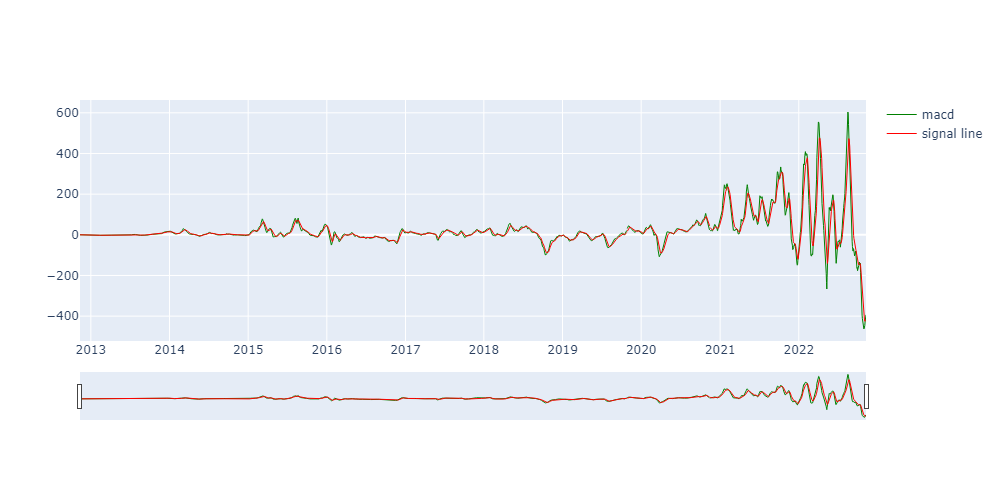

In [12]:
# MACD

#taking input from user for MACD parameters
sp = int(input("Shorted Period\n") or 12)
lp = int(input("Longer Period\n") or 26)
signal = int(input("Signal Period\n") or 9)

#fetching data for plotting MACD
ema_sp = stock_data['Close'].ewm(span = sp, adjust=False).mean()
ema_lp = stock_data['Close'].ewm(span = lp, adjust=False).mean()

macd_data = ema_sp - ema_lp

stock_data['MACD'+str(sp)+'_'+str(lp)] = macd_data

signal_line_data = macd_data.ewm(span = signal, adjust=False).mean()

#storing MACD data
stock_data['MACD_Signal_'+str(signal)] = signal_line_data

#plotting MACD
macd = go.Scatter(x = x_axis, y = macd_data, line=dict(color='green', width=1), name="macd")
signal_line = go.Scatter(x = x_axis, y = signal_line_data, line=dict(color='red', width=1), name="signal line")

fig = go.Figure()

fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                          #for holidays
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

fig.update_layout(height=500, width=1000)
fig.add_trace(trace=macd)
fig.add_trace(trace=signal_line)
fig.update_xaxes(rangeslider_visible=True)
fig.show("png")

Bollinger Bands

Enter the period for Bollinger Bands

How many times the standard deviation do you want to enclose the band within?


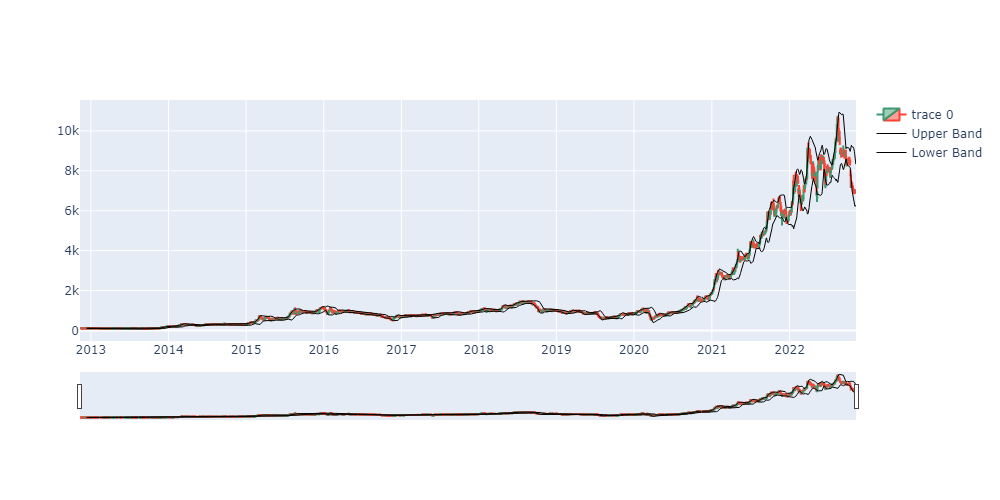

In [13]:
#Bollinger bands

#user input for BB parameters
x = int(input("Enter the period for Bollinger Bands\n") or 20)
y = float(input("How many times the standard deviation do you want to enclose the band within?") or 2)

#fetching data for plotting BB
SMA = stock_data['Close'].rolling(x).mean()
SD = stock_data['Close'].rolling(x).std(ddof=1)

plus_SD = SMA + (SD*y) 
minus_SD = SMA - (SD*y) 

#plotting BB
candle = go.Candlestick(x=x_axis,
                       open=stock_data['Open'],
                       low=stock_data['Low'],
                       high=stock_data['High'],
                       close=stock_data['Close'])

Upper_band = go.Scatter(x=x_axis, y=plus_SD, line=dict(color='Black', width=1), name="Upper Band")
Lower_band = go.Scatter(x=x_axis, y=minus_SD, line=dict(color='Black', width=1), name="Lower Band")

fig =go.Figure()

fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                      
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

fig.update_layout(height=500, width=1000)
fig.add_trace(candle)
fig.add_trace(trace=Upper_band)
fig.add_trace(trace=Lower_band)
fig.show("png")

ICHIMOKU

[*********************100%***********************]  1 of 1 completed


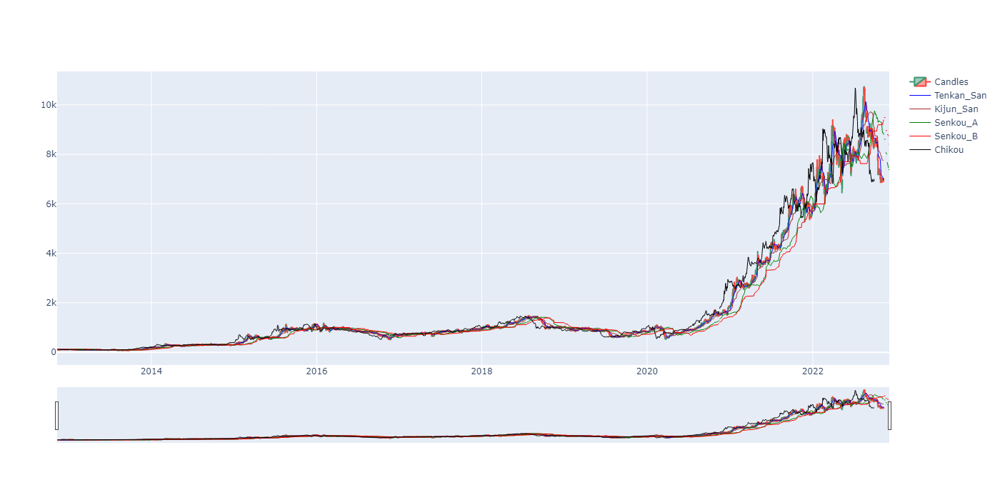

In [14]:
#fetching historical stock data to a new df
ichimoku_df = yf.download(tickers = stock_name + '.NS' ,period = '10y', interval = '1d')

#adding future days to our dataframe:
temp_table = [np.NaN,np.NaN,np.NaN,np.NaN,np.NaN,np.NaN]

date_series = pd.Series(stock_data.index)
sdate = date_series.iloc[date_series.shape[0]-1]
edate = sdate+timedelta(days=40)
delta = edate - sdate     
temp_list = []

for i in range(1,delta.days + 1):
    day = sdate + timedelta(days=i)
    temp_list.append(day)
    
temp_series= pd.Series(temp_list)
date_ser = date_series.append(temp_series, ignore_index=True)

for i in range(26):
    ichimoku_df.at[ichimoku_df.shape[0]] = temp_table

ichimoku_df = ichimoku_df.reset_index()

#Defining ichimoku curve's data

#Tenkan San

ichimoku_df['high_nine'] = ichimoku_df['High'].rolling(9).max()
ichimoku_df['low_nine'] = ichimoku_df['Low'].rolling(9).min()
ichimoku_df['Tenkan_San'] = (ichimoku_df['high_nine'] + ichimoku_df['low_nine'])/2

#Kijun San

ichimoku_df['high_twenty_six'] = ichimoku_df['High'].rolling(26).max()
ichimoku_df['low_twenty_six'] = ichimoku_df['Low'].rolling(26).min()
ichimoku_df['Kijun_San'] = (ichimoku_df['high_twenty_six'] + ichimoku_df['low_twenty_six'])/2

#Leading lines

ichimoku_df['Senkou_A'] = ((ichimoku_df['Tenkan_San'] + ichimoku_df['Kijun_San'])/2).shift(26)

ichimoku_df['high_fifty_two'] = ichimoku_df['High'].rolling(52).max()
ichimoku_df['low_fifty_two'] = ichimoku_df['Low'].rolling(52).min()

ichimoku_df['Senkou_B'] = ((ichimoku_df['high_fifty_two'] + ichimoku_df['low_fifty_two'])/2).shift(26)

#Lagging line

ichimoku_df['Chikou'] = ichimoku_df['Close'].shift(-26)

#Candlesticks
candle = go.Candlestick(x=date_ser,
                       open=ichimoku_df['Open'],
                       low=ichimoku_df['Low'],
                       high=ichimoku_df['High'],
                       close=ichimoku_df['Close'],
                       name='Candles')

#plotting ichimoku
fig = go.Figure()
                              
Conversion_Line = go.Scatter(x=date_ser, y=ichimoku_df['Tenkan_San'], line=dict(color='blue',width=1), name='Tenkan_San')
Base_Line = go.Scatter(x=date_ser, y=ichimoku_df['Kijun_San'], line=dict(color='Brown',width=1), name='Kijun_San')
Leading_A = go.Scatter(x=date_ser, y=ichimoku_df['Senkou_A'], line=dict(color='green',width=1), name='Senkou_A')
Leading_B = go.Scatter(x=date_ser, y=ichimoku_df['Senkou_B'], line=dict(color='red',width=1), name='Senkou_B')
Lagging = go.Scatter(x=date_ser, y=ichimoku_df['Chikou'], line=dict(color='Black',width=1), name='Chikou')


fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                      
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

fig.update_layout(height=700, width=1400)
fig.add_trace(trace=candle)
fig.add_trace(trace=Conversion_Line)
fig.add_trace(trace=Base_Line)
fig.add_trace(trace=Leading_A)
fig.add_trace(trace=Leading_B)
fig.add_trace(trace=Lagging)

fig.show("png")

Stochastic Oscillator

Enter the period for Stochastic Oscillator

Enter overbought region

Enter oversold region



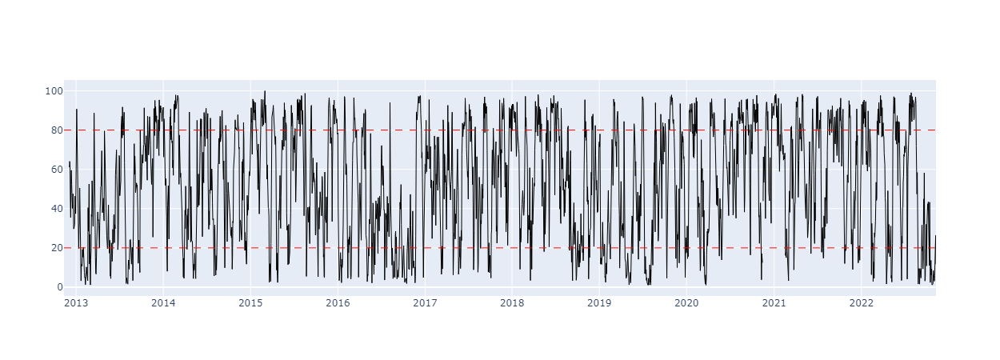

In [15]:
#Stochastic Oscillator

#getting input from user for indicator parameters
x = int(input('Enter the period for Stochastic Oscillator\n') or 14)
b = int(input('Enter overbought region\n') or 80)
a = int(input('Enter oversold region\n') or 20)

#getting necessary data to plot Stochastic Oscillator
high_val = stock_data['High'].rolling(window=x).max()
low_val = stock_data['Low'].rolling(window=x).min()
curr_val = stock_data['Close']
so_num = curr_val - low_val
so_den = high_val- low_val
so = (so_num/so_den)*100

#plotting the indicator
fig = go.Figure()

so_curve = go.Scatter(x=x_axis,y=so,
                     line=dict(color='black',width=1),
                     name='Stochastic_Curve')

fig.add_trace(trace=so_curve)
fig.add_hline(y=b, line_width=1, line_dash="dash", line_color="red")
fig.add_hline(y=a, line_width=1, line_dash="dash", line_color="red")

fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                      
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

fig.update_layout(height=450, width=1250)

fig.show("png")


Average True Range

Enter period for ATR


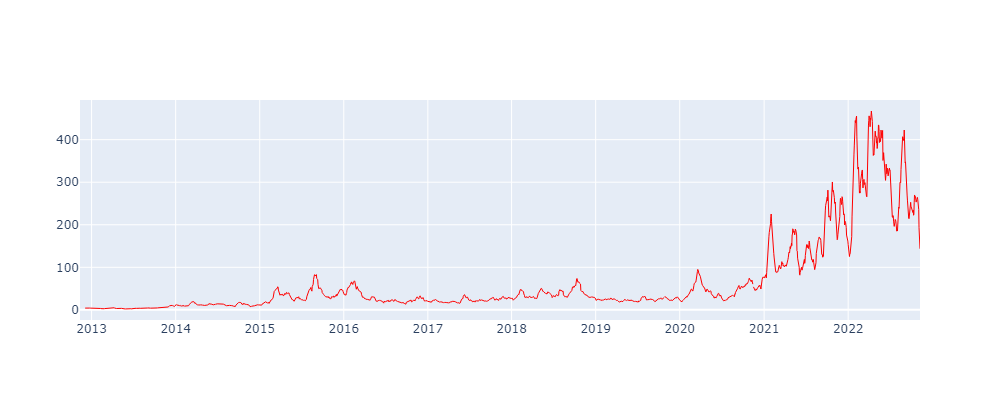

In [16]:
#ATR

#user input for ATR parameters
x = int(input("Enter period for ATR") or 14)

#getting necessary data for ATR plot
curr_high = stock_data['High']
curr_low = stock_data['Low']
prev_close = stock_data['Close'].shift(1)

a = abs(curr_high-prev_close)
b = abs(curr_low-prev_close)
c = curr_high - curr_low
        
temp_df = pd.concat([a, b, c], axis=1)
temp_df['True_Range'] = temp_df.max(axis=1)
temp_df['ATR'] = temp_df['True_Range'].rolling(x).mean()

#adding data to our df
stock_data['True_Range'] = temp_df['True_Range']
stock_data['ATR'] = temp_df['ATR']

#plotting
fig = go.Figure()

ATR_curve = go.Scatter(x=x_axis, y=temp_df['ATR'],
                      line=dict(color='red',width=1),
                      name='ATR')

fig.add_trace(trace=ATR_curve)

fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                      
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

fig.update_layout(height=400, width=1000)
fig.show("png")

Average Directional Index

[*********************100%***********************]  1 of 1 completed


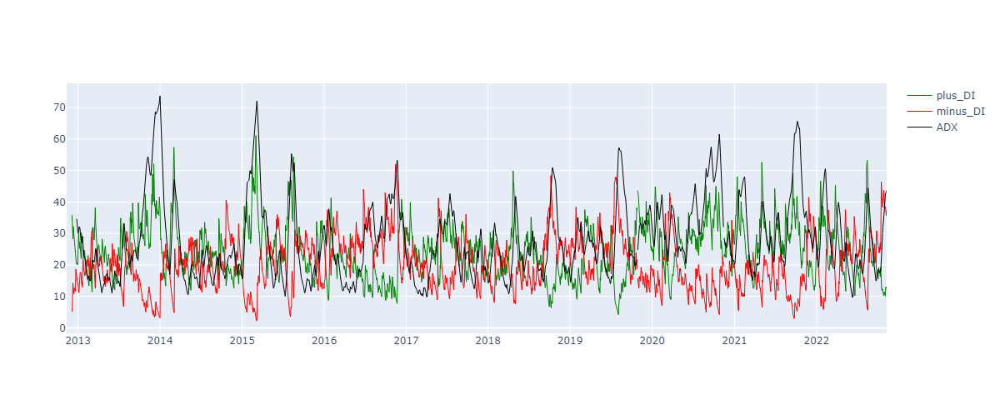

In [17]:
#ADX without library

#fetching historical data
temp_df = yf.download(tickers = stock_name + '.NS' ,period = '10y', interval = '1d')

#retrieving True Range from ATR.
temp_df['True_Range'] = stock_data['True_Range']
x_axis = temp_df.index

#getting data for plotting ADX
temp_df['plus_DM'] = np.where(((temp_df['High'] - temp_df['High'].shift(1)) >
                                 (temp_df['Low'].shift(1) - temp_df['Low'])) &
                                ((temp_df['High'] - temp_df['High'].shift(1)) > 0),
                                (temp_df['High'] - temp_df['High'].shift(1)),0)

temp_df['minus_DM'] = np.where(((temp_df['High'] - temp_df['High'].shift(1)) <
                                 (temp_df['Low'].shift(1) - temp_df['Low'])) &
                                ((temp_df['Low'].shift(1) - temp_df['Low']) > 0),
                                (temp_df['Low'].shift(1) - temp_df['Low']),0)

#function to implement wilder's smoothening for curves
def wilder_smoothening(name):
    smooth_it = 'smooth_'+name
    first_smooth = temp_df[name].head(14).sum()

    temp_df[smooth_it] = np.nan

    temp_df.at[temp_df.index[14],smooth_it] = first_smooth

    temp = first_smooth

    for i in range(15,temp_df.shape[0]):
        temp_df.at[temp_df.index[i],smooth_it] = temp - temp/14 + temp_df.loc[temp_df.index[i],name]
        temp = temp_df.loc[temp_df.index[i],smooth_it]

wilder_smoothening('True_Range')
wilder_smoothening('plus_DM')
wilder_smoothening('minus_DM')

#getting +DI and -DI and DX
temp_df['plus_DI'] = (temp_df['smooth_plus_DM']/temp_df['smooth_True_Range'])*100
temp_df['minus_DI'] = (temp_df['smooth_minus_DM']/temp_df['smooth_True_Range'])*100

temp_df['DX'] = ((abs(temp_df['plus_DI'] - temp_df['minus_DI']))/
                   (temp_df['plus_DI'] + temp_df['minus_DI'])) * 100

#getting ADX
temp_sum = 0
for i in range(15,28):
    temp_sum += temp_df.loc[temp_df.index[i],'DX']

first_ADX = temp_sum/14

temp_df['ADX'] = np.nan

temp_df.at[temp_df.index[28],'ADX'] = first_ADX

temp = first_ADX

for i in range(29,temp_df.shape[0]):
    temp_df.at[temp_df.index[i],'ADX'] = ((temp*13) + temp_df.loc[temp_df.index[i],'DX'])/14
    temp = temp_df.loc[temp_df.index[i],'ADX']
    
#adding data to our df
stock_data['plus_DI'] = temp_df['plus_DI']
stock_data['minus_DI'] = temp_df['minus_DI']
stock_data['ADX'] = temp_df['ADX']
 
#plotting ADX
fig = go.Figure()
                              

plus_DI = go.Scatter(x=x_axis, y=temp_df['plus_DI'], line=dict(color='green',width=1), name='plus_DI')
minus_DI = go.Scatter(x=x_axis, y=temp_df['minus_DI'], line=dict(color='red',width=1), name='minus_DI')
ADX = go.Scatter(x=x_axis, y=temp_df['ADX'], line=dict(color='Black',width=1), name='ADX')


fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                      
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

fig.update_layout(height=480, width=1200)
fig.add_trace(trace=plus_DI)
fig.add_trace(trace=minus_DI)
fig.add_trace(trace=ADX)

fig.show("png")


Commodity Channel Indicator

Enter the period



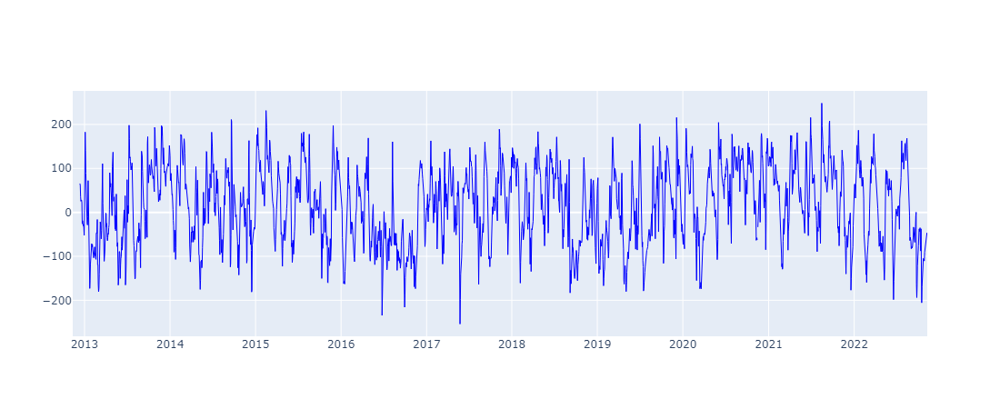

In [18]:
#CCI

#getting user input for CCI parameters
x = int(input("Enter the period\n") or 20)

#getting necessary data for plotting CCI
Typical_Price = (stock_data['High'] + 
                 stock_data['Low'] + 
                 stock_data['Close'])/3

TP_sma = Typical_Price.rolling(x).mean()
TP_std = Typical_Price.rolling(x).std()

CCI = (((Typical_Price) - (TP_sma))/(0.015*TP_std))

#plotting
fig = go.Figure()

CCI_curve = go.Scatter(x=x_axis, y=CCI,
                      line=dict(color='blue',width=1),
                      name='CCI')

fig.add_trace(trace=CCI_curve)

fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                      
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

fig.update_layout(height=450, width=1100)
fig.show("png")

PLOTTING on Candlestick Charts

TRENDLINE

In [19]:
#Generating dataset for local maxima and minima to draw a trendline and identify uptrend or downtrend
x = int(input("Enter the periods for a trend to be considered\n") or 7)

local_maxima = np.array(argrelextrema(stock_data['High'].values, np.greater, order=x))
local_minima = np.array(argrelextrema(stock_data['Low'].values, np.less, order=x))

peaks_x_data = []
peaks_y_data = []
peaks_z_data = []

for i in range(local_maxima.size):
    peaks_x_data.append(stock_data.index[local_maxima[0,i]])
    peaks_y_data.append(stock_data.loc[stock_data.index[local_maxima[0,i]],'High'])
    peaks_z_data.append(1)
    
valleys_x_data = []   
valleys_y_data = []
valleys_z_data = []

for i in range(local_minima.size):
    valleys_x_data.append(stock_data.index[local_minima[0,i]])
    valleys_y_data.append(stock_data.loc[stock_data.index[local_minima[0,i]],'Low'])
    valleys_z_data.append(-1)
    
df = pd.DataFrame()

df['x_data'] = np.hstack((peaks_x_data, valleys_x_data))
df['y_data'] = np.hstack((peaks_y_data, valleys_y_data))
df['Peak_Valley'] = np.hstack((peaks_z_data, valleys_z_data))

df.sort_values('x_data',inplace=True)

#adding data to our df

stock_data['Peak_Valley'] = 0

for i in range(df.shape[0]):
    stock_data.at[df.loc[i,'x_data'],'Peak_Valley'] = df.loc[i,'Peak_Valley']

#plotting
candle = go.Candlestick(x=x_axis,
                       open=stock_data['Open'],
                       low=stock_data['Low'],
                       high=stock_data['High'],
                       close=stock_data['Close'],
                       name='Candles')

#extending trendline to include present day candlestick
i = stock_data.shape[0]-1
while(stock_data.index[i] != df.loc[df.index[df.shape[0]-1],'x_data']):
    i = i-1
    
last_extreme = df.loc[df.index[df.shape[0]-1],'y_data']
last_trend = df.loc[df.index[df.shape[0]-1],'Peak_Valley']
current_min = stock_data.tail(stock_data.shape[0]-i)['Low'].min()
current_max = stock_data.tail(stock_data.shape[0]-i)['High'].max()

#modifying last minimum or maximum if a new extreme has been found
if(last_trend == -1):
    if(current_min<last_extreme):
        posi = stock_data.shape[0]-1
        df.at[posi,'x_data'] = stock_data.tail(stock_data.shape[0]-i)['Low'].idxmin()
        df.at[posi,'y_data'] = current_min
        df.at[posi,'Peak_Valley'] = -1
elif(last_trend == 1):
    if(current_max>last_extreme):
        posi = stock_data.shape[0]-1
        df.at[posi,'x_data'] = stock_data.tail(stock_data.shape[0]-i)['High'].idxmax()
        df.at[posi,'y_data'] = current_max
        df.at[posi,'Peak_Valley'] = 1

#adding data for last trading session
index = stock_data.shape[0]
df.at[index,'x_data'] = stock_data.index[stock_data.shape[0]-1]
if(last_trend == -1):
    df.at[index,'y_data'] = stock_data.loc[stock_data.index[stock_data.shape[0]-1],'High']
    df.at[index,'Peak_Valley'] = 1
elif(last_trend == 1):
    df.at[index,'y_data'] = stock_data.loc[stock_data.index[stock_data.shape[0]-1],'Low']
    df.at[index,'Peak_Valley'] = -1

trends = go.Scatter(x=df['x_data'], y=df['y_data'], line=dict(color='black',width=1), name='Trendline')

fig = go.Figure()

fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                      
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

fig.add_trace(trace=candle)
fig.add_trace(trace=trends)

fig.show()

Enter the periods for a trend to be considered



slpit df into where peakvalley is -1 and where it is 1
name it as support df and resistance df
run 2 loop for now. see optimization later
for i in range df.shape
then while the i+1 price is within the variation(sort the values so they are in increasing order only),
keep a count on values to get frequency
once while loop broken, keep the average min and max value in another df
plot these level with high frequency based on how close they are to current price.
if the level are close to current price, only then plot

In [20]:
#backing up df database
arc_df = df.copy()

#df stores the reversal price points data

#TODO, ASK USER TO ENTER HOW MANY YEARS DATA HE WANTS TO USE FOR S&R levels
date = input('Enter a date in YYYY-MM-DD format from where on datapoints to identiy S&R levels will be used\n') or '2016-01-01'
year, month, day = map(int, date.split('-'))
a = datetime.date(year, month, day)
df = df.set_index('x_data')
df = df.loc[a:]
df.reset_index(inplace=True)
dfs = df.copy()
df.drop(df.index[df.shape[0]-1],inplace=True)

#segregating reversal points for support and resistance
filt = df['Peak_Valley'] == -1
support_df = df[filt]
support_df.sort_values('y_data',inplace=True)
support_df.reset_index(inplace=True)
support_df.drop('index',inplace=True,axis=1)


filt = df['Peak_Valley'] == 1
resistance_df = df[filt]
resistance_df.sort_values('y_data',inplace=True)
resistance_df.reset_index(inplace=True)
resistance_df.drop('index',inplace=True,axis=1)


#formatting support and resistance levels to find optimal levels and combining levels that are close to one another
var = (int(input("Enter the allowable variation in % in S&R levels\n") or 1))/100

#support
used_list = []
support_val_df = pd.DataFrame(columns = ['date','support_value','max_value','min_value','frequency'])

for i in range(support_df.shape[0]):
    curr_value = support_df.loc[support_df.index[i],'y_data']
    date = support_df.loc[support_df.index[i],'x_data']
    min_value = curr_value*(1-var)
    max_value = curr_value*(1+var)
    temp_list = []
    k = i
    if(curr_value not in used_list):
        temp_list.append(curr_value)
        used_list.append(curr_value)
        while((k<support_df.shape[0]-1) and (min_value<support_df.loc[support_df.index[k+1],'y_data']<max_value)):
            temp_list.append(support_df.loc[support_df.index[k+1],'y_data'])
            used_list.append(support_df.loc[support_df.index[k+1],'y_data'])
            k+=1
        index = support_val_df.shape[0]
        support_val_df.at[index,'date'] = date
        support_val_df.at[index,'support_value'] = (sum(temp_list))/(len(temp_list))
        support_val_df.at[index,'frequency'] = len(temp_list)
        support_val_df.at[index,'max_value'] = max(temp_list)
        support_val_df.at[index,'min_value'] = min(temp_list)
    elif(curr_value in used_list):
        continue

#resistance
used_list = []
resistance_val_df = pd.DataFrame(columns = ['date','resistance_value','max_value','min_value','frequency'])

for i in range(resistance_df.shape[0]):
    curr_value = resistance_df.loc[resistance_df.index[i],'y_data']
    date = resistance_df.loc[resistance_df.index[i],'x_data']
    min_value = curr_value*(1-var)
    max_value = curr_value*(1+var)
    temp_list = []
    k = i
    if(curr_value not in used_list):
        temp_list.append(curr_value)
        used_list.append(curr_value)
        while((k<resistance_df.shape[0]-1) and (min_value<resistance_df.loc[resistance_df.index[k+1],'y_data']<max_value)):
            temp_list.append(resistance_df.loc[resistance_df.index[k+1],'y_data'])
            used_list.append(resistance_df.loc[resistance_df.index[k+1],'y_data'])
            k+=1
        index = resistance_val_df.shape[0]
        resistance_val_df.at[index,'resistance_value'] = (sum(temp_list))/(len(temp_list))
        resistance_val_df.at[index,'frequency'] = len(temp_list)
        resistance_val_df.at[index,'max_value'] = max(temp_list)
        resistance_val_df.at[index,'min_value'] = min(temp_list)
    elif(curr_value in used_list):
        continue

Enter a date in YYYY-MM-DD format from where on datapoints to identiy S&R levels will be used

Enter the allowable variation in % in S&R levels



In [21]:
support_val_df

,date,support_value,max_value,min_value,frequency
0,2020-03-25 00:00:00,499.950012,499.950012,499.950012,1
1,2016-11-22 00:00:00,510.625,510.625,510.625,1
2,2019-08-14 00:00:00,592.25,592.25,592.25,1
3,2019-09-04 00:00:00,609.008341,611.025024,606.0,3
4,2019-09-20 00:00:00,617.200012,617.200012,617.200012,1
5,2017-05-24 00:00:00,642.225006,643.275024,641.174988,2
6,2017-02-01 00:00:00,697.025024,697.025024,697.025024,1
7,2017-03-10 00:00:00,713.087494,713.174988,713.0,2
8,2017-03-31 00:00:00,730.25,730.25,730.25,1
9,2020-05-27 00:00:00,740.099976,740.099976,740.099976,1


Plotting Support and Resistance levels with frequency greater than 1.
Line width is proportional to frequency

In [22]:
freq = input("Enter the frequency of S&R level\n") or 1

#plotting candlesticks

candle = go.Candlestick(x=stock_data[a:].index,
                       open=stock_data[a:]['Open'],
                       low=stock_data[a:]['Low'],
                       high=stock_data[a:]['High'],
                       close=stock_data[a:]['Close'],
                       name='Candles')

fig = go.Figure()
fig.add_trace(trace=candle)
fig.update_layout(height=700,width=1100)
fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                      
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

ltp = stock_data.loc[stock_data.index[stock_data.shape[0]-1],'Close']

var = (input("Enter in what range wrt ltp you want to find S&R levels")) or 25/100
curr_price = stock_data.loc[stock_data.index[stock_data.shape[0]-1],'Close']
upper_limit = curr_price*(1+var)
lower_limit = curr_price*(1-var)

#plotting Support levels
filt = support_val_df['frequency']>1
temp_df = support_val_df[filt]
temp_df.reset_index(inplace=True)
for i in range(temp_df.shape[0]):
    if(lower_limit <= temp_df.loc[temp_df.index[i],'support_value'] <= upper_limit):
        fig.add_hline(y=temp_df.loc[temp_df.index[i],'support_value'], line_width=(temp_df.loc[temp_df.index[i],'frequency'])/3, line_dash="solid", line_color="green")
    
#plotting Resistance levels
filt = resistance_val_df['frequency']>1
temp_df = resistance_val_df[filt]
temp_df.reset_index(inplace=True)
for i in range(temp_df.shape[0]):
    if(lower_limit <= temp_df.loc[temp_df.index[i],'resistance_value'] <= upper_limit):
        fig.add_hline(y=temp_df.loc[temp_df.index[i],'resistance_value'], line_width=(temp_df.loc[temp_df.index[i],'frequency'])/3, line_dash="solid", line_color="red")
        
#plotting trendline
trends = go.Scatter(x=dfs['x_data'], y=dfs['y_data'], line=dict(color='black',width=1), name='Trendline')
fig.add_trace(trace=trends)

fig.show()

Enter the frequency of S&R level

Enter in what range wrt ltp you want to find S&R levels


Storing Trend Data and Trend Reversal data points

In Peak_Valley, every -1(local_minima) is a bottom reversal and every 1(local maxima) is a top reversal.
In main_trend, 1 implies it is an uptrend, while -1 implies it is downtrend. 0 implies it was a reversal.

In [23]:
# 1  : uptrend
# -1 : downtrend
# 0  : reversal

#new column to store main trend
stock_data['Main_Trend'] = 0

extreme_datapoints = np.hstack((local_maxima,local_minima))
extreme_datapoints.sort()

#first extreme
if(extreme_datapoints[0,0] == local_maxima[0,0]):
    first_extreme = 1
elif(extreme_datapoints[0,0] == local_minima[0,0]):
    first_extreme = -1
    
curr_trend = first_extreme
index = 0

for i in range(stock_data.shape[0]):
    if(i != extreme_datapoints[0,index]):
        stock_data.at[stock_data.index[i],'Main_Trend'] = curr_trend
    elif(i == extreme_datapoints[0,index]):
        stock_data.at[stock_data.index[i],'Main_Trend'] = 0
        if(index < extreme_datapoints.size-1):
            index += 1
        elif(index == extreme_datapoints.size-1):
            index = index
        if(curr_trend == 1):
            curr_trend = -1
        elif(curr_trend == -1):
            curr_trend = 1

Plotting all Support and Resistance that act as reversal. Accumulation points not included

In [24]:
#plotting candlesticks

candle = go.Candlestick(x=stock_data[a:].index,
                       open=stock_data[a:]['Open'],
                       low=stock_data[a:]['Low'],
                       high=stock_data[a:]['High'],
                       close=stock_data[a:]['Close'],
                       name='Candles')

fig = go.Figure()
fig.add_trace(trace=candle)
fig.update_layout(height=700,width=1100)
fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                      
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

ltp = stock_data.loc[stock_data.index[stock_data.shape[0]-1],'Close']
x = int(input("Enter in what range(%) wrt ltp you want to find support and resistance\n") or 25)/100
upper_limit = ltp*(1+x)
lower_limit = ltp*(1-x)

#plotting Support levels
filt = (stock_data['Peak_Valley'] == -1)
for i in range(stock_data[filt].shape[0]):
    if(lower_limit<=stock_data[filt].loc[stock_data[filt].index[i],'Low']<=upper_limit):
        fig.add_hline(y=stock_data[filt].loc[stock_data[filt].index[i],'Low'], line_width=1, line_dash="solid", line_color="green")
    
#plotting Resistance levels
filt = (stock_data['Peak_Valley'] == 1)
for i in range(stock_data[filt].shape[0]):
    if(lower_limit<=stock_data[filt].loc[stock_data[filt].index[i],'High']<=upper_limit):
        fig.add_hline(y=stock_data[filt].loc[stock_data[filt].index[i],'High'], line_width=1, line_dash="solid", line_color="red")

#plotting trendline
trends = go.Scatter(x=dfs['x_data'], y=dfs['y_data'], line=dict(color='black',width=1), name='Trendline')
fig.add_trace(trace=trends)

fig.show()

Enter in what range(%) wrt ltp you want to find support and resistance



Fine tuning Support and Resistance levels- by averaging 2 consecutive support values only if they fall within the allowable variation

In [25]:
#plotting candlesticks

candle = go.Candlestick(x=stock_data[a:].index,
                       open=stock_data[a:]['Open'],
                       low=stock_data[a:]['Low'],
                       high=stock_data[a:]['High'],
                       close=stock_data[a:]['Close'],
                       name='Candles')

fig = go.Figure()
fig.add_trace(trace=candle)
fig.update_layout(height=700,width=1100)
fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                      
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

ltp = stock_data.loc[stock_data.index[stock_data.shape[0]-1],'Close']
x = float(input("Enter in what range(%) wrt ltp you want to find support and resistance\n") or 25)/100
y = float(input("Enter the allowable variation in support and resistance levels\n") or 2)/100
upper_limit = ltp*(1+x)
lower_limit = ltp*(1-x)

#plotting Support levels
support = []
support_values = []
filt = (stock_data['Peak_Valley'] == -1)
for i in range(stock_data[filt].shape[0]):
    if(lower_limit<=stock_data[filt].loc[stock_data[filt].index[i],'Low']<=upper_limit):
        support.append(stock_data[filt].loc[stock_data[filt].index[i],'Low'])
support.sort()
temp_values = []
for i in range(len(support)-1):
    if(support[i] in temp_values):
        continue
    elif(support[i] not in temp_values):
        temp_values.append(support[i])
        if(support[i+1]<=support[i]*(1+y)):
            temp_values.append(support[i+1])
            support_values.append((support[i]+support[i+1])/2)
        elif(support[i+1] > support[i]*(1+y)):
            support_values.append(support[i])
            
for value in support_values:
    fig.add_hline(y=value, line_width=1, line_dash="solid", line_color="green")

    
#plotting Resistance levels
resistance = []
resistance_values = []
filt = (stock_data['Peak_Valley'] == 1)
for i in range(stock_data[filt].shape[0]):
    if(lower_limit<=stock_data[filt].loc[stock_data[filt].index[i],'High']<=upper_limit):
        resistance.append(stock_data[filt].loc[stock_data[filt].index[i],'High'])
resistance.sort()
temp_values = []
for i in range(len(resistance)-1):
    if(resistance[i] in temp_values):
        continue
    elif(resistance[i] not in temp_values):
        temp_values.append(resistance[i])
        if(resistance[i+1]<=resistance[i]*(1+y)):
            temp_values.append(resistance[i+1])
            resistance_values.append((resistance[i]+resistance[i+1])/2)
        elif(resistance[i+1] > resistance[i]*(1+y)):
            resistance_values.append(resistance[i])
            
for value in resistance_values:
    fig.add_hline(y=value, line_width=1, line_dash="solid", line_color="red")
    
#plotting trendline
trends = go.Scatter(x=dfs['x_data'], y=dfs['y_data'], line=dict(color='black',width=1), name='Trendline')
fig.add_trace(trace=trends)
    
fig.show()

Enter in what range(%) wrt ltp you want to find support and resistance

Enter the allowable variation in support and resistance levels



Further fine tuning Support and Resistance Levels- in this we sort the support values and then if we have taken 1% allowable variation, then for one support value, say 100, it will find all other value within 1% of it like, 100.5, 100.7 that are other support values. rather than plotting 100,100.5 and 100,7 as three separate support level,  it combines all of them as average and draws one support level.

In [26]:
#plotting candlesticks

candle = go.Candlestick(x=stock_data[a:].index,
                       open=stock_data[a:]['Open'],
                       low=stock_data[a:]['Low'],
                       high=stock_data[a:]['High'],
                       close=stock_data[a:]['Close'],
                       name='Candles')

fig = go.Figure()
fig.add_trace(trace=candle)
fig.update_layout(height=700,width=1100)
fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                      
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

ltp = stock_data.loc[stock_data.index[stock_data.shape[0]-1],'Close']
x = float(input("Enter in what range(%) wrt ltp you want to find support and resistance\n") or 25)/100
support_var = float(input("Enter variation in Support levels\n") or 1)/100
resistance_var = float(input("Enter variation in Resistance levels\n") or 1)/100
upper_limit = ltp*(1+x)
lower_limit = ltp*(1-x)

#plotting Support levels
filt = (stock_data['Peak_Valley'] == -1)
support = []
support_values = []
for i in range(stock_data[filt].shape[0]):
    if(lower_limit<=stock_data[filt].loc[stock_data[filt].index[i],'Low']<=upper_limit):
        support.append(stock_data[filt].loc[stock_data[filt].index[i],'Low'])
support.sort()
temp_values = []
for i in range(len(support)-1):
    if(support[i] in temp_values):
        continue
    elif(support[i] not in temp_values):
        plot_values = []
        curr_val = support[i]
        temp_values.append(curr_val)
        plot_values.append(curr_val)
        max_val = curr_val*(1+support_var)
        k = 1
        while((support[i+k] <= max_val)):
            temp_values.append(support[i+k])
            plot_values.append(support[i+k])
            if((i+k)<len(support)-1):
                k+=1
            elif((i+k) == len(support)-1):
                break
        support_values.append(sum(plot_values)/len(plot_values))
    
for value in support_values:
    fig.add_hline(y=value, line_width=1, line_dash="solid", line_color="green")
    
#plotting Resistance levels
filt = (stock_data['Peak_Valley'] == 1)
resistance = []
resistance_values = []
for i in range(stock_data[filt].shape[0]):
    if(lower_limit<=stock_data[filt].loc[stock_data[filt].index[i],'Low']<=upper_limit):
        resistance.append(stock_data[filt].loc[stock_data[filt].index[i],'Low'])
resistance.sort()
temp_values = []
for i in range(len(resistance)-1):
    if(resistance[i] in temp_values):
        continue
    elif(resistance[i] not in temp_values):
        plot_values = []
        curr_val = resistance[i]
        temp_values.append(curr_val)
        plot_values.append(curr_val)
        max_val = curr_val*(1+resistance_var)
        k = 1
        while((resistance[i+k] <= max_val)):
            temp_values.append(resistance[i+k])
            plot_values.append(resistance[i+k])
            if((i+k)<len(resistance)-1):
                k+=1
            elif((i+k) == len(resistance)-1):
                break
        resistance_values.append(sum(plot_values)/len(plot_values))
    
for value in resistance_values:
    fig.add_hline(y=value, line_width=1, line_dash="solid", line_color="red")
    
#plotting trendline
trends = go.Scatter(x=dfs['x_data'], y=dfs['y_data'], line=dict(color='black',width=1), name='Trendline')
fig.add_trace(trace=trends)

fig.show()

Enter in what range(%) wrt ltp you want to find support and resistance

Enter variation in Support levels

Enter variation in Resistance levels



Backtesting strategy: Buy Dip, Sell High

In [27]:
#making support_val_df and resistance_val_df which have date of first formation of S&R levels with the value and frequency
#arc df was the og df that has this value

#uncomment the two lines below
#extreme_df.reset_index(inplace=True)
#extreme_df.drop(extreme_df.index[extreme_df.shape[0]-1],inplace=True)

#segregating reversal points for support and resistance
filt = arc_df['Peak_Valley'] == -1
support_df = arc_df[filt]
support_df.sort_values('y_data',inplace=True)
support_df.reset_index(inplace=True)

filt = arc_df['Peak_Valley'] == 1
resistance_df = arc_df[filt]
resistance_df.sort_values('y_data',inplace=True)
resistance_df.reset_index(inplace=True)


#formatting support and resistance levels to find optimal levels and combining levels that are close to one another
var = (int(input("Enter the allowable variation in % in S&R levels\n") or 1))/100

#support
used_list = []
support_val_df = pd.DataFrame(columns = ['date','support_value','max_value','min_value','frequency'])

for i in range(support_df.shape[0]):
    curr_value = support_df.loc[support_df.index[i],'y_data']
    date = support_df.loc[support_df.index[i],'x_data']
    min_value = curr_value*(1-var)
    max_value = curr_value*(1+var)
    temp_list = []
    k = i
    if(curr_value not in used_list):
        temp_list.append(curr_value)
        used_list.append(curr_value)
        while((k<support_df.shape[0]-1) and (min_value<support_df.loc[support_df.index[k+1],'y_data']<max_value)):
            temp_list.append(support_df.loc[support_df.index[k+1],'y_data'])
            used_list.append(support_df.loc[support_df.index[k+1],'y_data'])
            k+=1
        index = support_val_df.shape[0]
        support_val_df.at[index,'date'] = date
        support_val_df.at[index,'support_value'] = (sum(temp_list))/(len(temp_list))
        support_val_df.at[index,'frequency'] = len(temp_list)
        support_val_df.at[index,'max_value'] = max(temp_list)
        support_val_df.at[index,'min_value'] = min(temp_list)
    elif(curr_value in used_list):
        continue

#resistance
used_list = []
resistance_val_df = pd.DataFrame(columns = ['date','resistance_value','max_value','min_value','frequency'])

for i in range(resistance_df.shape[0]):
    curr_value = resistance_df.loc[resistance_df.index[i],'y_data']
    date = resistance_df.loc[resistance_df.index[i],'x_data']
    min_value = curr_value*(1-var)
    max_value = curr_value*(1+var)
    temp_list = []
    k = i
    if(curr_value not in used_list):
        temp_list.append(curr_value)
        used_list.append(curr_value)
        while((k<resistance_df.shape[0]-1) and (min_value<resistance_df.loc[resistance_df.index[k+1],'y_data']<max_value)):
            temp_list.append(resistance_df.loc[resistance_df.index[k+1],'y_data'])
            used_list.append(resistance_df.loc[resistance_df.index[k+1],'y_data'])
            k+=1
        index = resistance_val_df.shape[0]
        resistance_val_df.at[index,'date'] = date
        resistance_val_df.at[index,'resistance_value'] = (sum(temp_list))/(len(temp_list))
        resistance_val_df.at[index,'frequency'] = len(temp_list)
        resistance_val_df.at[index,'max_value'] = max(temp_list)
        resistance_val_df.at[index,'min_value'] = min(temp_list)
    elif(curr_value in used_list):
        continue
        
resistance_val_df.sort_values('date',inplace=True)
support_val_df.sort_values('date',inplace=True)

Enter the allowable variation in % in S&R levels



BUY DIP SELL HIGH
above and below are one. combine them

In [28]:
long_df = pd.DataFrame(columns=['Entry_Date','Entry_Price','Entry_Support','StopLoss','Target','Exit_Price','Exit_Date','P/L','Holding_Period'])

#todo is to find the optimal value for the below variables like sl margin using ML model
sl_margin = (int(input("Enter margin in stoploss wrt support value\n") or 0.1))/100
sl_risk = (int(input("Enter maximum allowable variation from entry price to stoploss\n") or 5))/100
def support(i, support_val, curr_date):
    support_df = support_val_df.sort_values(by = 'support_value', ascending=False)
    stoploss = 0
    #add first priority stoploss by detecting the support level below entry with freq>1 if within our risk
    for j in range(support_df.shape[0]):
        support_level = support_df.loc[support_df.index[j],'support_value']
        support_level_date = support_df.loc[support_df.index[j],'date']
        if((support_level<support_val) and (support_level_date<curr_date)):
            risk = ((support_val - support_level)/support_val)*100
            if(risk<=sl_risk):
                stoploss = support_level*(1-sl_var)
    if(stoploss == 0):
        entry = stock_data.loc[stock_data.index[i],'Close']
        stoploss = entry*(1-sl_risk)
    posi = long_df.shape[0]-1
    long_df.at[posi,'StopLoss'] = stoploss
    return stoploss                                  

tg_reward = (int(input("Enter the minimum increase(in %) from entry price to target\n") or 4.5))/100
#tg_var = (int(input("Enter the variation between resistance level and squareoff(%)\n") or 1))/100
max_reward = (int(input("Enter the maximum allowable target from entry(in %) over which we do not want to enter trade owing to expected long holding period that would not allow us to capture on other profits generated in the meanwhile\n") or 15))/100
def resistance(i,curr_date):
    curr_price = stock_data.loc[stock_data.index[i],'Close']
    resistance_df = resistance_val_df.sort_values(by='resistance_value',ascending=True)
    target = 0
    #add first priority target by detecting first resistance above entry price with freq>1 if within our risk
    for j in range(resistance_df.shape[0]):
        resistance_level = resistance_df.loc[resistance_df.index[j],'resistance_value']
        resistance_level_date = resistance_df.loc[resistance_df.index[j],'date']
        if((resistance_level>curr_price) and (resistance_level_date<curr_date)):
            #in addition to award, add another condition to see if the target is not too ambitious and within a range.
            reward = ((resistance_level-curr_price)/curr_price)*100
            if(reward>=tg_reward):
                target = resistance_level  
            else:
                continue
            #the below decreased our profits severely
#             if(reward>max_reward):
#                 #for such circumstance and other, make a variable code to capture on profits above our target.
#                 target = curr_price*(1+tg_reward)
#             elif((reward<=max_reward) and (reward>tg_reward)):
#                 target = resistance_level
#             elif(reward<tg_reward):
#                 continue
    if(target == 0):
        entry = curr_price
        target = entry*(1+tg_reward)
    posi = long_df.shape[0]-1
    long_df.at[posi,'Target'] = target
    return target
                                                
trade_index = []
def long_trade(i, stoploss, target):
    trade_index.append(i)
    index = long_df.shape[0]-1
    long_df.at[index,'Entry_Date'] = stock_data.index[i]
    long_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i],'Close']
    curr_price = stock_data.loc[stock_data.index[i],'Close']
    while((stoploss < curr_price < target) and (i<stock_data.shape[0]-1)):
        i = i+1
        curr_price = stock_data.loc[stock_data.index[i],'Close']
        if(curr_price>=target):
            long_df.at[index,'Exit_Price'] = target
            long_df.at[index,'Exit_Date'] = stock_data.index[i]
            delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
            long_df.at[index,'Holding_Period'] = delta.days
            long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']
        elif(curr_price<=stoploss):
            long_df.at[index,'Exit_Price'] = stoploss
            long_df.at[index,'Exit_Date'] = stock_data.index[i]
            delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
            long_df.at[index,'Holding_Period'] = delta.days
            long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']
        else:
            long_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
            long_df.at[index,'Exit_Date'] = stock_data.index[i]
            delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
            long_df.at[index,'Holding_Period'] = delta.days
            long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']
        
    #long_df['P/L'] = long_df['Exit_Price'] - long_df['Entry_Price']
    
x = (int(input("Enter the variation in close and S&R level\n") or 1))/100
for i in range(stock_data.shape[0]):
    #this outermost if else condition decreased returns by 0.5% for DABUR 
    if(long_df.shape[0] == 0):
        curr_bottom = stock_data.loc[stock_data.index[i],'Low']
        curr_date = stock_data.index[i]
        for j in range(support_val_df.shape[0]):
            support_val = support_val_df.loc[support_val_df.index[j],'support_value']
            min_support_val = support_val*(1-x)
            max_support_val = support_val*(1+x)
            support_date = support_val_df.loc[support_val_df.index[j],'date']
            if((min_support_val<=curr_bottom<=max_support_val) and (curr_date>support_date)):
                print(i)
                print("printint i values, do .loc to find entry value and compare S&R. problem is in support, it is taking 5% always")
                posi = long_df.shape[0]
                long_df.at[posi,'Entry_Support'] = support_val
                support_value = support(i,support_val,curr_date) #that which acts as stoploss
                print(support_value)
                resistance_value = resistance(i,curr_date)   #that which acts as target
                print(resistance_value)
                print("*****")
                long_trade(i, support_value, resistance_value)
    elif(long_df.shape[0]!=0):
        if(stock_data.index[i]>long_df.loc[long_df.index[long_df.shape[0]-1],'Exit_Date']):
            curr_bottom = stock_data.loc[stock_data.index[i],'Low']
            curr_date = stock_data.index[i]
            for j in range(support_val_df.shape[0]):
                support_val = support_val_df.loc[support_val_df.index[j],'support_value']
                min_support_val = support_val*(1-x)
                max_support_val = support_val*(1+x)
                support_date = support_val_df.loc[support_val_df.index[j],'date']
                if((min_support_val<=curr_bottom<=max_support_val) and (curr_date>support_date)):
                    print(i)
                    print("printint i values, do .loc to find entry value and compare S&R. problem is in support, it is taking 5% always")
                    posi = long_df.shape[0]
                    long_df.at[posi,'Entry_Support'] = support_val
                    support_value = support(i,support_val,curr_date) #that which acts as stoploss
                    print(support_value)
                    resistance_value = resistance(i,curr_date)   #that which acts as target
                    print(resistance_value)
                    print("*****")
                    long_trade(i, support_value, resistance_value)
            
#for today's signal:
if (np.isnan(long_df.loc[long_df.index[long_df.shape[0]-1],'Exit_Price'])):
    print("Signal Received in company name\n")
    display(long_df.tail(1))

long_df.dropna(inplace=True)
print("Total Trades\t"+str(long_df.shape[0]))
print("Profitable Trades\t"+str(long_df[(long_df['P/L']>0)].shape[0]))
print("Non-Profitable Trades\t"+str(long_df[(long_df['P/L']<0)].shape[0]))

if(long_df[(long_df['P/L']<=0)].shape[0] == 0):
    pass
else:
    print("Profitable to Non-Profitable trades\t"+str((long_df[(long_df['P/L']>0)].shape[0])/(long_df[(long_df['P/L']<=0)].shape[0]) ))
    
print("Total Investment\t" + str(long_df['Entry_Price'].sum()))
print("Current Value\t" + str(long_df['Exit_Price'].sum()))
print("Net P/L\t"+str(long_df['P/L'].sum()))
print("Average Holding Period\t"+ str(long_df['Holding_Period'].mean()))
print("Return(%)\t" + str((long_df['P/L'].sum()/long_df['Entry_Price'].sum())*100))
long_df

#now three things to do.
#first is that we have a 1% range atm where we get most trade for DABUR. see if this works for all stocks.
#second, owing to 1% range, if the price stays in that range for 3 days, i am executing 3 trades. avoid this
#third, get this code in for loop to run for all opportunity universe.

Enter margin in stoploss wrt support value

Enter maximum allowable variation from entry price to stoploss

Enter the minimum increase(in %) from entry price to target

Enter the maximum allowable target from entry(in %) over which we do not want to enter trade owing to expected long holding period that would not allow us to capture on other profits generated in the meanwhile

Enter the variation in close and S&R level

47
printint i values, do .loc to find entry value and compare S&R. problem is in support, it is taking 5% always
105.83000144958496
126.5
*****
61
printint i values, do .loc to find entry value and compare S&R. problem is in support, it is taking 5% always
100.36750144958495
126.5
*****
77
printint i values, do .loc to find entry value and compare S&R. problem is in support, it is taking 5% always
90.93874855041504
126.5
*****
137
printint i values, do .loc to find entry value and compare S&R. problem is in support, it is taking 5% always
87.39999999999999
126.5
*****
1

,Entry_Date,Entry_Price,Entry_Support,StopLoss,Target,Exit_Price,Exit_Date,P/L,Holding_Period
0,2013-01-22 00:00:00,111.400002,110.550003,105.830001,126.5,105.830001,2013-02-08 00:00:00,-5.57,17
1,2013-02-11 00:00:00,105.650002,105.550003,100.367501,126.5,100.367501,2013-02-28 00:00:00,-5.2825,17
2,2013-03-05 00:00:00,95.724998,92.912502,90.938749,126.5,90.938749,2013-06-03 00:00:00,-4.78625,90
3,2013-06-04 00:00:00,92.0,88.449997,87.4,126.5,87.4,2013-08-05 00:00:00,-4.6,62
4,2013-08-08 00:00:00,86.900002,85.5,82.555001,126.5,82.555001,2013-08-28 00:00:00,-4.345,20
5,2013-08-29 00:00:00,85.474998,83.125,81.201249,126.5,126.5,2013-11-26 00:00:00,41.025002,89
6,2014-02-13 00:00:00,206.975006,195.850006,196.626256,212.949997,212.949997,2014-02-14 00:00:00,5.974991,1
7,2014-03-31 00:00:00,272.475006,264.0,258.851256,334.699997,258.851256,2014-05-09 00:00:00,-13.62375,39
8,2014-05-23 00:00:00,269.149994,268.774994,255.692494,334.699997,255.692494,2014-05-26 00:00:00,-13.4575,3
9,2014-06-04 00:00:00,270.325012,268.774994,256.808762,334.699997,334.699997,2014-09-19 00:00:00,64.374985,107


Backtesting above strategy of buy dip sell peak, but for all stocks from opportunity universe

In [34]:
#creating opportunity universe

backtest_df = pd.DataFrame(columns=['Entry_Date','Entry_Price','Entry_Support','StopLoss','Target','Exit_Price','Exit_Date','P/L','Holding_Period'])
signal_df = pd.DataFrame(columns=['Entry_Date','Entry_Price','Entry_Support','StopLoss','Target','Exit_Price','Exit_Date','P/L','Holding_Period'])
signal_list = []

oppor_univ = pd.read_csv("https://www1.nseindia.com/content/indices/ind_nifty50list.csv")
oppor_univ = oppor_univ[['Company Name','Symbol']]
oppor_univ_symbols = oppor_univ['Symbol'].tolist()
#oppor_univ_symbols = oppor_univ_symbols[:5]
oppor_univ_symbols = ['TATAELXSI']

for symbol in oppor_univ_symbols:
    stock_data = yf.download(tickers = symbol + '.NS' ,period = '10y', interval = '1d')

    #Generating dataset for local maxima and minima to draw a trendline and identify uptrend or downtrend
    x = 7

    local_maxima = np.array(argrelextrema(stock_data['High'].values, np.greater, order=x))
    local_minima = np.array(argrelextrema(stock_data['Low'].values, np.less, order=x))

    peaks_x_data = []
    peaks_y_data = []
    peaks_z_data = []

    for i in range(local_maxima.size):
        peaks_x_data.append(stock_data.index[local_maxima[0,i]])
        peaks_y_data.append(stock_data.loc[stock_data.index[local_maxima[0,i]],'High'])
        peaks_z_data.append(1)

    valleys_x_data = []   
    valleys_y_data = []
    valleys_z_data = []

    for i in range(local_minima.size):
        valleys_x_data.append(stock_data.index[local_minima[0,i]])
        valleys_y_data.append(stock_data.loc[stock_data.index[local_minima[0,i]],'Low'])
        valleys_z_data.append(-1)

    df = pd.DataFrame()

    df['x_data'] = np.hstack((peaks_x_data, valleys_x_data))
    df['y_data'] = np.hstack((peaks_y_data, valleys_y_data))
    df['Peak_Valley'] = np.hstack((peaks_z_data, valleys_z_data))

    df.sort_values('x_data',inplace=True)

    #adding data to our df

    stock_data['Peak_Valley'] = 0

    for i in range(df.shape[0]):
        stock_data.at[df.loc[i,'x_data'],'Peak_Valley'] = df.loc[i,'Peak_Valley']

    #extending trendline to include present day candlestick
    i = stock_data.shape[0]-1
    while(stock_data.index[i] != df.loc[df.index[df.shape[0]-1],'x_data']):
        i = i-1

    last_extreme = df.loc[df.index[df.shape[0]-1],'y_data']
    last_trend = df.loc[df.index[df.shape[0]-1],'Peak_Valley']
    current_min = stock_data.tail(stock_data.shape[0]-i)['Low'].min()
    current_max = stock_data.tail(stock_data.shape[0]-i)['High'].max()

    #modifying last minimum or maximum if a new extreme has been found
    if(last_trend == -1):
        if(current_min<last_extreme):
            posi = stock_data.shape[0]-1
            df.at[posi,'x_data'] = stock_data.tail(stock_data.shape[0]-i)['Low'].idxmin()
            df.at[posi,'y_data'] = current_min
            df.at[posi,'Peak_Valley'] = -1
    elif(last_trend == 1):
        if(current_max>last_extreme):
            posi = stock_data.shape[0]-1
            df.at[posi,'x_data'] = stock_data.tail(stock_data.shape[0]-i)['High'].idxmax()
            df.at[posi,'y_data'] = current_max
            df.at[posi,'Peak_Valley'] = 1

    #adding data for last trading session
    index = stock_data.shape[0]
    df.at[index,'x_data'] = stock_data.index[stock_data.shape[0]-1]
    if(last_trend == -1):
        df.at[index,'y_data'] = stock_data.loc[stock_data.index[stock_data.shape[0]-1],'High']
        df.at[index,'Peak_Valley'] = 1
    elif(last_trend == 1):
        df.at[index,'y_data'] = stock_data.loc[stock_data.index[stock_data.shape[0]-1],'Low']
        df.at[index,'Peak_Valley'] = -1

    arc_df = df.copy()

    #______________________________________2

    #making support_val_df and resistance_val_df which have date of first formation of S&R levels with the value and frequency

    #segregating reversal points for support and resistance
    filt = arc_df['Peak_Valley'] == -1
    support_df = arc_df[filt]
    support_df.sort_values('y_data',inplace=True)
    support_df.reset_index(inplace=True)

    filt = arc_df['Peak_Valley'] == 1
    resistance_df = arc_df[filt]
    resistance_df.sort_values('y_data',inplace=True)
    resistance_df.reset_index(inplace=True)


    #formatting support and resistance levels to find optimal levels and combining levels that are close to one another
    var = 1/100

    #support
    used_list = []
    support_val_df = pd.DataFrame(columns = ['date','support_value','max_value','min_value','frequency'])

    for i in range(support_df.shape[0]):
        curr_value = support_df.loc[support_df.index[i],'y_data']
        date = support_df.loc[support_df.index[i],'x_data']
        min_value = curr_value*(1-var)
        max_value = curr_value*(1+var)
        temp_list = []
        k = i
        if(curr_value not in used_list):
            temp_list.append(curr_value)
            used_list.append(curr_value)
            while((k<support_df.shape[0]-1) and (min_value<support_df.loc[support_df.index[k+1],'y_data']<max_value)):
                temp_list.append(support_df.loc[support_df.index[k+1],'y_data'])
                used_list.append(support_df.loc[support_df.index[k+1],'y_data'])
                k+=1
            index = support_val_df.shape[0]
            support_val_df.at[index,'date'] = date
            support_val_df.at[index,'support_value'] = (sum(temp_list))/(len(temp_list))
            support_val_df.at[index,'frequency'] = len(temp_list)
            support_val_df.at[index,'max_value'] = max(temp_list)
            support_val_df.at[index,'min_value'] = min(temp_list)
        elif(curr_value in used_list):
            continue

    #resistance
    used_list = []
    resistance_val_df = pd.DataFrame(columns = ['date','resistance_value','max_value','min_value','frequency'])

    for i in range(resistance_df.shape[0]):
        curr_value = resistance_df.loc[resistance_df.index[i],'y_data']
        date = resistance_df.loc[resistance_df.index[i],'x_data']
        min_value = curr_value*(1-var)
        max_value = curr_value*(1+var)
        temp_list = []
        k = i
        if(curr_value not in used_list):
            temp_list.append(curr_value)
            used_list.append(curr_value)
            while((k<resistance_df.shape[0]-1) and (min_value<resistance_df.loc[resistance_df.index[k+1],'y_data']<max_value)):
                temp_list.append(resistance_df.loc[resistance_df.index[k+1],'y_data'])
                used_list.append(resistance_df.loc[resistance_df.index[k+1],'y_data'])
                k+=1
            index = resistance_val_df.shape[0]
            resistance_val_df.at[index,'date'] = date
            resistance_val_df.at[index,'resistance_value'] = (sum(temp_list))/(len(temp_list))
            resistance_val_df.at[index,'frequency'] = len(temp_list)
            resistance_val_df.at[index,'max_value'] = max(temp_list)
            resistance_val_df.at[index,'min_value'] = min(temp_list)
        elif(curr_value in used_list):
            continue

    resistance_val_df.sort_values('date',inplace=True)
    support_val_df.sort_values('date',inplace=True)

    #__________________________________________3


    long_df = pd.DataFrame(columns=['Entry_Date','Entry_Price','Entry_Support','StopLoss','Target','Exit_Price','Exit_Date','P/L','Holding_Period'])

    #todo is to find the optimal value for the below variables like sl margin using ML model
    sl_margin = 0.1/100
    sl_risk = 5/100
    def support(i, support_val, curr_date):
        support_df = support_val_df.sort_values(by = 'support_value', ascending=False)
        stoploss = 0
        #add first priority stoploss by detecting the support level below entry with freq>1 if within our risk
        for j in range(support_df.shape[0]):
            support_level = support_df.loc[support_df.index[j],'support_value']
            support_level_date = support_df.loc[support_df.index[j],'date']
            if((support_level<support_val) and (support_level_date<curr_date)):
                risk = ((support_val - support_level)/support_val)*100
                if(risk<=sl_risk):
                    stoploss = support_level*(1-sl_var)
        if(stoploss == 0):
            entry = stock_data.loc[stock_data.index[i],'Close']
            stoploss = entry*(1-sl_risk)
        posi = long_df.shape[0]-1
        long_df.at[posi,'StopLoss'] = stoploss
        return stoploss                                  

    tg_reward = 4.5/100
    max_reward = 15/100
    #tg_var = 0.75/100
    def resistance(i,curr_date):
        curr_price = stock_data.loc[stock_data.index[i],'Close']
        resistance_df = resistance_val_df.sort_values(by='resistance_value',ascending=True)
        target = 0
        #add first priority target by detecting first resistance above entry price with freq>1 if within our risk
        for j in range(resistance_df.shape[0]):
            resistance_level = resistance_df.loc[resistance_df.index[j],'resistance_value']
            resistance_level_date = resistance_df.loc[resistance_df.index[j],'date']
            if((resistance_level>curr_price) and (resistance_level_date<curr_date)):
                #in addition to award, add another condition to see if the target is not too ambitious and within a range.
                reward = ((resistance_level-curr_price)/curr_price)*100
                if(reward>=tg_reward):
                    target = resistance_level #*(1-tg_var)
                else:
                    continue
        if(target == 0):
            entry = curr_price
            target = entry*(1+tg_reward)
        posi = long_df.shape[0]-1
        long_df.at[posi,'Target'] = target
        return target

    def long_trade(i, stoploss, target):
        index = long_df.shape[0]-1
        long_df.at[index,'Entry_Date'] = stock_data.index[i]
        long_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i],'Close']
        curr_price = stock_data.loc[stock_data.index[i],'Close']
        max_price = target
        while((stoploss < curr_price < target) and (i<stock_data.shape[0]-1)):
            i = i+1
            curr_price = stock_data.loc[stock_data.index[i],'Close']
            if(curr_price>=target):
                #use indicators like ATR and momentum to decide whether to increase the target and by how much.
                #can compare the closest support level and see if it falls within our risk for the trade.
                #can also run our candlestick detector and if a bear candle forms, exit. combine all these.
                #these below strategy of variable target increases our overall profits significantly.
                stoploss = target
                target = target*(1.05)  #ask user or do something else to decide next target
                long_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
                long_df.at[index,'Exit_Date'] = stock_data.index[i]
                delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
                long_df.at[index,'Holding_Period'] = delta.days
                long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']
                if(curr_price>=max_price):
                    max_price=curr_price
                if(curr_price<max_price*(0.95)):
                    break
                if(curr_price<(stock_data.loc[stock_data.index[i-1],'Close'])*(0.96)):
                    break
#         while((stoploss < curr_price < target) and (i<stock_data.shape[0]-1)):
#             i = i+1
#             curr_price = stock_data.loc[stock_data.index[i],'Close']
#             if(curr_price>=target):
#                 #use indicators like ATR and momentum to decide whether to increase the target and by how much.
#                 #can compare the closest support level and see if it falls within our risk for the trade.
#                 #can also run our candlestick detector and if a bear candle forms, exit. combine all these.
#                 #these below strategy of variable target increases our overall profits significantly.
#                 stoploss = based on atr, risk and profit maximization, keep moving up. see next support
#                 target = some percentage up or next resistance
                
#                 bearish candle = 1 if function returns 1 for any bear pattern with volume check
#                     break
                
#                 long_df.at[index,'Exit_Price'] = target
#                 long_df.at[index,'Exit_Date'] = stock_data.index[i]
#                 delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
#                 long_df.at[index,'Holding_Period'] = delta.days
#                 long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']

                
                
            elif(curr_price<=stoploss):
                long_df.at[index,'Exit_Price'] = stoploss
                long_df.at[index,'Exit_Date'] = stock_data.index[i]
                delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
                long_df.at[index,'Holding_Period'] = delta.days
                long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']
            else:
                long_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
                long_df.at[index,'Exit_Date'] = stock_data.index[i]
                delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
                long_df.at[index,'Holding_Period'] = delta.days
                long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']

    x = 1/100
    for i in range(stock_data.shape[0]):
        #this outermost if else condition decreased returns by 0.5% for DABUR 
        if(long_df.shape[0] == 0):
            curr_bottom = stock_data.loc[stock_data.index[i],'Low']
            curr_date = stock_data.index[i]
            for j in range(support_val_df.shape[0]):
                support_val = support_val_df.loc[support_val_df.index[j],'support_value']
                min_support_val = support_val*(1-x)
                max_support_val = support_val*(1+x)
                support_date = support_val_df.loc[support_val_df.index[j],'date']
                if((min_support_val<=curr_bottom<=max_support_val) and (curr_date>support_date)):
                    posi = long_df.shape[0]
                    long_df.at[posi,'Entry_Support'] = support_val
                    support_value = support(i,support_val,curr_date) #that which acts as stoploss
                    resistance_value = resistance(i,curr_date)   #that which acts as target
                    long_trade(i, support_value, resistance_value)
        elif(long_df.shape[0]!=0):
            #the below if statement allows for only one trade at one support level to be activated at a time.
            if(stock_data.index[i]>long_df.loc[long_df.index[long_df.shape[0]-1],'Exit_Date']):
                curr_bottom = stock_data.loc[stock_data.index[i],'Low']
                curr_date = stock_data.index[i]
                for j in range(support_val_df.shape[0]):
                    support_val = support_val_df.loc[support_val_df.index[j],'support_value']
                    min_support_val = support_val*(1-x)
                    max_support_val = support_val*(1+x)
                    support_date = support_val_df.loc[support_val_df.index[j],'date']
                    if((min_support_val<=curr_bottom<=max_support_val) and (curr_date>support_date)):
                        posi = long_df.shape[0]
                        long_df.at[posi,'Entry_Support'] = support_val
                        support_value = support(i,support_val,curr_date) #that which acts as stoploss
                        resistance_value = resistance(i,curr_date)   #that which acts as target
                        long_trade(i, support_value, resistance_value)

    #for today's signal:
    if (np.isnan(long_df.loc[long_df.index[long_df.shape[0]-1],'Exit_Price'])):
        signal_list.append(symbol)
        signal_df.append(long_df.tail(1))
        
    #email to user if signal detected today
    if(signal_df.shape[0] > 0):    
        # SMTP session
        s = smtplib.SMTP('smtp.gmail.com', 587)

        # security
        s.starttls()

        s.login(os.environ.get('Quants_wuphf_username'),'agpcryxajmdsqgwt') 
                #os.environ.get('Quants_wuphf_password')

        pattern_signal_df[pattern_signal_df['Double_Triangle'] == 1]
        message = "A bottom reversal indicated in\t"+str(signal_list)+"\n"+str(signal_df)
        sender_email_id = os.environ.get('Quants_wuphf_username')
        receiver_email_id = 'pratikshant7.v@gmail.com'        #input("Enter your email address to receive alerts\n")

        s.sendmail(sender_email_id, receiver_email_id, message)
        s.quit() 

    long_df.dropna(inplace=True)
    print(symbol)
    print("Total Trades\t"+str(long_df.shape[0]))
    print("Profitable Trades\t"+str(long_df[(long_df['P/L']>0)].shape[0]))
    print("Non-Profitable Trades\t"+str(long_df[(long_df['P/L']<0)].shape[0]))
    if(long_df[(long_df['P/L']<=0)].shape[0] == 0):
        pass
    else:
        print("Profitable to Non-Profitable trades\t"+str((long_df[(long_df['P/L']>0)].shape[0])/(long_df[(long_df['P/L']<=0)].shape[0]) ))
    print("Total Investment\t" + str(long_df['Entry_Price'].sum()))
    print("Current Value\t" + str(long_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(long_df['P/L'].sum()))
    print("Average Holding Period\t"+ str(long_df['Holding_Period'].mean()))
    print("Return(%)\t" + str((long_df['P/L'].sum()/long_df['Entry_Price'].sum())*100))
    display(long_df)
    backtest_df = backtest_df.append(long_df)

print("%%%%%%%%%%%%%%%%%%%%%%%%%%")
print("Total Trades\t"+str(backtest_df.shape[0]))
print("Profitable Trades\t"+str(backtest_df[(backtest_df['P/L']>0)].shape[0]))
print("Non-Profitable Trades\t"+str(backtest_df[(backtest_df['P/L']<0)].shape[0]))
print("Profitable to Non-Profitable trades\t"+str( (backtest_df[(backtest_df['P/L']>0)].shape[0])/(backtest_df[(backtest_df['P/L']<0)].shape[0]) ))
print("Total Investment\t" + str(backtest_df['Entry_Price'].sum()))
print("Current Value\t" + str(backtest_df['Exit_Price'].sum()))
print("Net P/L\t"+str(backtest_df['P/L'].sum()))
print("Average Holding Period\t"+ str(backtest_df['Holding_Period'].mean()))
print("Return(%)\t" + str((backtest_df['P/L'].sum()/backtest_df['Entry_Price'].sum())*100))
display(backtest_df)

[*********************100%***********************]  1 of 1 completed
TATAELXSI
Total Trades	38
Profitable Trades	11
Non-Profitable Trades	27
Profitable to Non-Profitable trades	0.4074074074074074
Total Investment	72937.87372589111
Current Value	75891.42566194152
Net P/L	2953.551936050415
Average Holding Period	65.63157894736842
Return(%)	4.04940778387673


,Entry_Date,Entry_Price,Entry_Support,StopLoss,Target,Exit_Price,Exit_Date,P/L,Holding_Period
0,2013-01-22 00:00:00,111.400002,110.550003,105.830001,126.5,105.830001,2013-02-08 00:00:00,-5.57,17
1,2013-02-11 00:00:00,105.650002,105.550003,100.367501,126.5,100.367501,2013-02-28 00:00:00,-5.2825,17
2,2013-03-05 00:00:00,95.724998,92.912502,90.938749,126.5,90.938749,2013-06-03 00:00:00,-4.78625,90
3,2013-06-04 00:00:00,92.0,88.449997,87.4,126.5,87.4,2013-08-05 00:00:00,-4.6,62
4,2013-08-08 00:00:00,86.900002,85.5,82.555001,126.5,82.555001,2013-08-28 00:00:00,-4.345,20
5,2013-08-29 00:00:00,85.474998,83.125,81.201249,126.5,146.439563,2013-12-03 00:00:00,60.964564,96
6,2014-02-13 00:00:00,206.975006,195.850006,196.626256,212.949997,293.100006,2014-02-28 00:00:00,86.125,15
7,2014-03-31 00:00:00,272.475006,264.0,258.851256,334.699997,258.851256,2014-05-09 00:00:00,-13.62375,39
8,2014-05-23 00:00:00,269.149994,268.774994,255.692494,334.699997,255.692494,2014-05-26 00:00:00,-13.4575,3
9,2014-06-04 00:00:00,270.325012,268.774994,256.808762,334.699997,334.699997,2014-09-23 00:00:00,64.374985,111


%%%%%%%%%%%%%%%%%%%%%%%%%%
Total Trades	38
Profitable Trades	11
Non-Profitable Trades	27
Profitable to Non-Profitable trades	0.4074074074074074
Total Investment	72937.87372589111
Current Value	75891.42566194152
Net P/L	2953.551936050415
Average Holding Period	65.63157894736842
Return(%)	4.04940778387673


,Entry_Date,Entry_Price,Entry_Support,StopLoss,Target,Exit_Price,Exit_Date,P/L,Holding_Period
0,2013-01-22 00:00:00,111.400002,110.550003,105.830001,126.5,105.830001,2013-02-08 00:00:00,-5.57,17
1,2013-02-11 00:00:00,105.650002,105.550003,100.367501,126.5,100.367501,2013-02-28 00:00:00,-5.2825,17
2,2013-03-05 00:00:00,95.724998,92.912502,90.938749,126.5,90.938749,2013-06-03 00:00:00,-4.78625,90
3,2013-06-04 00:00:00,92.0,88.449997,87.4,126.5,87.4,2013-08-05 00:00:00,-4.6,62
4,2013-08-08 00:00:00,86.900002,85.5,82.555001,126.5,82.555001,2013-08-28 00:00:00,-4.345,20
5,2013-08-29 00:00:00,85.474998,83.125,81.201249,126.5,146.439563,2013-12-03 00:00:00,60.964564,96
6,2014-02-13 00:00:00,206.975006,195.850006,196.626256,212.949997,293.100006,2014-02-28 00:00:00,86.125,15
7,2014-03-31 00:00:00,272.475006,264.0,258.851256,334.699997,258.851256,2014-05-09 00:00:00,-13.62375,39
8,2014-05-23 00:00:00,269.149994,268.774994,255.692494,334.699997,255.692494,2014-05-26 00:00:00,-13.4575,3
9,2014-06-04 00:00:00,270.325012,268.774994,256.808762,334.699997,334.699997,2014-09-23 00:00:00,64.374985,111


3rd copy above

In [ ]:
#creating opportunity universe

backtest_df = pd.DataFrame(columns=['Entry_Date','Entry_Price','Entry_Support','StopLoss','Target','Exit_Price','Exit_Date','P/L','Holding_Period'])
signal_df = pd.DataFrame(columns=['Entry_Date','Entry_Price','Entry_Support','StopLoss','Target','Exit_Price','Exit_Date','P/L','Holding_Period'])
signal_list = []

oppor_univ = pd.read_csv("https://www1.nseindia.com/content/indices/ind_nifty50list.csv")
oppor_univ = oppor_univ[['Company Name','Symbol']]
oppor_univ_symbols = oppor_univ['Symbol'].tolist()
oppor_univ_symbols = oppor_univ_symbols[:5]

for symbol in oppor_univ_symbols:
    stock_data = yf.download(tickers = symbol + '.NS' ,period = '10y', interval = '1d')

    #Generating dataset for local maxima and minima to draw a trendline and identify uptrend or downtrend
    x = 7

    local_maxima = np.array(argrelextrema(stock_data['High'].values, np.greater, order=x))
    local_minima = np.array(argrelextrema(stock_data['Low'].values, np.less, order=x))

    peaks_x_data = []
    peaks_y_data = []
    peaks_z_data = []

    for i in range(local_maxima.size):
        peaks_x_data.append(stock_data.index[local_maxima[0,i]])
        peaks_y_data.append(stock_data.loc[stock_data.index[local_maxima[0,i]],'High'])
        peaks_z_data.append(1)

    valleys_x_data = []   
    valleys_y_data = []
    valleys_z_data = []

    for i in range(local_minima.size):
        valleys_x_data.append(stock_data.index[local_minima[0,i]])
        valleys_y_data.append(stock_data.loc[stock_data.index[local_minima[0,i]],'Low'])
        valleys_z_data.append(-1)

    df = pd.DataFrame()

    df['x_data'] = np.hstack((peaks_x_data, valleys_x_data))
    df['y_data'] = np.hstack((peaks_y_data, valleys_y_data))
    df['Peak_Valley'] = np.hstack((peaks_z_data, valleys_z_data))

    df.sort_values('x_data',inplace=True)

    #adding data to our df

    stock_data['Peak_Valley'] = 0

    for i in range(df.shape[0]):
        stock_data.at[df.loc[i,'x_data'],'Peak_Valley'] = df.loc[i,'Peak_Valley']

    #extending trendline to include present day candlestick
    i = stock_data.shape[0]-1
    while(stock_data.index[i] != df.loc[df.index[df.shape[0]-1],'x_data']):
        i = i-1

    last_extreme = df.loc[df.index[df.shape[0]-1],'y_data']
    last_trend = df.loc[df.index[df.shape[0]-1],'Peak_Valley']
    current_min = stock_data.tail(stock_data.shape[0]-i)['Low'].min()
    current_max = stock_data.tail(stock_data.shape[0]-i)['High'].max()

    #modifying last minimum or maximum if a new extreme has been found
    if(last_trend == -1):
        if(current_min<last_extreme):
            posi = stock_data.shape[0]-1
            df.at[posi,'x_data'] = stock_data.tail(stock_data.shape[0]-i)['Low'].idxmin()
            df.at[posi,'y_data'] = current_min
            df.at[posi,'Peak_Valley'] = -1
    elif(last_trend == 1):
        if(current_max>last_extreme):
            posi = stock_data.shape[0]-1
            df.at[posi,'x_data'] = stock_data.tail(stock_data.shape[0]-i)['High'].idxmax()
            df.at[posi,'y_data'] = current_max
            df.at[posi,'Peak_Valley'] = 1

    #adding data for last trading session
    index = stock_data.shape[0]
    df.at[index,'x_data'] = stock_data.index[stock_data.shape[0]-1]
    if(last_trend == -1):
        df.at[index,'y_data'] = stock_data.loc[stock_data.index[stock_data.shape[0]-1],'High']
        df.at[index,'Peak_Valley'] = 1
    elif(last_trend == 1):
        df.at[index,'y_data'] = stock_data.loc[stock_data.index[stock_data.shape[0]-1],'Low']
        df.at[index,'Peak_Valley'] = -1

    arc_df = df.copy()

    #______________________________________2

    #making support_val_df and resistance_val_df which have date of first formation of S&R levels with the value and frequency

    #segregating reversal points for support and resistance
    filt = arc_df['Peak_Valley'] == -1
    support_df = arc_df[filt]
    support_df.sort_values('y_data',inplace=True)
    support_df.reset_index(inplace=True)

    filt = arc_df['Peak_Valley'] == 1
    resistance_df = arc_df[filt]
    resistance_df.sort_values('y_data',inplace=True)
    resistance_df.reset_index(inplace=True)


    #formatting support and resistance levels to find optimal levels and combining levels that are close to one another
    var = 1/100

    #support
    used_list = []
    support_val_df = pd.DataFrame(columns = ['date','support_value','max_value','min_value','frequency'])

    for i in range(support_df.shape[0]):
        curr_value = support_df.loc[support_df.index[i],'y_data']
        date = support_df.loc[support_df.index[i],'x_data']
        min_value = curr_value*(1-var)
        max_value = curr_value*(1+var)
        temp_list = []
        k = i
        if(curr_value not in used_list):
            temp_list.append(curr_value)
            used_list.append(curr_value)
            while((k<support_df.shape[0]-1) and (min_value<support_df.loc[support_df.index[k+1],'y_data']<max_value)):
                temp_list.append(support_df.loc[support_df.index[k+1],'y_data'])
                used_list.append(support_df.loc[support_df.index[k+1],'y_data'])
                k+=1
            index = support_val_df.shape[0]
            support_val_df.at[index,'date'] = date
            support_val_df.at[index,'support_value'] = (sum(temp_list))/(len(temp_list))
            support_val_df.at[index,'frequency'] = len(temp_list)
            support_val_df.at[index,'max_value'] = max(temp_list)
            support_val_df.at[index,'min_value'] = min(temp_list)
        elif(curr_value in used_list):
            continue

    #resistance
    used_list = []
    resistance_val_df = pd.DataFrame(columns = ['date','resistance_value','max_value','min_value','frequency'])

    for i in range(resistance_df.shape[0]):
        curr_value = resistance_df.loc[resistance_df.index[i],'y_data']
        date = resistance_df.loc[resistance_df.index[i],'x_data']
        min_value = curr_value*(1-var)
        max_value = curr_value*(1+var)
        temp_list = []
        k = i
        if(curr_value not in used_list):
            temp_list.append(curr_value)
            used_list.append(curr_value)
            while((k<resistance_df.shape[0]-1) and (min_value<resistance_df.loc[resistance_df.index[k+1],'y_data']<max_value)):
                temp_list.append(resistance_df.loc[resistance_df.index[k+1],'y_data'])
                used_list.append(resistance_df.loc[resistance_df.index[k+1],'y_data'])
                k+=1
            index = resistance_val_df.shape[0]
            resistance_val_df.at[index,'date'] = date
            resistance_val_df.at[index,'resistance_value'] = (sum(temp_list))/(len(temp_list))
            resistance_val_df.at[index,'frequency'] = len(temp_list)
            resistance_val_df.at[index,'max_value'] = max(temp_list)
            resistance_val_df.at[index,'min_value'] = min(temp_list)
        elif(curr_value in used_list):
            continue

    resistance_val_df.sort_values('date',inplace=True)
    support_val_df.sort_values('date',inplace=True)

    #__________________________________________3


    long_df = pd.DataFrame(columns=['Entry_Date','Entry_Price','Entry_Support','StopLoss','Target','Exit_Price','Exit_Date','P/L','Holding_Period'])

    #todo is to find the optimal value for the below variables like sl margin using ML model
    sl_margin = 0.1/100
    sl_risk = 5/100
    def support(i, support_val, curr_date):
        support_df = support_val_df.sort_values(by = 'support_value', ascending=False)
        stoploss = 0
        #add first priority stoploss by detecting the support level below entry with freq>1 if within our risk
        for j in range(support_df.shape[0]):
            support_level = support_df.loc[support_df.index[j],'support_value']
            support_level_date = support_df.loc[support_df.index[j],'date']
            if((support_level<support_val) and (support_level_date<curr_date)):
                risk = ((support_val - support_level)/support_val)*100
                if(risk<=sl_risk):
                    stoploss = support_level*(1-sl_var)
        if(stoploss == 0):
            entry = stock_data.loc[stock_data.index[i],'Close']
            stoploss = entry*(1-sl_risk)
        posi = long_df.shape[0]-1
        long_df.at[posi,'StopLoss'] = stoploss
        return stoploss                                  

    tg_reward = 4.5/100
    max_reward = 15/100
    #tg_var = 0.75/100
    def resistance(i,curr_date):
        curr_price = stock_data.loc[stock_data.index[i],'Close']
        resistance_df = resistance_val_df.sort_values(by='resistance_value',ascending=True)
        target = 0
        #add first priority target by detecting first resistance above entry price with freq>1 if within our risk
        for j in range(resistance_df.shape[0]):
            resistance_level = resistance_df.loc[resistance_df.index[j],'resistance_value']
            resistance_level_date = resistance_df.loc[resistance_df.index[j],'date']
            if((resistance_level>curr_price) and (resistance_level_date<curr_date)):
                #in addition to award, add another condition to see if the target is not too ambitious and within a range.
                reward = ((resistance_level-curr_price)/curr_price)*100
                if(reward>=tg_reward):
                    target = resistance_level #*(1-tg_var)
                else:
                    continue
        if(target == 0):
            entry = curr_price
            target = entry*(1+tg_reward)
        posi = long_df.shape[0]-1
        long_df.at[posi,'Target'] = target
        return target

    def long_trade(i, stoploss, target):
        index = long_df.shape[0]-1
        long_df.at[index,'Entry_Date'] = stock_data.index[i]
        long_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i],'Close']
        curr_price = stock_data.loc[stock_data.index[i],'Close']
        max_price = target
        while((stoploss < curr_price < target) and (i<stock_data.shape[0]-1)):
            i = i+1
            curr_price = stock_data.loc[stock_data.index[i],'Close']
            if(curr_price>=target):
                #use indicators like ATR and momentum to decide whether to increase the target and by how much.
                #can compare the closest support level and see if it falls within our risk for the trade.
                #can also run our candlestick detector and if a bear candle forms, exit. combine all these.
                #these below strategy of variable target increases our overall profits significantly.
                stoploss = target
                target = target*(1.05)  #ask user or do something else to decide next target
                long_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
                long_df.at[index,'Exit_Date'] = stock_data.index[i]
                delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
                long_df.at[index,'Holding_Period'] = delta.days
                long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']
                if(curr_price>=max_price):
                    max_price=curr_price
                if(curr_price<max_price*(0.95)):
                    break
                if(curr_price<(stock_data.loc[stock_data.index[i-1],'Close'])*(0.96)):
                    break
                
#                 long_df.at[index,'Exit_Price'] = target
#                 long_df.at[index,'Exit_Date'] = stock_data.index[i]
#                 delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
#                 long_df.at[index,'Holding_Period'] = delta.days
#                 long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']

                
                
            elif(curr_price<=stoploss):
                long_df.at[index,'Exit_Price'] = stoploss
                long_df.at[index,'Exit_Date'] = stock_data.index[i]
                delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
                long_df.at[index,'Holding_Period'] = delta.days
                long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']
            else:
                long_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
                long_df.at[index,'Exit_Date'] = stock_data.index[i]
                delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
                long_df.at[index,'Holding_Period'] = delta.days
                long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']

    x = 1/100
    for i in range(stock_data.shape[0]):
        #this outermost if else condition decreased returns by 0.5% for DABUR 
        if(long_df.shape[0] == 0):
            curr_bottom = stock_data.loc[stock_data.index[i],'Low']
            curr_date = stock_data.index[i]
            for j in range(support_val_df.shape[0]):
                support_val = support_val_df.loc[support_val_df.index[j],'support_value']
                min_support_val = support_val*(1-x)
                max_support_val = support_val*(1+x)
                support_date = support_val_df.loc[support_val_df.index[j],'date']
                if((min_support_val<=curr_bottom<=max_support_val) and (curr_date>support_date)):
                    posi = long_df.shape[0]
                    long_df.at[posi,'Entry_Support'] = support_val
                    support_value = support(i,support_val,curr_date) #that which acts as stoploss
                    resistance_value = resistance(i,curr_date)   #that which acts as target
                    long_trade(i, support_value, resistance_value)
        elif(long_df.shape[0]!=0):
            #the below if statement allows for only one trade at one support level to be activated at a time.
            if(stock_data.index[i]>long_df.loc[long_df.index[long_df.shape[0]-1],'Exit_Date']):
                curr_bottom = stock_data.loc[stock_data.index[i],'Low']
                curr_date = stock_data.index[i]
                for j in range(support_val_df.shape[0]):
                    support_val = support_val_df.loc[support_val_df.index[j],'support_value']
                    min_support_val = support_val*(1-x)
                    max_support_val = support_val*(1+x)
                    support_date = support_val_df.loc[support_val_df.index[j],'date']
                    if((min_support_val<=curr_bottom<=max_support_val) and (curr_date>support_date)):
                        posi = long_df.shape[0]
                        long_df.at[posi,'Entry_Support'] = support_val
                        support_value = support(i,support_val,curr_date) #that which acts as stoploss
                        resistance_value = resistance(i,curr_date)   #that which acts as target
                        long_trade(i, support_value, resistance_value)

    #for today's signal:
    if (np.isnan(long_df.loc[long_df.index[long_df.shape[0]-1],'Exit_Price'])):
        signal_list.append(symbol)
        signal_df.append(long_df.tail(1))
        
    #email to user if signal detected today
    if(signal_df.shape[0] > 0):    
        # SMTP session
        s = smtplib.SMTP('smtp.gmail.com', 587)

        # security
        s.starttls()

        s.login(os.environ.get('Quants_wuphf_username'),'agpcryxajmdsqgwt') 
                #os.environ.get('Quants_wuphf_password')

        pattern_signal_df[pattern_signal_df['Double_Triangle'] == 1]
        message = "A bottom reversal indicated in\t"+str(signal_list)+"\n"+str(signal_df)
        sender_email_id = os.environ.get('Quants_wuphf_username')
        receiver_email_id = 'pratikshant7.v@gmail.com'        #input("Enter your email address to receive alerts\n")

        s.sendmail(sender_email_id, receiver_email_id, message)
        s.quit() 

    long_df.dropna(inplace=True)
    print(symbol)
    print("Total Trades\t"+str(long_df.shape[0]))
    print("Profitable Trades\t"+str(long_df[(long_df['P/L']>0)].shape[0]))
    print("Non-Profitable Trades\t"+str(long_df[(long_df['P/L']<0)].shape[0]))
    if(long_df[(long_df['P/L']<=0)].shape[0] == 0):
        pass
    else:
        print("Profitable to Non-Profitable trades\t"+str((long_df[(long_df['P/L']>0)].shape[0])/(long_df[(long_df['P/L']<=0)].shape[0]) ))
    print("Total Investment\t" + str(long_df['Entry_Price'].sum()))
    print("Current Value\t" + str(long_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(long_df['P/L'].sum()))
    print("Average Holding Period\t"+ str(long_df['Holding_Period'].mean()))
    print("Return(%)\t" + str((long_df['P/L'].sum()/long_df['Entry_Price'].sum())*100))
    display(long_df)
    backtest_df = backtest_df.append(long_df)

print("%%%%%%%%%%%%%%%%%%%%%%%%%%")
print("Total Trades\t"+str(backtest_df.shape[0]))
print("Profitable Trades\t"+str(backtest_df[(backtest_df['P/L']>0)].shape[0]))
print("Non-Profitable Trades\t"+str(backtest_df[(backtest_df['P/L']<0)].shape[0]))
print("Profitable to Non-Profitable trades\t"+str( (backtest_df[(backtest_df['P/L']>0)].shape[0])/(backtest_df[(backtest_df['P/L']<0)].shape[0]) ))
print("Total Investment\t" + str(backtest_df['Entry_Price'].sum()))
print("Current Value\t" + str(backtest_df['Exit_Price'].sum()))
print("Net P/L\t"+str(backtest_df['P/L'].sum()))
print("Average Holding Period\t"+ str(backtest_df['Holding_Period'].mean()))
print("Return(%)\t" + str((backtest_df['P/L'].sum()/backtest_df['Entry_Price'].sum())*100))
display(backtest_df)

In [ ]:
below is original

In [ ]:
#creating opportunity universe

backtest_df = pd.DataFrame(columns=['Entry_Date','Entry_Price','Entry_Support','StopLoss','Target','Exit_Price','Exit_Date','P/L','Holding_Period'])
signal_df = pd.DataFrame(columns=['Entry_Date','Entry_Price','Entry_Support','StopLoss','Target','Exit_Price','Exit_Date','P/L','Holding_Period'])
signal_list = []

oppor_univ = pd.read_csv("https://www1.nseindia.com/content/indices/ind_nifty50list.csv")
oppor_univ = oppor_univ[['Company Name','Symbol']]
oppor_univ_symbols = oppor_univ['Symbol'].tolist()
#oppor_univ_symbols = oppor_univ_symbols[:5]

for symbol in oppor_univ_symbols:
    stock_data = yf.download(tickers = symbol + '.NS' ,period = '10y', interval = '1d')

    #Generating dataset for local maxima and minima to draw a trendline and identify uptrend or downtrend
    x = 7

    local_maxima = np.array(argrelextrema(stock_data['High'].values, np.greater, order=x))
    local_minima = np.array(argrelextrema(stock_data['Low'].values, np.less, order=x))

    peaks_x_data = []
    peaks_y_data = []
    peaks_z_data = []

    for i in range(local_maxima.size):
        peaks_x_data.append(stock_data.index[local_maxima[0,i]])
        peaks_y_data.append(stock_data.loc[stock_data.index[local_maxima[0,i]],'High'])
        peaks_z_data.append(1)

    valleys_x_data = []   
    valleys_y_data = []
    valleys_z_data = []

    for i in range(local_minima.size):
        valleys_x_data.append(stock_data.index[local_minima[0,i]])
        valleys_y_data.append(stock_data.loc[stock_data.index[local_minima[0,i]],'Low'])
        valleys_z_data.append(-1)

    df = pd.DataFrame()

    df['x_data'] = np.hstack((peaks_x_data, valleys_x_data))
    df['y_data'] = np.hstack((peaks_y_data, valleys_y_data))
    df['Peak_Valley'] = np.hstack((peaks_z_data, valleys_z_data))

    df.sort_values('x_data',inplace=True)

    #adding data to our df

    stock_data['Peak_Valley'] = 0

    for i in range(df.shape[0]):
        stock_data.at[df.loc[i,'x_data'],'Peak_Valley'] = df.loc[i,'Peak_Valley']

    #extending trendline to include present day candlestick
    i = stock_data.shape[0]-1
    while(stock_data.index[i] != df.loc[df.index[df.shape[0]-1],'x_data']):
        i = i-1

    last_extreme = df.loc[df.index[df.shape[0]-1],'y_data']
    last_trend = df.loc[df.index[df.shape[0]-1],'Peak_Valley']
    current_min = stock_data.tail(stock_data.shape[0]-i)['Low'].min()
    current_max = stock_data.tail(stock_data.shape[0]-i)['High'].max()

    #modifying last minimum or maximum if a new extreme has been found
    if(last_trend == -1):
        if(current_min<last_extreme):
            posi = stock_data.shape[0]-1
            df.at[posi,'x_data'] = stock_data.tail(stock_data.shape[0]-i)['Low'].idxmin()
            df.at[posi,'y_data'] = current_min
            df.at[posi,'Peak_Valley'] = -1
    elif(last_trend == 1):
        if(current_max>last_extreme):
            posi = stock_data.shape[0]-1
            df.at[posi,'x_data'] = stock_data.tail(stock_data.shape[0]-i)['High'].idxmax()
            df.at[posi,'y_data'] = current_max
            df.at[posi,'Peak_Valley'] = 1

    #adding data for last trading session
    index = stock_data.shape[0]
    df.at[index,'x_data'] = stock_data.index[stock_data.shape[0]-1]
    if(last_trend == -1):
        df.at[index,'y_data'] = stock_data.loc[stock_data.index[stock_data.shape[0]-1],'High']
        df.at[index,'Peak_Valley'] = 1
    elif(last_trend == 1):
        df.at[index,'y_data'] = stock_data.loc[stock_data.index[stock_data.shape[0]-1],'Low']
        df.at[index,'Peak_Valley'] = -1

    arc_df = df.copy()

    #______________________________________2

    #making support_val_df and resistance_val_df which have date of first formation of S&R levels with the value and frequency

    #segregating reversal points for support and resistance
    filt = arc_df['Peak_Valley'] == -1
    support_df = arc_df[filt]
    support_df.sort_values('y_data',inplace=True)
    support_df.reset_index(inplace=True)

    filt = arc_df['Peak_Valley'] == 1
    resistance_df = arc_df[filt]
    resistance_df.sort_values('y_data',inplace=True)
    resistance_df.reset_index(inplace=True)


    #formatting support and resistance levels to find optimal levels and combining levels that are close to one another
    var = 1/100

    #support
    used_list = []
    support_val_df = pd.DataFrame(columns = ['date','support_value','max_value','min_value','frequency'])

    for i in range(support_df.shape[0]):
        curr_value = support_df.loc[support_df.index[i],'y_data']
        date = support_df.loc[support_df.index[i],'x_data']
        min_value = curr_value*(1-var)
        max_value = curr_value*(1+var)
        temp_list = []
        k = i
        if(curr_value not in used_list):
            temp_list.append(curr_value)
            used_list.append(curr_value)
            while((k<support_df.shape[0]-1) and (min_value<support_df.loc[support_df.index[k+1],'y_data']<max_value)):
                temp_list.append(support_df.loc[support_df.index[k+1],'y_data'])
                used_list.append(support_df.loc[support_df.index[k+1],'y_data'])
                k+=1
            index = support_val_df.shape[0]
            support_val_df.at[index,'date'] = date
            support_val_df.at[index,'support_value'] = (sum(temp_list))/(len(temp_list))
            support_val_df.at[index,'frequency'] = len(temp_list)
            support_val_df.at[index,'max_value'] = max(temp_list)
            support_val_df.at[index,'min_value'] = min(temp_list)
        elif(curr_value in used_list):
            continue

    #resistance
    used_list = []
    resistance_val_df = pd.DataFrame(columns = ['date','resistance_value','max_value','min_value','frequency'])

    for i in range(resistance_df.shape[0]):
        curr_value = resistance_df.loc[resistance_df.index[i],'y_data']
        date = resistance_df.loc[resistance_df.index[i],'x_data']
        min_value = curr_value*(1-var)
        max_value = curr_value*(1+var)
        temp_list = []
        k = i
        if(curr_value not in used_list):
            temp_list.append(curr_value)
            used_list.append(curr_value)
            while((k<resistance_df.shape[0]-1) and (min_value<resistance_df.loc[resistance_df.index[k+1],'y_data']<max_value)):
                temp_list.append(resistance_df.loc[resistance_df.index[k+1],'y_data'])
                used_list.append(resistance_df.loc[resistance_df.index[k+1],'y_data'])
                k+=1
            index = resistance_val_df.shape[0]
            resistance_val_df.at[index,'date'] = date
            resistance_val_df.at[index,'resistance_value'] = (sum(temp_list))/(len(temp_list))
            resistance_val_df.at[index,'frequency'] = len(temp_list)
            resistance_val_df.at[index,'max_value'] = max(temp_list)
            resistance_val_df.at[index,'min_value'] = min(temp_list)
        elif(curr_value in used_list):
            continue

    resistance_val_df.sort_values('date',inplace=True)
    support_val_df.sort_values('date',inplace=True)

    #__________________________________________3


    long_df = pd.DataFrame(columns=['Entry_Date','Entry_Price','Entry_Support','StopLoss','Target','Exit_Price','Exit_Date','P/L','Holding_Period'])

    #todo is to find the optimal value for the below variables like sl margin using ML model
    sl_margin = 0.1/100
    sl_risk = 5/100
    def support(i, support_val, curr_date):
        support_df = support_val_df.sort_values(by = 'support_value', ascending=False)
        stoploss = 0
        #add first priority stoploss by detecting the support level below entry with freq>1 if within our risk
        for j in range(support_df.shape[0]):
            support_level = support_df.loc[support_df.index[j],'support_value']
            support_level_date = support_df.loc[support_df.index[j],'date']
            if((support_level<support_val) and (support_level_date<curr_date)):
                risk = ((support_val - support_level)/support_val)*100
                if(risk<=sl_risk):
                    stoploss = support_level*(1-sl_var)
        if(stoploss == 0):
            entry = stock_data.loc[stock_data.index[i],'Close']
            stoploss = entry*(1-sl_risk)
        posi = long_df.shape[0]-1
        long_df.at[posi,'StopLoss'] = stoploss
        return stoploss                                  

    tg_reward = 4.5/100
    max_reward = 15/100
    #tg_var = 0.75/100
    def resistance(i,curr_date):
        curr_price = stock_data.loc[stock_data.index[i],'Close']
        resistance_df = resistance_val_df.sort_values(by='resistance_value',ascending=True)
        target = 0
        #add first priority target by detecting first resistance above entry price with freq>1 if within our risk
        for j in range(resistance_df.shape[0]):
            resistance_level = resistance_df.loc[resistance_df.index[j],'resistance_value']
            resistance_level_date = resistance_df.loc[resistance_df.index[j],'date']
            if((resistance_level>curr_price) and (resistance_level_date<curr_date)):
                #in addition to award, add another condition to see if the target is not too ambitious and within a range.
                reward = ((resistance_level-curr_price)/curr_price)*100
                if(reward>=tg_reward):
                    target = resistance_level #*(1-tg_var)
                else:
                    continue
        if(target == 0):
            entry = curr_price
            target = entry*(1+tg_reward)
        posi = long_df.shape[0]-1
        long_df.at[posi,'Target'] = target
        return target

    trade_index = []
    def long_trade(i, stoploss, target):
        trade_index.append(i)
        index = long_df.shape[0]-1
        long_df.at[index,'Entry_Date'] = stock_data.index[i]
        long_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i],'Close']
        curr_price = stock_data.loc[stock_data.index[i],'Close']
        while((stoploss < curr_price < target) and (i<stock_data.shape[0]-1)):
            i = i+1
            curr_price = stock_data.loc[stock_data.index[i],'Close']
            if(curr_price>=target):
                long_df.at[index,'Exit_Price'] = target
                long_df.at[index,'Exit_Date'] = stock_data.index[i]
                delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
                long_df.at[index,'Holding_Period'] = delta.days
                long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']
            elif(curr_price<=stoploss):
                long_df.at[index,'Exit_Price'] = stoploss
                long_df.at[index,'Exit_Date'] = stock_data.index[i]
                delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
                long_df.at[index,'Holding_Period'] = delta.days
                long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']
            else:
                long_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
                long_df.at[index,'Exit_Date'] = stock_data.index[i]
                delta = long_df.loc[index,'Exit_Date'] - long_df.loc[index,'Entry_Date']
                long_df.at[index,'Holding_Period'] = delta.days
                long_df.at[index,'P/L'] = long_df.loc[index,'Exit_Price'] - long_df.loc[index,'Entry_Price']

    x = 1/100
    for i in range(stock_data.shape[0]):
        #this outermost if else condition decreased returns by 0.5% for DABUR 
        if(long_df.shape[0] == 0):
            curr_bottom = stock_data.loc[stock_data.index[i],'Low']
            curr_date = stock_data.index[i]
            for j in range(support_val_df.shape[0]):
                support_val = support_val_df.loc[support_val_df.index[j],'support_value']
                min_support_val = support_val*(1-x)
                max_support_val = support_val*(1+x)
                support_date = support_val_df.loc[support_val_df.index[j],'date']
                if((min_support_val<=curr_bottom<=max_support_val) and (curr_date>support_date)):
                    posi = long_df.shape[0]
                    long_df.at[posi,'Entry_Support'] = support_val
                    support_value = support(i,support_val,curr_date) #that which acts as stoploss
                    resistance_value = resistance(i,curr_date)   #that which acts as target
                    long_trade(i, support_value, resistance_value)
        elif(long_df.shape[0]!=0):
            if(stock_data.index[i]>long_df.loc[long_df.index[long_df.shape[0]-1],'Exit_Date']):
                curr_bottom = stock_data.loc[stock_data.index[i],'Low']
                curr_date = stock_data.index[i]
                for j in range(support_val_df.shape[0]):
                    support_val = support_val_df.loc[support_val_df.index[j],'support_value']
                    min_support_val = support_val*(1-x)
                    max_support_val = support_val*(1+x)
                    support_date = support_val_df.loc[support_val_df.index[j],'date']
                    if((min_support_val<=curr_bottom<=max_support_val) and (curr_date>support_date)):
                        posi = long_df.shape[0]
                        long_df.at[posi,'Entry_Support'] = support_val
                        support_value = support(i,support_val,curr_date) #that which acts as stoploss
                        resistance_value = resistance(i,curr_date)   #that which acts as target
                        long_trade(i, support_value, resistance_value)

    #for today's signal:
    if (np.isnan(long_df.loc[long_df.index[long_df.shape[0]-1],'Exit_Price'])):
        signal_list.append(symbol)
        signal_df.append(long_df.tail(1))

    long_df.dropna(inplace=True)
    print(symbol)
    print("Total Trades\t"+str(long_df.shape[0]))
    print("Profitable Trades\t"+str(long_df[(long_df['P/L']>0)].shape[0]))
    print("Non-Profitable Trades\t"+str(long_df[(long_df['P/L']<0)].shape[0]))
    if(long_df[(long_df['P/L']<=0)].shape[0] == 0):
        pass
    else:
        print("Profitable to Non-Profitable trades\t"+str((long_df[(long_df['P/L']>0)].shape[0])/(long_df[(long_df['P/L']<=0)].shape[0]) ))
    print("Total Investment\t" + str(long_df['Entry_Price'].sum()))
    print("Current Value\t" + str(long_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(long_df['P/L'].sum()))
    print("Average Holding Period\t"+ str(long_df['Holding_Period'].mean()))
    print("Return(%)\t" + str((long_df['P/L'].sum()/long_df['Entry_Price'].sum())*100))
    display(long_df)
    backtest_df = backtest_df.append(long_df)

print("%%%%%%%%%%%%%%%%%%%%%%%%%%")
print("Total Trades\t"+str(backtest_df.shape[0]))
print("Profitable Trades\t"+str(backtest_df[(backtest_df['P/L']>0)].shape[0]))
print("Non-Profitable Trades\t"+str(backtest_df[(backtest_df['P/L']<0)].shape[0]))
print("Profitable to Non-Profitable trades\t"+str( (backtest_df[(backtest_df['P/L']>0)].shape[0])/(backtest_df[(backtest_df['P/L']<0)].shape[0]) ))
print("Total Investment\t" + str(backtest_df['Entry_Price'].sum()))
print("Current Value\t" + str(backtest_df['Exit_Price'].sum()))
print("Net P/L\t"+str(backtest_df['P/L'].sum()))
print("Average Holding Period\t"+ str(backtest_df['Holding_Period'].mean()))
print("Return(%)\t" + str((backtest_df['P/L'].sum()/backtest_df['Entry_Price'].sum())*100))
display(backtest_df)

In [ ]:
#todo in above is that the first priority thing that i have commented
#also for the code, i do not just want to take the first S&R that comes because in volatile stock like airtel, many support present and so stoploss will be easily hit.

if a paper candle is formed with low of it touching a support value, then trade

trade based on rsi. if rsi 80, short and if rsi 20 long.

see above chart.

you can use the peak/valley values and with very small % variation, find when again price comes to those value and trade
or
you can use the s and r lines value and see when price comes near these values.

Parabolic Support and Resistance

In [ ]:
#plotting Parabolic SAR

#fetching historical stock data
temp_df = yf.download(tickers = stock_name + '.NS' ,period = '10y', interval = '1d')
x_axis = temp_df.index

#adding more attributes to store PSAR parameters
temp_df[['PSAR','EP','EP_PSAR','Acc_EP_PSAR','Acc','Trend']] = np.nan

#setting up initial values to further find PSAR
first_PSAR = temp_df.loc[temp_df.index[0],'Low']
first_EP = temp_df.loc[temp_df.index[0],'High']

if(temp_df.loc[temp_df.index[0],'Close'] <= df['y_data'][0]):
    first_trend = 1
else:
    first_trend = 0
    
#setting the initial values on our dataframe
temp_df.at[temp_df.index[0],'PSAR'] = first_PSAR
temp_df.at[temp_df.index[0],'EP'] = first_EP
temp_df.at[temp_df.index[0],'Trend'] = first_trend
temp_df.at[temp_df.index[0],'Acc'] = 0.02
temp_df.at[temp_df.index[0],'EP_PSAR'] = first_EP - first_PSAR
temp_df.at[temp_df.index[0],'Acc_EP_PSAR'] = (first_EP - first_PSAR)*0.02
    
#defining a PSAR function to calculate PSAR
def psar(i):
    #PSAR
    temp_df.at[temp_df.index[i],'PSAR'] = temp_df.loc[temp_df.index[i-1],'PSAR'] + temp_df.loc[temp_df.index[i-1],'Acc_EP_PSAR']
    
    #Trend
    
    if(temp_df.loc[temp_df.index[i],'PSAR'] < temp_df.loc[temp_df.index[i],'High']):
        temp_df.at[temp_df.index[i],'Trend'] = 1
    elif(temp_df.loc[temp_df.index[i],'PSAR'] > temp_df.loc[temp_df.index[i],'Low']):
        temp_df.at[temp_df.index[i],'Trend'] = -1
    
    #EP
    
    if(temp_df.loc[temp_df.index[i],'Trend'] == 1):
        if(temp_df.loc[temp_df.index[i],'High']>temp_df.loc[temp_df.index[i-1],'EP']):
            temp_df.at[temp_df.index[i],'EP'] = temp_df.loc[temp_df.index[i],'High']
        else:
            temp_df.at[temp_df.index[i],'EP'] = temp_df.loc[temp_df.index[i-1],'EP']
    elif(temp_df.loc[temp_df.index[i],'Trend'] == -1):
        if(temp_df.loc[temp_df.index[i],'Low']<temp_df.loc[temp_df.index[i-1],'EP']):
            temp_df.at[temp_df.index[i],'EP'] = temp_df.loc[temp_df.index[i],'Low']
        else:
            temp_df.at[temp_df.index[i],'EP'] = temp_df.loc[temp_df.index[i-1],'EP']
    
    #EP_PSAR
    
    temp_df.at[temp_df.index[i],'EP_PSAR'] = temp_df.at[temp_df.index[i],'EP'] - temp_df.at[temp_df.index[i],'PSAR']
    
    #Acc
  
    if(temp_df.loc[temp_df.index[i],'Trend'] == temp_df.loc[temp_df.index[i-1],'Trend']):
        if(temp_df.loc[temp_df.index[i],'Trend'] == 1):
            if(temp_df.loc[temp_df.index[i],'EP'] > temp_df.loc[temp_df.index[i-1],'EP']):
                if(temp_df.loc[temp_df.index[i-1],'Acc']>0.2):
                    temp_df.at[temp_df.index[i],'Acc'] = 0.2
                else:
                    temp_df.at[temp_df.index[i],'Acc'] = temp_df.loc[temp_df.index[i-1],'Acc'] + 0.02
            else:
                temp_df.at[temp_df.index[i],'Acc'] = temp_df.loc[temp_df.index[i-1],'Acc']

        if(temp_df.loc[temp_df.index[i],'Trend'] == -1):
            if(temp_df.loc[temp_df.index[i],'EP'] < temp_df.loc[temp_df.index[i-1],'EP']):
                if(temp_df.loc[temp_df.index[i-1],'Acc'] < 0.2):
                    temp_df.at[temp_df.index[i],'Acc'] = temp_df.loc[temp_df.index[i-1],'Acc'] + 0.02
                else:
                    temp_df.at[temp_df.index[i],'Acc'] = 0.2
            else:
                temp_df.at[temp_df.index[i],'Acc'] = temp_df.loc[temp_df.index[i-1],'Acc']
    else:
        temp_df.at[temp_df.index[i],'Acc'] = 0.02
    
    #Acc_EP_PSAR
    
    temp_df.at[temp_df.index[i],'Acc_EP_PSAR'] = temp_df.at[temp_df.index[i],'EP_PSAR'] * temp_df.at[temp_df.index[i],'Acc']
     
for x in range(1, temp_df.shape[0]):
    psar(x)

#adding data to our df
stock_data['PSAR'] = temp_df['PSAR']
stock_data['Trend'] = temp_df['Trend']
    
#plotting PSAR
candle = go.Candlestick(x=x_axis,
                       open=temp_df['Open'],
                       low=temp_df['Low'],
                       high=temp_df['High'],
                       close=temp_df['Close'],
                       name='Candles')

PSAR_data = go.Scatter(x=x_axis, y=temp_df['PSAR'], line=dict(color='black',width=1), name='PSAR')

fig = go.Figure()

fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                      
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

fig.update_layout(height=500,width=1000)
fig.add_trace(trace=candle)
fig.add_trace(trace=PSAR_data)

fig.show()

HORIZONTAL LINES

In [ ]:
#Horizontal line based on price

#plotting candle and horizontal line
candle = go.Candlestick(x=x_axis,
                       open=stock_data['Open'],
                       low=stock_data['Low'],
                       high=stock_data['High'],
                       close=stock_data['Close'],
                       name='Candles')

fig = go.Figure()
fig.add_trace(trace=candle)
fig.update_layout(height=500,width=1000)
fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"]), 
        dict(values=[])                      
        #dict(bounds=[15.5, 9.25], pattern="hour")
    ]
)

#loop for multiple lines
answer='Y'

while(answer=='Y'):
    x = input("Enter price\n" or 500)
    
    fig.add_hline(y=x, line_width=1, line_dash="solid", line_color="black")

    answer = input("Draw another line?(Y/N)\n")

fig.show("png")

#CandleStick Patterns

In [ ]:
#storing indicator data in stock_data_indicator_df
stock_data_indicator_df = stock_data
trend = stock_data['Trend']

#fetching historical stock data
stock_data = yf.download(tickers = stock_name + '.NS' ,period = '10y', interval = '1d')
stock_data['Trend'] = trend

MARUBUZO(Bullish and Bearish)

In [ ]:
#Marubuzo

#user input for Marubuzo parameter
shadow_length = (float(input("Enter shadow range(%) for marubuzo\n") or 0.25))/100
max_candle_length = (float(input("Enter maximum candle length(%) for marubuzo\n") or 10))/100
min_candle_length = (float(input("Enter minimum candle length(%) for marubuzo\n") or 1))/100

#adding new attributes to store pattern information
stock_data['Bull_Maru'] = 0
stock_data['Bear_Maru'] = 0

#Defining algorithm to detect marubuzo
def marubuzo(i,o,l,h,c):    
    if(c>o):
        #Bull Maru
        if(((h-c)/c < shadow_length) & ((o-l)/o < shadow_length) & (min_candle_length < (c-o)/o < max_candle_length)):
            stock_data.at[stock_data.index[i],'Bull_Maru'] = 1
    elif(o>c):
        #Bear Maru
        if(((c-l)/c < shadow_length) & ((h-o)/o < shadow_length) & (min_candle_length < (o-c)/c < max_candle_length)):
            stock_data.at[stock_data.index[i],'Bear_Maru'] = 1

for i in range(stock_data.shape[0]):
    marubuzo(i,
            stock_data.loc[stock_data.index[i],'Open'],
            stock_data.loc[stock_data.index[i],'Low'],
            stock_data.loc[stock_data.index[i],'High'],
            stock_data.loc[stock_data.index[i],'Close'])
    
#displaying dataframe
filt = (stock_data['Bull_Maru'] == 1) or (stock_data['Bear_Maru'] == 1)
stock_data[filt].tail(5)

Spinning Top

In [ ]:
#Spinning Top

#user input for Spinning Top parameters
shadow_length = (float(input("Enter minimum shadow range(%) for spinning top\n") or 1.5))/100
max_candle_length = (float(input("Enter maximum candle length(%) for spinning top\n") or 0.75))/100

#adding new attribute to our dataframe to store pattern information
stock_data['Spinning_Top'] = 0

#Defining Spinning Top function to detect it's pattern
def spinning_top(i,o,l,h,c):
    if(c>o):
        if(((c-o)/o <= max_candle_length) & ((h-c)/c >= shadow_length) & ((o-l)/o >= shadow_length)):
            stock_data.at[stock_data.index[i],'Spinning_Top'] = 1
    elif(o>c):
        if(((o-c)/c <= max_candle_length) & ((h-o)/o >= shadow_length) & ((c-l)/c >= shadow_length)):
            stock_data.at[stock_data.index[i],'Spinning_Top'] = 1

for i in range(stock_data.shape[0]):
    spinning_top(i,
            stock_data.loc[stock_data.index[i],'Open'],
            stock_data.loc[stock_data.index[i],'Low'],
            stock_data.loc[stock_data.index[i],'High'],
            stock_data.loc[stock_data.index[i],'Close'])
    
#displaying dataframe
filt = (stock_data['Spinning_Top'] == 1)
stock_data[filt]['Spinning_Top'].tail(5)

PAPER UMBREALLA (Hammer and Shooting Star)

In [ ]:
#paper umbrella (Hammer and Shooting Star)

#user input for paper umbrella parameter
max_candle_length = (float(input("Enter maximum candle length(%) for spinning top\n") or 2))/100
shooting_star_upper_shadow = float(input("Enter how many times the candle length ought the upper shadow of Shooting Star should be?\n") or 2)
shooting_star_lower_shadow = (float(input("Enter lower shadow range(%) for shooting star\n") or 0.5))/100
hammer_upper_shadow = (float(input("Enter upper shadow range(%) for hammer\n") or 0.5))/100
hammer_lower_shadow = float(input("Enter how many times the candle length ought the lower shadow of Hammer should be?\n") or 2)

#adding new attributes to our dataframe to store pattern information
stock_data['Shooting_Star'] = 0
stock_data['Hammer'] = 0

#functions to detect umbrella pattern

def paper_umbrella(i,o,l,h,c):
    if(stock_data.loc[stock_data.index[i],'Trend'] == 1):
        shooting_star(i,o,l,h,c)
    elif(stock_data.loc[stock_data.index[i],'Trend'] == 0):
        hammer(i,o,l,h,c)
        
def shooting_star(i,o,l,h,c):
    if((c>o) & (0.004 < (c-o)/o < max_candle_length) & ((h-c)>=(shooting_star_upper_shadow)*(c-o)) & ((o-l)/l < shooting_star_lower_shadow)):
        stock_data.at[stock_data.index[i],'Shooting_Star'] = 1
        
def hammer(i,o,l,h,c):
    if((0.004 < (o-c)/o < max_candle_length) & ((c-l)>=(hammer_lower_shadow)*(o-c)) & ((h-o)/o < hammer_upper_shadow)):
        stock_data.at[stock_data.index[i],'Hammer'] = 1
    

for i in range(stock_data.shape[0]):
    paper_umbrella(i,
            stock_data.loc[stock_data.index[i],'Open'],
            stock_data.loc[stock_data.index[i],'Low'],
            stock_data.loc[stock_data.index[i],'High'],
            stock_data.loc[stock_data.index[i],'Close'])
    
#displaying dataframe
filt = ((stock_data['Hammer'] == 1) |
        (stock_data['Shooting_Star'] == 1))
stock_data[filt][['Hammer','Shooting_Star']].tail(5)

ENGULFING (Bullish and Bearish)

In [ ]:
#Engulfing Pattern (Reversal)

#adding new attributes to our df to store pattern information
stock_data['Bull_Engulf'] = 0
stock_data['Bear_Engulf'] = 0

#defining functions to detect engulfing pattern
def engulfing_pattern(i,o,c,o_1,c_1):
    if((stock_data.loc[stock_data.index[i],'Trend'] == 1) &
      (stock_data.loc[stock_data.index[i-1],'Trend'] == 1)):
        bear_engulf(i,o,c,o_1,c_1)
    elif((stock_data.loc[stock_data.index[i],'Trend'] == 0) & 
        (stock_data.loc[stock_data.index[i-1],'Trend'] == 0)):
        bull_engulf(i,o,c,o_1,c_1)
        
def bear_engulf(i,o,c,o_1,c_1):
    if((o>c) & (c_1>o_1)):
        if((o>c_1) & (c<o_1)):
            stock_data.at[stock_data.index[i],'Bear_Engulf'] = 1
            
def bull_engulf(i,o,c,o_1,c_1):
    if((c>o) & (c_1<o_1)):
        if((c>o_1) & (o<c_1)):
            stock_data.at[stock_data.index[i],'Bull_Engulf'] = 1
    
for i in range(1,stock_data.shape[0]):
    engulfing_pattern(i,
            stock_data.loc[stock_data.index[i],'Open'],
            stock_data.loc[stock_data.index[i],'Close'],
            stock_data.loc[stock_data.index[i-1],'Open'],
            stock_data.loc[stock_data.index[i-1],'Close'])

#displaying dataframe wherein we got an engulfing pattern
filt = ((stock_data['Bull_Engulf'] == 1) |
       (stock_data['Bear_Engulf'] == 1))
stock_data[filt][['Bull_Engulf','Bear_Engulf']].tail(5)

HARAMI (Bullish and Bearish)

In [ ]:
#Harami Reversal

#user input for pattern parameters
harami_length = (float(input("Enter how much should the candle be contained(%)\n") or 30))/100

#adding new attributes to our dataframe to store pattern information
stock_data['Bull_Harami'] = 0
stock_data['Bear_Harami'] = 0

#defining function to detect Harami pattern
def harami(i,o,c,o_1,c_1):
    if((stock_data.loc[stock_data.index[i],'Trend'] == 1) &
      (stock_data.loc[stock_data.index[i-1],'Trend'] == 1)):
        bear_harami(i,o,c,o_1,c_1)
    elif((stock_data.loc[stock_data.index[i],'Trend'] == 0) & 
        (stock_data.loc[stock_data.index[i-1],'Trend'] == 0)):
        bull_harami(i,o,c,o_1,c_1)
        
def bear_harami(i,o,c,o_1,c_1):
    if((o>c) & (c_1>o_1)):
        if((o<c_1) & (c>o_1)):
            if((o-c)>(harami_length*(c_1-o_1))):
                stock_data.at[stock_data.index[i],'Bear_Harami'] = 1
            
def bull_harami(i,o,c,o_1,c_1):
    if((c>o) & (c_1<o_1)):
        if((o>c_1) & (c<o_1)):
            if((c-o)>(harami_length*(o_1-c_1))):
                stock_data.at[stock_data.index[i],'Bull_Harami'] = 1
    
for i in range(1,stock_data.shape[0]):
    harami(i,
            stock_data.loc[stock_data.index[i],'Open'],
            stock_data.loc[stock_data.index[i],'Close'],
            stock_data.loc[stock_data.index[i-1],'Open'],
            stock_data.loc[stock_data.index[i-1],'Close'])

#displaying dataframe wherein we encountered Harami Pattern
filt = ((stock_data['Bull_Harami'] == 1)|
       (stock_data['Bear_Harami'] == 1))

stock_data[filt][['Bull_Harami','Bear_Harami']].tail(5)

GAPS(Up and Down)

In [ ]:
#Gap up and Gap down  

#user input for pattern parameter
gap_range = (float(input("Enter the gap range(%) wrt previous close price\n") or 1))/100

#adding new attribute to our dataframe to store pattern information
stock_data['Gap_Up'] = 0
stock_data['Gap_Down'] = 0

#algorithm to detect gaps pattern
def gap(i,o,c,o_1,c_1):
    if((o>(c_1*gap_range+(c_1)))):
        if((c>o)):
            stock_data.at[stock_data.index[i],'Gap_Up'] = 1
        
    elif((o<(c_1-(c_1*gap_range)))):
        if((o>c)):
            stock_data.at[stock_data.index[i],'Gap_Down'] = 1
    

for i in range(stock_data.shape[0]):
    gap(i,
            stock_data.loc[stock_data.index[i],'Open'],
            stock_data.loc[stock_data.index[i],'Close'],
            stock_data.loc[stock_data.index[i-1],'Open'],
            stock_data.loc[stock_data.index[i-1],'Close'])
    
#displaying dataframe wherein we encountered gap pattern
filt = ((stock_data['Gap_Up'] == 1)|
       (stock_data['Gap_Down'] == 1))
stock_data[filt][['Gap_Up','Gap_Down']].tail(5)

STAR(Evening Star and Morning Star)

In [ ]:
#Star Reversal pattern for smaller timeframe(1min,2min,5min...)

#adding new attributes to our df to store pattern information
stock_data['Evening_Star'] = 0
stock_data['Morning_Star'] = 0

#defining functions to detect star patterns
def star(i,o,c,o_1,c_1,o_2,c_2):
    if((stock_data.loc[stock_data.index[i],'Trend'] == 1) &
      (stock_data.loc[stock_data.index[i-1],'Trend'] == 1) &
      (stock_data.loc[stock_data.index[i-1],'Trend'] == 1)):
        evening_star(i,o,c,o_1,c_1,o_2,c_2)
        
def star(i,o,c,o_1,c_1,o_2,c_2):
    if((stock_data.loc[stock_data.index[i],'Trend'] == 0) &
      (stock_data.loc[stock_data.index[i-1],'Trend'] == 0) &
      (stock_data.loc[stock_data.index[i-1],'Trend'] == 0)):
        morning_star(i,o,c,o_1,c_1,o_2,c_2)

def evening_star(i,o,c,o_1,c_1,o_2,c_2):
    if((c_2>o_2) &
       (stock_data.loc[stock_data.index[i-1],'Gap_Up'] == 1) &
       (stock_data.loc[stock_data.index[i],'Gap_Down'] == 1) &
       (c<o_2)):
        stock_data.at[stock_data.index[i],'Evening_Star'] = 1
        
def morning_star(i,o,c,o_1,c_1,o_2,c_2):
    if((c_2<o_2) &
       (stock_data.loc[stock_data.index[i-1],'Gap_Down'] == 1) &
       (stock_data.loc[stock_data.index[i],'Gap_Up'] == 1) &
       (c>o_2)):
        stock_data.at[stock_data.index[i],'Morning_Star'] = 1
        
for i in range(stock_data.shape[0]):
    star(i,
            stock_data.loc[stock_data.index[i],'Open'],
            stock_data.loc[stock_data.index[i],'Close'],
            stock_data.loc[stock_data.index[i-1],'Open'],
            stock_data.loc[stock_data.index[i-1],'Close'],
            stock_data.loc[stock_data.index[i-2],'Open'],
            stock_data.loc[stock_data.index[i-2],'Close'])
    
#displaying df wherein we encountered star pattern
filt = ((stock_data['Evening_Star'] == 1)|
       (stock_data['Morning_Star'] ==1))
stock_data[filt][['Morning_Star','Evening_Star']].tail(5)

Saving our Candlestick patterns data in stock_data_patttern_df

In [ ]:
stock_data_pattern_df = stock_data

Chart Patterns- Double Top, Double Bottom, Zig_Zag, Triple Top, Triple Bottom, Flag Up, Flag down

In [ ]:
#RSI value around 41-59 indicate that during the period the market trended sideways with avg gain ~ avg loss
#RSI >= 60 implies an uptrend during the lookback period with avg gain > avg loss
#RSI <= 40 implies a downtrend during the lookback period with avg loss < avg gain

#Now a static RSI value over two period forms a Chart pattern with two symmetrical triangles.
#If the static RSI value over two period is around 41-59, look for double top or double bottom or zig_zag.
#If the static RSI value over two period is >=60, look for flag up pattern.
#If the static RSI value over two period is <=40, look for flag down pattern.

#we get RSI value for each period. if period=14, we get RSI for first 14 day and then for next 14 day one after other.
#Now if any two or more consecutive values same, we can proceed with the principles above.

#user input for chart patterns parameters
x = int(input("Enter Period\n") or 14)
y = float(input("Enter RSI allowable fluctuation in detecting pattern\n") or 2 )
a = float(input("Enter RSI value above which you want to consider uptrend\n") or 57)
b = float(input("Enter RSI value below which you want to consider downtrend\n") or 43)

#browsing through every RSI period(default=14) to store every period's(14 day's) RSI
date = []
period_RSI = []
for i in range(0,x-1):
    for j in range(i,stock_data_indicator_df.shape[0],x):
        date.append(stock_data_indicator_df.index[j])
        period_RSI.append(stock_data_indicator_df.loc[stock_data_indicator_df.index[j],'RSI_'+str(x)])

RSI_df = pd.DataFrame(period_RSI,index=date,columns=['RSI_'+str(x)])

#adding new attributes to our dataframe to store chart pattern information
stock_data_pattern_df['Double_Top/Double_Bottom'] = 0
stock_data_pattern_df['Triple_Top/Triple_Bottom'] = 0
stock_data_pattern_df['Flag_Up/Flag_Down'] = 0

#algorithm to detect chart patterns and store them
for i in range(RSI_df.shape[0]-2):
    curr_val = RSI_df.loc[RSI_df.index[i],'RSI_'+str(x)]
    prev_val = RSI_df.loc[RSI_df.index[i-1],'RSI_'+str(x)]
    max_val = prev_val + y
    min_val = prev_val - y
    if((curr_val <= max_val) & (curr_val >= min_val)):
        if((curr_val>=prev_val) &
           (prev_val -y <= RSI_df.loc[RSI_df.index[i-2],'RSI_'+str(x)]) &
           (RSI_df.loc[RSI_df.index[i-2],'RSI_'+str(x)] <= prev_val+(2*y))):
            stock_data_pattern_df.at[RSI_df.index[i],'Triple_Top/Triple_Bottom'] = 1
        elif((curr_val<prev_val) &
             (prev_val-(2*y) <= RSI_df.loc[RSI_df.index[i-2],'RSI_'+str(x)]) &
             (RSI_df.loc[RSI_df.index[i-2],'RSI_'+str(x)]<= prev_val+(y))):
            stock_data_pattern_df.at[RSI_df.index[i],'Triple_Top/Triple_Bottom'] = 1
        elif( (b <= prev_val) &
             (prev_val <= a)):
            stock_data_pattern_df.at[RSI_df.index[i],'Double_Top/Double_Bottom'] = 1
        elif(prev_val > a):
            stock_data_pattern_df.at[RSI_df.index[i],'Flag_Up/Flag_Down'] = 1
        elif(prev_val < b):
            stock_data_pattern_df.at[RSI_df.index[i],'Flag_Up/Flag_Down'] = -1
            
#displaying dataframe wherein we encountered a Double_Top/Double_Bottom pattern
filt = stock_data_pattern_df['Double_Top/Double_Bottom'] == 1
stock_data_pattern_df[filt].tail(5)

In [ ]:
stock_data_indicator_df

Dataframe of all the days where we encountered a pattern

In [ ]:
filt = ((stock_data_pattern_df['Bull_Maru'] == 1) |
        (stock_data_pattern_df['Bear_Maru'] == 1) |
        (stock_data_pattern_df['Spinning_Top'] == 1) |
        (stock_data_pattern_df['Shooting_Star'] == 1) |
        (stock_data_pattern_df['Hammer'] == 1) |
        (stock_data_pattern_df['Bull_Engulf'] == 1) |
        (stock_data_pattern_df['Bear_Engulf'] == 1) |
        (stock_data_pattern_df['Bull_Harami'] == 1) |
        (stock_data_pattern_df['Bear_Harami'] == 1) |
        (stock_data_pattern_df['Gap_Up'] == 1) |
        (stock_data_pattern_df['Gap_Down'] == 1) |
        (stock_data_pattern_df['Evening_Star'] == 1) |
        (stock_data_pattern_df['Morning_Star'] == 1) |
        (stock_data_pattern_df['Double_Top/Double_Bottom'] == 1) |
        (stock_data_pattern_df['Triple_Top/Triple_Bottom'] == 1) |
        (stock_data_pattern_df['Flag_Up/Flag_Down'] == 1)
       )
pattern_signal_df = stock_data_pattern_df[filt]
pattern_signal_df.tail(5)

Stock statistical Analysis and Machine Learning model for Trend Prediction

Importing additional libraries and modules for statistics and machine learning

In [ ]:
from scipy.stats import linregress

from sklearn import neighbors, metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import joblib

from xgboost import XGBClassifier,plot_importance

Fetching stock historical data

In [ ]:
#stock_data_indicator_df.dropna(inplace=True)
stock_data = yf.download(tickers = stock_name + '.NS' ,period = '10y', interval = '1d')

Functions to normalize price points between 0-100 and functions to calculate covariance and correlation

In [ ]:
def normalize(temp_series,name):
    stock_data['Normalized_'+name] = np.nan
    min_value = stock_data_indicator_df[name].min()
    max_value = stock_data_indicator_df[name].max()
    
    for i in range(stock_data_indicator_df.shape[0]):
        stock_data.at[stock_data_indicator_df.index[i],'Normalized_'+name] = ((stock_data_indicator_df.loc[stock_data_indicator_df.index[i],name]-min_value)/(max_value-min_value))*100

def covariance(series_x,series_y):
    temp_df = pd.concat([series_x,series_y],axis=1)
    temp_df.dropna(inplace=True)
    x_mean = series_x.mean()
    y_mean = series_y.mean()
    x_diff = series_x-x_mean
    y_diff = series_y-y_mean
    numerator = (x_diff*y_diff).sum()
    covariance = numerator/temp_df.shape[0]
    return covariance
    
def correlation(series_x,series_y):
    temp_df = pd.concat([series_x,series_y],axis=1)
    temp_df.dropna(inplace=True)
    x_mean = series_x.mean()
    y_mean = series_y.mean()
    x_diff = series_x-x_mean
    y_diff = series_y-y_mean
    numerator = (x_diff*y_diff).sum()
    covariance = numerator/temp_df.shape[0]
    corr_coeff = covariance/(series_x.std()*series_y.std())
    return corr_coeff
    

Aim 1: To Check covariance and correlation between Indicators (RSI and ADX) and close price of the same day.

In [ ]:
normalize(stock_data_indicator_df['Close'],'Close')
normalize(stock_data_indicator_df['Open'],'Open')
indicator = ['RSI','ADX']
for i in indicator:
    normalize(stock_data_indicator_df[i],i)
    print("The covariance between "+i+" and today's Close Price is:\t")
    print(covariance(stock_data['Normalized_RSI'],stock_data['Normalized_Close']))
    print("The correlation between "+i+" and today's Close Price is:\t")
    print(correlation(stock_data['Normalized_RSI'],stock_data['Normalized_Close']))

Inference: There seems to be no direct relation between the RSI or ADX and the Close price of the same day.

Aim 2: To check if there is any relation between indicators(RSI,ADX) and next day price point.

In [ ]:
indicator = ['RSI','ADX']
for i in indicator:
    normalize(stock_data_indicator_df[i],i)
    print("The covariance between "+i+" and future Close Price is:\t")
    print(covariance(stock_data['Normalized_RSI'],stock_data['Normalized_Open'].shift(-1)))
    print("The correlation between "+i+" and future Close Price is:\t")
    print(correlation(stock_data['Normalized_RSI'],stock_data['Normalized_Open'].shift(-1)))

Inference: There seems to be no direct relation between today's RSI or ADX wrt to the next day stock price.

Aim 3: To use Trend rather than fixed data points to see whether they relate to one another.

In [ ]:
#defining functions to get slope and thus, their trend prior to relating them.

lists = ['Close','SMA50','RSI','ADX']

a = int(input('Period to compare indicator trend and price trend\n') or 5)

def get_slope(data):
    y = np.array(data)
    x = np.arange(len(y))
    m,c,r,p,error = linregress(x,y)
    return m
for i in lists:
    stock_data_indicator_df[i+'_Slope'] = stock_data_indicator_df[i].rolling(a).apply(get_slope,raw=True)
    
for i in lists[1:]:
    print("The covariance between "+i+" slope and Close Price slope is:\t")
    print(covariance(stock_data_indicator_df[i+'_Slope'],stock_data_indicator_df['Close_Slope']))
    print("The correlation between "+i+" slope and Close Price slope is:\t")
    print(correlation(stock_data_indicator_df[i+'_Slope'],stock_data_indicator_df['Close_Slope']))

Inference: No significant relation between any indicator trend and price trend.

Plotting Trade Trend Frequency prior to appyling a suitable Machine Learning model for trend prediction.

In [ ]:
#user inputs to define TREND
x = (float(input("Enter price range(%) for a trend to be considered\n") or 5))/100
y = float(input("Enter target/stoploss ratio\n") or 2)
z = int(input("Enter the period for a trend\n") or 15)

# 1  : Bullish target without hitting stoploss (Uptrend)
# -1 : Bearish target without hitting stoploss (Downtrend)
# 0  : Price between Bullish and Bearish stoploss bound (Sidways- don't trade here)
# 2  : Price hitting both Bullish and Bearish target (Volatile)
# -2 : Price exceeding both Bullish and Bearish stoploss without reaching target (worst case)
#  5 : Trend period not sufficient to conclude a trend

High_array = np.array(stock_data['High'])
Low_array = np.array(stock_data['Low'])

#adding new attribute to store trend data
stock_data['Trade_Trend'] = np.nan

#function to detect Trade Trend category
def trend(df):
    for i in range(stock_data.shape[0]):
        Bull_target = stock_data.loc[stock_data.index[i],'Close']*(1+x)
        Bear_target = stock_data.loc[stock_data.index[i],'Close']*(1-x)
        Bull_stoploss = (stock_data.loc[stock_data.index[i],'Close']*(1-(x/y)))
        Bear_stoploss = (stock_data.loc[stock_data.index[i],'Close']*(1+(x/y)))
        Period_max = High_array[i:i+z].max()
        Period_min = Low_array[i:i+z].min()
        
        if((Period_min <= Bear_target)&
            (Period_max<Bear_stoploss)):
            stock_data.at[stock_data.index[i],'Trade_Trend'] = -1
        elif((Period_max >= Bull_target)&
          (Period_min > Bull_stoploss)):
            stock_data.at[stock_data.index[i],'Trade_Trend'] = 1
        elif((Period_max<Bear_stoploss)&
            (Period_min>Bull_stoploss)):
            stock_data.at[stock_data.index[i],'Trade_Trend'] = 0
        elif((Period_max >= Bear_stoploss)&
            (Period_max < Bull_target)&
            (Period_min <= Bull_stoploss)&
            (Period_min > Bear_target)):
            stock_data.at[stock_data.index[i],'Trade_Trend'] = -2
        elif((Period_max >= Bull_target)&
            (Period_min <= Bear_target)):
            stock_data.at[stock_data.index[i],'Trade_Trend'] = 2
        else:
            stock_data.at[stock_data.index[i],'Trade_Trend'] = 5

trend(stock_data)            
   
#plotting trend frequency
plt.hist(stock_data['Trade_Trend'])
plt.grid()
plt.xlabel("Trade_Trend")
plt.ylabel("Trend Frequency")
plt.show()

Aim 4: To check relation between RSI and trend

In [ ]:
up_filt = (stock_data['Trade_Trend'] == 1)
down_filt = (stock_data['Trade_Trend'] == -1)
side_filt = ((stock_data['Trade_Trend'] == 0) | (stock_data['Trade_Trend'] == -2))
up_RSI = list(stock_data[up_filt]['Normalized_RSI'])
down_RSI = list(stock_data[down_filt]['Normalized_RSI'])
side_RSI = list(stock_data[side_filt]['Normalized_RSI'])
plt.hist(up_RSI, bins=100, alpha=0.5, label='uptrend_RSI')
plt.hist(down_RSI, bins=100, alpha=0.5, label='downtrend_RSI')
plt.hist(side_RSI, bins=100, alpha=0.5, label='sidetrend_RSI')

plt.legend(loc='upper right')
plt.show()

Inference: The histogram shows that there seems to be no difference in RSI values during an uptrend, downtrend or sidetrend.

Aim 5: To check relation between ADX value and Trade Trend.

In [ ]:
up_filt = (stock_data['Trade_Trend'] == 1)
down_filt = (stock_data['Trade_Trend'] == -1)
side_filt = ((stock_data['Trade_Trend'] == 0) | (stock_data['Trade_Trend'] == -2))
up_ADX = list(stock_data[up_filt]['Normalized_ADX'])
down_ADX = list(stock_data[down_filt]['Normalized_ADX'])
side_ADX = list(stock_data[side_filt]['Normalized_ADX'])
plt.hist(up_ADX, bins=100, alpha=0.5, label='uptrend_ADX')
plt.hist(down_ADX, bins=100, alpha=0.5, label='downtrend_ADX')
plt.hist(side_ADX, bins=100, alpha=0.5, label='sidetrend_ADX')

plt.legend(loc='upper right')
plt.show()

Inference: The histogram shows that there seems to be no difference in ADX values during an uptrend, downtrend or sidetrend.

MACHINE LEARNING MODELS

In [ ]:
#keeping a backup of our indicator df before modifying it.
backup_stock_data_indicator_df = stock_data_indicator_df.copy()

MODEL 1: KNN

In [ ]:
stock_data_indicator_df['Trade_Trend'] = np.nan
for i in range(stock_data_indicator_df.shape[0]):
    stock_data_indicator_df.at[stock_data_indicator_df.index[i],'Trade_Trend'] = stock_data.loc[stock_data_indicator_df.index[i],'Trade_Trend']
    
stock_data_indicator_df['Trade_Trend'] = stock_data_indicator_df['Trade_Trend'].replace(np.nan,10)
stock_data_indicator_df.dropna(inplace=True)
#X = stock_data_indicator_df[['RSI','ADX']]
#y = stock_data_indicator_df['Trade_Trend']

X = stock_data_indicator_df[['RSI_Slope','ADX_Slope']]
y = stock_data_indicator_df['Trade_Trend']

#Random Sampling
# X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

#Sequential Sampling
train_index = int(0.8*len(X))
X_train,X_test = X[:train_index], X[train_index:]
y_train,y_test = y[:train_index], y[train_index:]

#KNN model
knn = neighbors.KNeighborsClassifier(n_neighbors=200,weights='uniform')
knn.fit(X_train,y_train)

train_prediction = knn.predict(X_train)
test_prediction = knn.predict(X_test)

accuracy_train = metrics.accuracy_score(y_train,train_prediction)
accuracy_test = metrics.accuracy_score(y_test,test_prediction)

#Checking overfitting

print("Train Accuracy:")
print(accuracy_train*100)
print("Test Accuracy:")
print(accuracy_test*100)

# 1: Comparing accuracy with label frequency

print("Label frequency to compare with accuracy")
print(stock_data_indicator_df['Trade_Trend'].value_counts()*100/stock_data_indicator_df['Trade_Trend'].count())

# 2: Comparing accuracy using Gambler test

gambler_prediction = np.random.choice([-2,-1,0,1,2], len(X_test))
gambler_accuracy = metrics.accuracy_score(gambler_prediction,y_test)
print("Gambler Accuracy:")
print(gambler_accuracy*100)

In [ ]:
knn.predict(X.tail(1))

Inference: The model does not seem to fit well owing to high difference in trend frequency. The highest trend frequency is category 5 and the KNN model seems to predict this category each time.

MODEL 2: XGBoost

In [ ]:
#XGB model

le = LabelEncoder()
y = le.fit_transform(y)
X = stock_data_indicator_df[['RSI_Slope','ADX_Slope','RSI','ADX','MACD12_26','ATR']]

#original trend ~ new trend
# -2 ~ 0
# -1 ~ 1
# 0 ~ 2
# 1 ~ 3
# 2 ~ 4
# 5 ~ 5

#Random Sampling
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

# #Sequential Sampling
# train_index = int(0.8*len(X))
# X_train,X_test = X[:train_index], X[train_index:]
# y_train,y_test = y[:train_index], y[train_index:]

xgb = XGBClassifier()
xgb.fit(X_train,y_train)

train_prediction = xgb.predict(X_train)
test_prediction = xgb.predict(X_test)

accuracy_train = metrics.accuracy_score(y_train,train_prediction)
accuracy_test = metrics.accuracy_score(y_test,test_prediction)

print("Train Accuracy:")
print(accuracy_train*100)
print("Test Accuracy:")
print(accuracy_test*100)
plot_importance(xgb)
plt.show()

In [ ]:
xgb.predict(X.tail(1))

Inference: The XGBoost model seems to fit way better than the KNN model as it is able to predict a larger variety of trends.

Creating Opportunity Universe

In [ ]:
#importing NIFTY200 list from there website to create our opportunity universe.
oppor_univ = pd.read_csv("https://www1.nseindia.com/content/indices/ind_nifty200list.csv")
oppor_univ = oppor_univ[['Company Name','Symbol']]
oppor_univ_symbols = oppor_univ['Symbol'].tolist()
#displaying part of our opportunity universe list to see whehter we retrieved it successfully.
oppor_univ_symbols[::20]

Signal Detection- Checks our pattern dataframe to see if we encountered any candle/chart pattern today.

In [ ]:
#patterns that a user wants to implement to filter down signals
patterns = stock_data_pattern_df.columns[7:]
t_patterns = []
for pattern in patterns:
    if((stock_data_pattern_df.loc[stock_data.tail(1).index[0],pattern] == 1)):
        t_patterns.append(pattern)
        
print("Pattern detected today:\n")
print(t_patterns)

Indicator confirmation- Checks our indicator dataframe to see how many of our indicators back our trade.

In [ ]:
indicators_confirming = 0
indicators_confirmed = []

#Volume
total_indicators = 5
if((stock_data_indicator_df.loc[stock_data.tail(1).index[0],'Volume']) > (stock_data_indicator_df.loc[stock_data.tail(1).index[0],'Volume_SMA10'])):
    indicators_confirming += 1
    indicators_confirmed.append('Volume')
if((stock_data_indicator_df.loc[stock_data.tail(1).index[0],'EMA7'] > stock_data_indicator_df.loc[stock_data.tail(1).index[0],'EMA21'])):
    indicators_confirming += 1
    indicators_confirmed.append('EMA bull crossover')
if((stock_data_indicator_df.loc[stock_data.tail(1).index[0],'SMA50'] > stock_data_indicator_df.loc[stock_data.tail(1).index[0],'SMA200'])):
    indicators_confirming += 1
    indicators_confirmed.append('Golden Cross')
if((stock_data_indicator_df.loc[stock_data.tail(1).index[0],'MACD_Signal_9'] > stock_data_indicator_df.loc[stock_data.tail(1).index[0],'MACD12_26'])):
    indicators_confirming += 1
    indicators_confirmed.append('Bull MACD')
if((stock_data_indicator_df.loc[stock_data.tail(1).index[0],'Trend'] == 1)):
    indicators_confirming += 1
    indicators_confirmed.append('PSAR uptrend')
    
print(str(indicators_confirming)+'/'+str(total_indicators))
print(indicators_confirmed)

Backtesting Randome Strategies

STRATERGY 1: Backtesting whether a candlestick pattern alone serves as a good Trading Signal for SWING trades:

In [ ]:
def long_trade(j):
    i = j+1
    price = stock_data.loc[stock_data.index[i],'Open']
    target = price * (1+(target_p/100))
    stoploss = price * (1-(stoploss_p/100))
    Long_position_df.at[index,'StopLoss'] = stoploss
    Long_position_df.at[index,'Target'] = target
    max_period = i+max_holding_period
    while(price < target and price > stoploss and i<max_period):
        i += 1
        if(stock_data.loc[stock_data.index[i],'High'] > target):
            Long_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Long_position_df.at[index,'Exit_Price'] = target
            Long_position_df.at[index,'Holding_Period'] = (i - (max_period-max_holding_period))
            price = target
        elif(stock_data.loc[stock_data.index[i],'Low'] < stoploss):
            Long_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Long_position_df.at[index,'Exit_Price'] = stoploss
            Long_position_df.at[index,'Holding_Period'] = (i - (max_period-max_holding_period))
            price = stoploss
        else:
            Long_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Long_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
            Long_position_df.at[index,'Holding_Period'] = (i - (max_period-max_holding_period))
            price = stock_data.loc[stock_data.index[i],'Close']
    Long_position_df.at[index,'P/L'] = Long_position_df.loc[index,'Exit_Price'] - Long_position_df.loc[index,'Entry_Price']

def Short_trade(j):
    i = j+1
    price = stock_data.loc[stock_data.index[i],'Open']
    target = price * (1-(target_p/100))
    stoploss = price * (1+(stoploss_p/100))
    Short_position_df.at[index,'StopLoss'] = stoploss
    Short_position_df.at[index,'Target'] = target
    max_period = i+max_holding_period
    while(price > target and price < stoploss and i<max_period):
        i += 1
        if(stock_data.loc[stock_data.index[i],'High'] > stoploss):
            Short_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Short_position_df.at[index,'Exit_Price'] = stoploss
            Short_position_df.at[index,'Holding_Period'] = (i - (max_period-max_holding_period))
            price = stoploss
        elif(stock_data.loc[stock_data.index[i],'Low'] < target):
            Short_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Short_position_df.at[index,'Exit_Price'] = target
            Short_position_df.at[index,'Holding_Period'] = (i - (max_period-max_holding_period))
            price = target
        else:
            Short_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Short_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
            Short_position_df.at[index,'Holding_Period'] = (i - (max_period-max_holding_period))
            price = stock_data.loc[stock_data.index[i],'Close']
    Short_position_df.at[index,'P/L'] = Short_position_df.loc[index,'Entry_Price'] - Short_position_df.loc[index,'Exit_Price']

position = input("Enter Position(L/S)\n")
max_holding_period = int(input("Enter the maximum holding period of a position\n") or 28)

if(position == 'L'):
    target_p = float(input("Enter the target(in %) wrt Entry Price\n") or 7)
    stoploss_p = float(input("Enter the stoploss(in %) wrt Entry Price\n") or 2.5)
    Long_position_df = pd.DataFrame(columns = ['Entry_Date','Entry_Price','Exit_Date','Exit_Price','StopLoss','Target','Holding_Period','P/L'])
    
    #todo: provide user a list of patterns to select from
    filt = ((pattern_signal_df['Bull_Maru'] == 1) |
            (pattern_signal_df['Hammer'] == 1) |
            (pattern_signal_df['Bull_Engulf'] == 1) |
            (pattern_signal_df['Bull_Harami'] == 1) |
            (pattern_signal_df['Gap_Up'] == 1) |
           (pattern_signal_df['Morning_Star'] == 1))
    temp_signal_df = pattern_signal_df[filt]
    
    index = 0
    for i in range(stock_data.shape[0]):
        if(stock_data.index[i] in temp_signal_df.index):
            if((i+max_holding_period+1)<stock_data.shape[0]):
                Long_position_df.at[index,'Entry_Date'] = stock_data.index[i+1]
                Long_position_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i+1],'Open']
                long_trade(i)
                index += 1
    print("Total Trades\t"+str(Long_position_df.shape[0]))
    print("Profitable Trades\t"+str(Long_position_df[(Long_position_df['Exit_Price'] > Long_position_df['Entry_Price'])].shape[0]))
    print("Non-Profitable Trades\t"+str(Long_position_df[(Long_position_df['Exit_Price'] <= Long_position_df['Entry_Price'])].shape[0]))
    print("Total Investment\t"+str(Long_position_df['Entry_Price'].sum()))
    print("Current Value\t"+str(Long_position_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(Long_position_df['P/L'].sum()))
    print("Average Holding Period\t"+ str(Long_position_df['Holding_Period'].mean()))
    print("Return(%)\t"+str((Long_position_df['P/L'].sum()/Long_position_df['Entry_Price'].sum())*100))
    display(Long_position_df.tail(5))
    
elif(position == 'S'):
    target_p = float(input("Enter the target(in %) wrt Entry Price\n") or 7)
    stoploss_p = float(input("Enter the stoploss(in %) wrt Entry Price\n") or 2.5)
    Short_position_df = pd.DataFrame(columns = ['Entry_Date','Entry_Price','Exit_Date','Exit_Price','StopLoss','Target','Holding_Period','P/L'])
    
    #todo: provide user a list of patterns to select from
    filt = (#(pattern_signal_df['Bear_Maru'] == 1) |
            (pattern_signal_df['Shooting_Star'] == 1) |
            (pattern_signal_df['Bear_Engulf'] == 1) |
            (pattern_signal_df['Bear_Harami'] == 1) |
            (pattern_signal_df['Gap_Down'] == 1) |
           (pattern_signal_df['Evening_Star'] == 1))
            
    temp_signal_df = pattern_signal_df[filt]
    
    index = 0
    for i in range(stock_data.shape[0]):
        if(stock_data.index[i] in temp_signal_df.index):
            if((i+max_holding_period+1)<stock_data.shape[0]):
                Short_position_df.at[index,'Entry_Date'] = stock_data.index[i+1]
                Short_position_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i+1],'Open']
                Short_trade(i)
                index += 1
    print("Total Trades\t"+str(Short_position_df.shape[0]))
    print("Profitable Trades\t"+str(Short_position_df[(Short_position_df['Exit_Price'] < Short_position_df['Entry_Price'])].shape[0]))
    print("Non-Profitable Trades\t"+str(Short_position_df[(Short_position_df['Exit_Price'] >= Short_position_df['Entry_Price'])].shape[0]))
    print("Total Investment\t"+str(Short_position_df['Entry_Price'].sum()))
    print("Current Value\t"+str(Short_position_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(Short_position_df['P/L'].sum()))
    print("Average Holding Period\t"+ str(Short_position_df['Holding_Period'].mean()))
    print("Return(%)\t"+str((Short_position_df['P/L'].sum()/Short_position_df['Entry_Price'].sum())*100))
    display(Short_position_df.tail(5))
    

Inference: The stock under study(TATAELXSI) only had a 1.527% return and this is without the brokerage cost included. Clearly trading in Long position in accordance with CandleStick Patterns alone wouldn't have been ideal.

STRATERGY 2: Modifying Strategy 1 to see whether swing trading based on Candlstick patterns in accordance to indicator confirmation improves our returns.

In [ ]:
def long_indicator_confirmation(i):
    posi = Long_Indicator_confirmation.shape[0]
    Long_Indicator_confirmation.at[posi,'Date'] = stock_data.index[i]
    if(stock_data.index[i] in stock_data_indicator_df.index):
        #Volume Confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'Volume'] > stock_data_indicator_df.loc[stock_data.index[i],'Volume_SMA10'])):
            Long_Indicator_confirmation.at[posi,'Volume'] = 1
        else:
            Long_Indicator_confirmation.at[posi,'Volume'] = 0
        #Moving Average confirmation

        #RSI confirmation

        #MACD confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'MACD12_26'] > stock_data_indicator_df.loc[stock_data.index[i],'MACD_Signal_9'])):
            Long_Indicator_confirmation.at[posi,'MACD'] = 1
        else:
            Long_Indicator_confirmation.at[posi,'MACD'] = 0
        #ADX confirmation
        if(stock_data_indicator_df.loc[stock_data.index[i],'ADX'] > 25):
            if((stock_data_indicator_df.loc[stock_data.index[i],'plus_DI'] > stock_data_indicator_df.loc[stock_data.index[i],'minus_DI'])):
                Long_Indicator_confirmation.at[posi,'ADX'] = 1
            else:
                Long_Indicator_confirmation.at[posi,'ADX'] = 0

        #PSAR Trend confirmation

        if(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == 1):
            Long_Indicator_confirmation.at[posi,'PSAR_Trend'] = 1
        else:
            Long_Indicator_confirmation.at[posi,'PSAR_Trend'] = 0

        Indicators_confirmed = 0
        for column in Long_Indicator_confirmation.columns[1:]:
            if(Long_Indicator_confirmation.loc[posi,column] == 1):
                Indicators_confirmed += 1
        if(Indicators_confirmed >= 1):
            return 1
              
def short_indicator_confirmation(i):
    posi = Short_Indicator_confirmation.shape[0]
    Short_Indicator_confirmation.at[posi,'Date'] = stock_data.index[i]
    if(stock_data.index[i] in stock_data_indicator_df.index):
        #Volume Confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'Volume'] > stock_data_indicator_df.loc[stock_data.index[i],'Volume_SMA10'])):
            Short_Indicator_confirmation.at[posi,'Volume'] = 1
        else:
            Short_Indicator_confirmation.at[posi,'Volume'] = 0
        #Moving Average confirmation

        #RSI confirmation

        #MACD confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'MACD12_26'] < stock_data_indicator_df.loc[stock_data.index[i],'MACD_Signal_9'])):
            Short_Indicator_confirmation.at[posi,'MACD'] = 1
        else:
            Short_Indicator_confirmation.at[posi,'MACD'] = 0
        #ADX confirmation
        if(stock_data_indicator_df.loc[stock_data.index[i],'ADX'] > 25):
            if((stock_data_indicator_df.loc[stock_data.index[i],'plus_DI'] < stock_data_indicator_df.loc[stock_data.index[i],'minus_DI'])):
                Short_Indicator_confirmation.at[posi,'ADX'] = 1
            else:
                Short_Indicator_confirmation.at[posi,'ADX'] = 0

        #PSAR Trend confirmation

        if(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == -1):
            Short_Indicator_confirmation.at[posi,'PSAR_Trend'] = 1
        else:
            Short_Indicator_confirmation.at[posi,'PSAR_Trend'] = 0

        Indicators_confirmed = 0
        for column in Short_Indicator_confirmation.columns[1:]:
            if(Short_Indicator_confirmation.loc[posi,column] == 1):
                Indicators_confirmed += 1
        if(Indicators_confirmed >= 4):
            return 1
                     
def long_trade(j):
    i = j+1
    price = stock_data.loc[stock_data.index[i],'Open']
    target = price * (1+(target_p/100))
    stoploss = price * (1-(stoploss_p/100))
    Long_position_df.at[index,'StopLoss'] = stoploss
    Long_position_df.at[index,'Target'] = target
    max_period = i+max_holding_period
    while(price < target and price > stoploss and i<max_period):
        i += 1
        if(stock_data.loc[stock_data.index[i],'High'] > target):
            Long_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Long_position_df.at[index,'Exit_Price'] = target
            Long_position_df.at[index,'Holding_Period'] = (i - (max_period-max_holding_period))
            price = target
        elif(stock_data.loc[stock_data.index[i],'Low'] < stoploss):
            Long_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Long_position_df.at[index,'Exit_Price'] = stoploss
            Long_position_df.at[index,'Holding_Period'] = (i - (max_period-max_holding_period))
            price = stoploss
        else:
            Long_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Long_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
            Long_position_df.at[index,'Holding_Period'] = (i - (max_period-max_holding_period))
            price = stock_data.loc[stock_data.index[i],'Close']
    Long_position_df.at[index,'P/L'] = Long_position_df.loc[index,'Exit_Price'] - Long_position_df.loc[index,'Entry_Price']

def Short_trade(j):
    i = j+1
    price = stock_data.loc[stock_data.index[i],'Open']
    target = price * (1-(target_p/100))
    stoploss = price * (1+(stoploss_p/100))
    Short_position_df.at[index,'StopLoss'] = stoploss
    Short_position_df.at[index,'Target'] = target
    max_period = i+max_holding_period
    while(price > target and price < stoploss and i<max_period):
        i += 1
        if(stock_data.loc[stock_data.index[i],'High'] > stoploss):
            Short_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Short_position_df.at[index,'Exit_Price'] = stoploss
            Short_position_df.at[index,'Holding_Period'] = (i - (max_period-max_holding_period))
            price = stoploss
        elif(stock_data.loc[stock_data.index[i],'Low'] < target):
            Short_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Short_position_df.at[index,'Exit_Price'] = target
            Short_position_df.at[index,'Holding_Period'] = (i - (max_period-max_holding_period))
            price = target
        else:
            Short_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Short_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
            Short_position_df.at[index,'Holding_Period'] = (i - (max_period-max_holding_period))
            price = stock_data.loc[stock_data.index[i],'Close']
    Short_position_df.at[index,'P/L'] = Short_position_df.loc[index,'Entry_Price'] - Short_position_df.loc[index,'Exit_Price']
    
position = input("Enter Position(L/S)\n")
max_holding_period = int(input("Enter the maximum holding period of a position\n") or 28)

if(position == 'L'):
    target_p = float(input("Enter the target(in %) wrt Entry Price\n") or 7)
    stoploss_p = float(input("Enter the stoploss(in %) wrt Entry Price\n") or 2.5)
    Long_position_df = pd.DataFrame(columns = ['Entry_Date','Entry_Price','Exit_Date','Exit_Price','StopLoss','Target','Holding_Period','P/L'])
    
    #creating a Long position Indicator confirmation df:
    Long_Indicator_confirmation = pd.DataFrame(columns=['Date','Volume','Moving_Average','RSI','MACD','ADX','PSAR_trend'])
    
    #todo: provide user a list of patterns to select from
    filt = ((pattern_signal_df['Bull_Maru'] == 1) |
            (pattern_signal_df['Hammer'] == 1) |
            (pattern_signal_df['Bull_Engulf'] == 1) |
            (pattern_signal_df['Bull_Harami'] == 1) |
            (pattern_signal_df['Gap_Up'] == 1) |
           (pattern_signal_df['Morning_Star'] == 1))
    temp_signal_df = pattern_signal_df[filt]
    
    index = 0
    for i in range(stock_data.shape[0]):
        if(stock_data.index[i] in temp_signal_df.index):
            if((i+max_holding_period+1)<stock_data.shape[0]):
                indicator_confirmation = long_indicator_confirmation(i)                    
                if(indicator_confirmation == 1):
                    Long_position_df.at[index,'Entry_Date'] = stock_data.index[i+1]
                    Long_position_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i+1],'Open']
                    long_trade(i)
                    index += 1
    print("Total Trades\t"+str(Long_position_df.shape[0]))
    print("Profitable Trades\t"+str(Long_position_df[(Long_position_df['Exit_Price'] > Long_position_df['Entry_Price'])].shape[0]))
    print("Non-Profitable Trades\t"+str(Long_position_df[(Long_position_df['Exit_Price'] <= Long_position_df['Entry_Price'])].shape[0]))
    print("Total Investment\t"+str(Long_position_df['Entry_Price'].sum()))
    print("Current Value\t"+str(Long_position_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(Long_position_df['P/L'].sum()))
    print("Average Holding Period\t"+ str(Long_position_df['Holding_Period'].mean()))
    print("Return(%)\t"+str((Long_position_df['P/L'].sum()/Long_position_df['Entry_Price'].sum())*100))
    display(Long_position_df.tail(5))
    
elif(position == 'S'):
    target_p = float(input("Enter the target(in %) wrt Entry Price\n") or 7)
    stoploss_p = float(input("Enter the stoploss(in %) wrt Entry Price\n") or 2.5)
    Short_position_df = pd.DataFrame(columns = ['Entry_Date','Entry_Price','Exit_Date','Exit_Price','StopLoss','Target','Holding_Period','P/L'])
    
    #creating a short position Indicator confirmation df:
    Short_Indicator_confirmation = pd.DataFrame(columns=['Date','Volume','Moving_Average','RSI','MACD','ADX','PSAR_trend'])
    
    #todo: provide user a list of patterns to select from
    filt = ((pattern_signal_df['Bear_Maru'] == 1) |
            (pattern_signal_df['Shooting_Star'] == 1) |
            (pattern_signal_df['Bear_Engulf'] == 1) |
            (pattern_signal_df['Bear_Harami'] == 1) |
            (pattern_signal_df['Gap_Down'] == 1) |
           (pattern_signal_df['Evening_Star'] == 1))
            
    temp_signal_df = pattern_signal_df[filt]
    
    index = 0
    for i in range(stock_data.shape[0]):
        if(stock_data.index[i] in temp_signal_df.index):
            if((i+max_holding_period+1)<stock_data.shape[0]):
                indicator_confirmation = short_indicator_confirmation(i)
                if(indicator_confirmation == 1):
                    Short_position_df.at[index,'Entry_Date'] = stock_data.index[i+1]
                    Short_position_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i+1],'Open']
                    Short_trade(i)
                    index += 1
    print("Total Trades\t"+str(Short_position_df.shape[0]))
    print("Profitable Trades\t"+str(Short_position_df[(Short_position_df['Exit_Price'] < Short_position_df['Entry_Price'])].shape[0]))
    print("Non-Profitable Trades\t"+str(Short_position_df[(Short_position_df['Exit_Price'] >= Short_position_df['Entry_Price'])].shape[0]))
    print("Total Investment\t"+str(Short_position_df['Entry_Price'].sum()))
    print("Current Value\t"+str(Short_position_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(Short_position_df['P/L'].sum()))
    print("Average Holding Period\t"+ str(Short_position_df['Holding_Period'].mean()))
    print("Return(%)\t"+str((Short_position_df['P/L'].sum()/Short_position_df['Entry_Price'].sum())*100))
    display(Short_position_df.tail(5))

Inference: There seemed to be no improvement in Strategy 1 even after taking indicators into account.

STRATERGY 3: Using candlestick pattern to enter a trade and PSAR to exit rather than fixed target and stoploss.

In [ ]:
def long_indicator_confirmation(i):
    posi = Long_Indicator_confirmation.shape[0]
    Long_Indicator_confirmation.at[posi,'Date'] = stock_data.index[i]
    if(stock_data.index[i] in stock_data_indicator_df.index):
        #Volume Confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'Volume'] > stock_data_indicator_df.loc[stock_data.index[i],'Volume_SMA10'])):
            Long_Indicator_confirmation.at[posi,'Volume'] = 1
        else:
            Long_Indicator_confirmation.at[posi,'Volume'] = 0
        #Moving Average confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'EMA7'] > stock_data_indicator_df.loc[stock_data.index[i],'EMA21'])):
            Long_Indicator_confirmation.at[posi,'MA'] = 1
        else:
            Long_Indicator_confirmation.at[posi,'MA'] = 0

        #RSI confirmation

        #MACD confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'MACD12_26'] > stock_data_indicator_df.loc[stock_data.index[i],'MACD_Signal_9'])):
            Long_Indicator_confirmation.at[posi,'MACD'] = 1
        else:
            Long_Indicator_confirmation.at[posi,'MACD'] = 0
        #ADX confirmation
        if(stock_data_indicator_df.loc[stock_data.index[i],'ADX'] > 25):
            if((stock_data_indicator_df.loc[stock_data.index[i],'plus_DI'] > stock_data_indicator_df.loc[stock_data.index[i],'minus_DI'])):
                Long_Indicator_confirmation.at[posi,'ADX'] = 1
            else:
                Long_Indicator_confirmation.at[posi,'ADX'] = 0

        #PSAR prior Trend confirmation

        if((stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == 1)&
          ((stock_data_indicator_df.loc[stock_data.index[i-1],'Trend'] == -1) | (stock_data_indicator_df.loc[stock_data.index[i-2],'Trend'] == -1))):
            Long_Indicator_confirmation.at[posi,'PSAR_Trend'] = 1
        else:
            Long_Indicator_confirmation.at[posi,'PSAR_Trend'] = 0

        Indicators_confirmed = 0
        for column in Long_Indicator_confirmation.columns[1:]:
            if(Long_Indicator_confirmation.loc[posi,column] == 1):
                Indicators_confirmed += 1
        if(Indicators_confirmed >= 4):
            return 1
        
        
def short_indicator_confirmation(i):
    posi = Short_Indicator_confirmation.shape[0]
    Short_Indicator_confirmation.at[posi,'Date'] = stock_data.index[i]
    if(stock_data.index[i] in stock_data_indicator_df.index):
        #Volume Confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'Volume'] > stock_data_indicator_df.loc[stock_data.index[i],'Volume_SMA10'])):
            Short_Indicator_confirmation.at[posi,'Volume'] = 1
        else:
            Short_Indicator_confirmation.at[posi,'Volume'] = 0
        #Moving Average confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'EMA7'] < stock_data_indicator_df.loc[stock_data.index[i],'EMA21'])):
            Short_Indicator_confirmation.at[posi,'MA'] = 1
        else:
            Short_Indicator_confirmation.at[posi,'MA'] = 0

        #RSI confirmation

        #MACD confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'MACD12_26'] < stock_data_indicator_df.loc[stock_data.index[i],'MACD_Signal_9'])):
            Short_Indicator_confirmation.at[posi,'MACD'] = 1
        else:
            Short_Indicator_confirmation.at[posi,'MACD'] = 0
        #ADX confirmation
        if(stock_data_indicator_df.loc[stock_data.index[i],'ADX'] > 25):
            if((stock_data_indicator_df.loc[stock_data.index[i],'plus_DI'] < stock_data_indicator_df.loc[stock_data.index[i],'minus_DI'])):
                Short_Indicator_confirmation.at[posi,'ADX'] = 1
            else:
                Short_Indicator_confirmation.at[posi,'ADX'] = 0

        #PSAR Trend confirmation

        if((stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == -1)&
          ((stock_data_indicator_df.loc[stock_data.index[i-1],'Trend'] == 1) | (stock_data_indicator_df.loc[stock_data.index[i-2],'Trend'] == 1))):
            Short_Indicator_confirmation.at[posi,'PSAR_Trend'] = 1
        else:
            Short_Indicator_confirmation.at[posi,'PSAR_Trend'] = 0

        Indicators_confirmed = 0
        for column in Short_Indicator_confirmation.columns[1:]:
            if(Short_Indicator_confirmation.loc[posi,column] == 1):
                Indicators_confirmed += 1
        if(Indicators_confirmed >= 4):
            return 1
                  
def long_trade(j):
    i = j+1
    price = stock_data.loc[stock_data.index[i],'Open']
    if(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == 1):
        while(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] != -1 and i < (stock_data.shape[0]-1)):
            i += 1
            Long_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Long_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
            Long_position_df.at[index,'Holding_Period'] = (i-j-1)
        Long_position_df.at[index,'P/L'] = Long_position_df.loc[index,'Exit_Price'] - Long_position_df.loc[index,'Entry_Price']
    elif(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == -1):
        Long_position_df.at[index,'Exit_Date'] = stock_data.index[i]
        Long_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
        Long_position_df.at[index,'Holding_Period'] = (i-j-1)
        Long_position_df.at[index,'P/L'] = Long_position_df.loc[index,'Exit_Price'] - Long_position_df.loc[index,'Entry_Price']
        
def Short_trade(j):
    i = j+1
    price = stock_data.loc[stock_data.index[i],'Open']
    if(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == -1):
        while(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] != 1 and i < (stock_data.shape[0]-1)):
            i += 1
            Short_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Short_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
            Short_position_df.at[index,'Holding_Period'] = (i-j-1)       
        Short_position_df.at[index,'P/L'] = Short_position_df.loc[index,'Entry_Price'] - Short_position_df.loc[index,'Exit_Price']
    elif(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == 1):
        Short_position_df.at[index,'Exit_Date'] = stock_data.index[i]
        Short_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
        Short_position_df.at[index,'Holding_Period'] = (i-j-1)       
        Short_position_df.at[index,'P/L'] = Short_position_df.loc[index,'Entry_Price'] - Short_position_df.loc[index,'Exit_Price']
    
position = (input("Enter Position(L/S)\n"))

if(position == 'L'):
    Long_position_df = pd.DataFrame(columns = ['Entry_Date','Entry_Price','Exit_Date','Exit_Price','Holding_Period','P/L'])
    
    #creating a Long position Indicator confirmation df:
    Long_Indicator_confirmation = pd.DataFrame(columns=['Date','Volume','MA','RSI','MACD','ADX','PSAR_trend'])
    
    #todo: provide user a list of patterns to select from
    filt = ((pattern_signal_df['Bull_Maru'] == 1) |
             (pattern_signal_df['Hammer'] == 1) |
             (pattern_signal_df['Bull_Engulf'] == 1) |
            (pattern_signal_df['Bull_Harami'] == 1) |
            (pattern_signal_df['Gap_Up'] == 1) |
           (pattern_signal_df['Morning_Star'] == 1)
           )
    temp_signal_df = pattern_signal_df[filt]
    
    index = 0
    for i in range(stock_data.shape[0]):
        if(stock_data.index[i] in temp_signal_df.index):
            if(i<stock_data.shape[0]-2):
                indicator_confirmation = long_indicator_confirmation(i)                    
                if(indicator_confirmation == 1):
                    if(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == 1):
                        Long_position_df.at[index,'Entry_Date'] = stock_data.index[i+1]
                        Long_position_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i+1],'Open']
                        long_trade(i)
                        index += 1
    print("Total Trades\t"+str(Long_position_df.shape[0]))
    print("Profitable Trades\t"+str(Long_position_df[(Long_position_df['Exit_Price'] > Long_position_df['Entry_Price'])].shape[0]))
    print("Non-Profitable Trades\t"+str(Long_position_df[(Long_position_df['Exit_Price'] <= Long_position_df['Entry_Price'])].shape[0]))
    print("Total Investment\t"+str(Long_position_df['Entry_Price'].sum()))
    print("Current Value\t"+str(Long_position_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(Long_position_df['P/L'].sum()))
    print("Average Holding Period\t"+ str(Long_position_df['Holding_Period'].mean()))
    print("Return(%)\t"+str((Long_position_df['P/L'].sum()/Long_position_df['Entry_Price'].sum())*100))
    display(Long_position_df.tail(5))
    
elif(position == 'S'):
    Short_position_df = pd.DataFrame(columns = ['Entry_Date','Entry_Price','Exit_Date','Exit_Price','Holding_Period','P/L'])
    
    #creating a short position Indicator confirmation df:
    Short_Indicator_confirmation = pd.DataFrame(columns=['Date','Volume','MA','RSI','MACD','ADX','PSAR_trend'])
    
    #todo: provide user a list of patterns to select from
    filt = ((pattern_signal_df['Bear_Maru'] == 1) |
            (pattern_signal_df['Shooting_Star'] == 1) |
            (pattern_signal_df['Bear_Engulf'] == 1) |
            (pattern_signal_df['Bear_Harami'] == 1) |
            (pattern_signal_df['Gap_Down'] == 1) |
           (pattern_signal_df['Evening_Star'] == 1))
            
    temp_signal_df = pattern_signal_df[filt]
    
    index = 0
    for i in range(stock_data.shape[0]):
        if(stock_data.index[i] in temp_signal_df.index):
            if((i+1)<stock_data.shape[0]):
                indicator_confirmation = short_indicator_confirmation(i)
                if(indicator_confirmation == 1):
                    if(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == -1):
                        Short_position_df.at[index,'Entry_Date'] = stock_data.index[i+1]
                        Short_position_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i+1],'Open']
                        Short_trade(i)
                        index += 1
                    
    print("Total Trades\t"+str(Short_position_df.shape[0]))
    print("Profitable Trades\t"+str(Short_position_df[(Short_position_df['Exit_Price'] < Short_position_df['Entry_Price'])].shape[0]))
    print("Non-Profitable Trades\t"+str(Short_position_df[(Short_position_df['Exit_Price'] >= Short_position_df['Entry_Price'])].shape[0]))
    print("Total Investment\t"+str(Short_position_df['Entry_Price'].sum()))
    print("Current Value\t"+str(Short_position_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(Short_position_df['P/L'].sum()))
    print("Average Holding Period\t"+ str(Short_position_df['Holding_Period'].mean()))
    print("Return(%)\t"+str((Short_position_df['P/L'].sum()/Short_position_df['Entry_Price'].sum())*100))
    display(Short_position_df.tail(5))

Inference: We cannot comment upon PSAR indicator performance as the average holding period is very less which is bound to minimize our profits since it takes time for PSAR to set according to the trend.

STRATERGY 4: Using PSAR confirmation before entering a trade and exiting in accordance to PSAR reversal.

In [ ]:
def long_indicator_confirmation(i):
    posi = Long_Indicator_confirmation.shape[0]
    Long_Indicator_confirmation.at[posi,'Date'] = stock_data.index[i]
    if(stock_data.index[i] in stock_data_indicator_df.index):
        #Volume Confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'Volume'] > stock_data_indicator_df.loc[stock_data.index[i],'Volume_SMA10'])):
            Long_Indicator_confirmation.at[posi,'Volume'] = 1
        else:
            Long_Indicator_confirmation.at[posi,'Volume'] = 0
        #Moving Average confirmation

        #RSI confirmation

        #MACD confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'MACD12_26'] > stock_data_indicator_df.loc[stock_data.index[i],'MACD_Signal_9'])):
            Long_Indicator_confirmation.at[posi,'MACD'] = 1
        else:
            Long_Indicator_confirmation.at[posi,'MACD'] = 0
        #ADX confirmation
        if(stock_data_indicator_df.loc[stock_data.index[i],'ADX'] > 25):
            if((stock_data_indicator_df.loc[stock_data.index[i],'plus_DI'] > stock_data_indicator_df.loc[stock_data.index[i],'minus_DI'])):
                Long_Indicator_confirmation.at[posi,'ADX'] = 1
            else:
                Long_Indicator_confirmation.at[posi,'ADX'] = 0

        #PSAR prior Trend confirmation

        if(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == 1):
            Long_Indicator_confirmation.at[posi,'PSAR_Trend'] = 1
        else:
            Long_Indicator_confirmation.at[posi,'PSAR_Trend'] = 0

        Indicators_confirmed = 0
        for column in Long_Indicator_confirmation.columns[1:]:
            if(Long_Indicator_confirmation.loc[posi,column] == 1):
                Indicators_confirmed += 1
        if(Indicators_confirmed >= 4):
            return 1
        
        
def short_indicator_confirmation(i):
    posi = Short_Indicator_confirmation.shape[0]
    Short_Indicator_confirmation.at[posi,'Date'] = stock_data.index[i]
    if(stock_data.index[i] in stock_data_indicator_df.index):
        #Volume Confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'Volume'] > stock_data_indicator_df.loc[stock_data.index[i],'Volume_SMA10'])):
            Short_Indicator_confirmation.at[posi,'Volume'] = 1
        else:
            Short_Indicator_confirmation.at[posi,'Volume'] = 0
        #Moving Average confirmation

        #RSI confirmation

        #MACD confirmation
        if((stock_data_indicator_df.loc[stock_data.index[i],'MACD12_26'] < stock_data_indicator_df.loc[stock_data.index[i],'MACD_Signal_9'])):
            Short_Indicator_confirmation.at[posi,'MACD'] = 1
        else:
            Short_Indicator_confirmation.at[posi,'MACD'] = 0
        #ADX confirmation
        if(stock_data_indicator_df.loc[stock_data.index[i],'ADX'] > 25):
            if((stock_data_indicator_df.loc[stock_data.index[i],'plus_DI'] < stock_data_indicator_df.loc[stock_data.index[i],'minus_DI'])):
                Short_Indicator_confirmation.at[posi,'ADX'] = 1
            else:
                Short_Indicator_confirmation.at[posi,'ADX'] = 0

        #PSAR Trend confirmation

        if(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == -1):
            Long_Indicator_confirmation.at[posi,'PSAR_Trend'] = 1
        else:
            Long_Indicator_confirmation.at[posi,'PSAR_Trend'] = 0

        Indicators_confirmed = 0
        for column in Long_Indicator_confirmation.columns[1:]:
            if(Long_Indicator_confirmation.loc[posi,column] == 1):
                Indicators_confirmed += 1
        if(Indicators_confirmed >= 4):
            return 1
        
                
def long_trade(j):
    i = j+1
    price = stock_data.loc[stock_data.index[i],'Open']
    if(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == 1):
        while(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] != -1 and i < (stock_data.shape[0]-1)):
            i += 1
            Long_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Long_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
            Long_position_df.at[index,'Holding_Period'] = (i-j-1)
        Long_position_df.at[index,'P/L'] = Long_position_df.loc[index,'Exit_Price'] - Long_position_df.loc[index,'Entry_Price']
    elif(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == -1):
        Long_position_df.at[index,'Exit_Date'] = stock_data.index[i]
        Long_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
        Long_position_df.at[index,'Holding_Period'] = (i-j-1)
        Long_position_df.at[index,'P/L'] = Long_position_df.loc[index,'Exit_Price'] - Long_position_df.loc[index,'Entry_Price']
        

def Short_trade(j):
    i = j+1
    price = stock_data.loc[stock_data.index[i],'Open']
    if(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == -1):
        while(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] != 1 and i < (stock_data.shape[0]-1)):
            i += 1
            Short_position_df.at[index,'Exit_Date'] = stock_data.index[i]
            Short_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
            Short_position_df.at[index,'Holding_Period'] = (i-j-1)       
        Short_position_df.at[index,'P/L'] = Short_position_df.loc[index,'Entry_Price'] - Short_position_df.loc[index,'Exit_Price']
    elif(stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == 1):
        Short_position_df.at[index,'Exit_Date'] = stock_data.index[i]
        Short_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i],'Close']
        Short_position_df.at[index,'Holding_Period'] = (i-j-1)       
        Short_position_df.at[index,'P/L'] = Short_position_df.loc[index,'Entry_Price'] - Short_position_df.loc[index,'Exit_Price']
    
position = input("Enter Position(L/S)\n")

if(position == 'L'):
    Long_position_df = pd.DataFrame(columns = ['Entry_Date','Entry_Price','Exit_Date','Exit_Price','Holding_Period','P/L'])
    
    #creating a Long position Indicator confirmation df:
    Long_Indicator_confirmation = pd.DataFrame(columns=['Date','Volume','Moving_Average','RSI','MACD','ADX','PSAR_trend'])
    
    #todo: provide user a list of patterns to select from
    filt = ((pattern_signal_df['Bull_Maru'] == 1) |
            (pattern_signal_df['Hammer'] == 1) |
            (pattern_signal_df['Bull_Engulf'] == 1) |
            (pattern_signal_df['Bull_Harami'] == 1) |
            (pattern_signal_df['Gap_Up'] == 1) |
           (pattern_signal_df['Morning_Star'] == 1))
    temp_signal_df = pattern_signal_df[filt]
    
    index = 0
    for i in range(stock_data.shape[0]):
        if(stock_data.index[i] in temp_signal_df.index):
            if(i<stock_data.shape[0]-2):
                indicator_confirmation = long_indicator_confirmation(i)                    
                if(indicator_confirmation == 1):
                    Long_position_df.at[index,'Entry_Date'] = stock_data.index[i+1]
                    Long_position_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i+1],'Open']
                    long_trade(i)
                    index += 1
    print("Total Trades\t"+str(Long_position_df.shape[0]))
    print("Profitable Trades\t"+str(Long_position_df[(Long_position_df['Exit_Price'] > Long_position_df['Entry_Price'])].shape[0]))
    print("Non-Profitable Trades\t"+str(Long_position_df[(Long_position_df['Exit_Price'] <= Long_position_df['Entry_Price'])].shape[0]))
    print("Total Investment\t"+str(Long_position_df['Entry_Price'].sum()))
    print("Current Value\t"+str(Long_position_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(Long_position_df['P/L'].sum()))
    print("Average Holding Period\t"+ str(Long_position_df['Holding_Period'].mean()))
    print("Return(%)\t"+str((Long_position_df['P/L'].sum()/Long_position_df['Entry_Price'].sum())*100))
    display(Long_position_df.tail(5))
    
elif(position == 'S'):
    Short_position_df = pd.DataFrame(columns = ['Entry_Date','Entry_Price','Exit_Date','Exit_Price','Holding_Period','P/L'])
    
    #creating a short position Indicator confirmation df:
    Short_Indicator_confirmation = pd.DataFrame(columns=['Date','Volume','Moving_Average','RSI','MACD','ADX','PSAR_trend'])
    
    #todo: provide user a list of patterns to select from
    filt = ((pattern_signal_df['Bear_Maru'] == 1) |
            (pattern_signal_df['Shooting_Star'] == 1) |
            (pattern_signal_df['Bear_Engulf'] == 1) |
            (pattern_signal_df['Bear_Harami'] == 1) |
            (pattern_signal_df['Gap_Down'] == 1) |
           (pattern_signal_df['Evening_Star'] == 1))
            
    temp_signal_df = pattern_signal_df[filt]
    
    index = 0
    for i in range(stock_data.shape[0]):
        if(stock_data.index[i] in temp_signal_df.index):
            if((i+1)<stock_data.shape[0]):
                indicator_confirmation = short_indicator_confirmation(i)
                if(indicator_confirmation == 1):
                    Short_position_df.at[index,'Entry_Date'] = stock_data.index[i+1]
                    Short_position_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i+1],'Open']
                    Short_trade(i)
                    index += 1
    print("Total Trades\t"+str(Short_position_df.shape[0]))
    print("Profitable Trades\t"+str(Short_position_df[(Short_position_df['Exit_Price'] < Short_position_df['Entry_Price'])].shape[0]))
    print("Non-Profitable Trades\t"+str(Short_position_df[(Short_position_df['Exit_Price'] >= Short_position_df['Entry_Price'])].shape[0]))
    print("Total Investment\t"+str(Short_position_df['Entry_Price'].sum()))
    print("Current Value\t"+str(Short_position_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(Short_position_df['P/L'].sum()))
    print("Average Holding Period\t"+ str(Short_position_df['Holding_Period'].mean()))
    print("Return(%)\t"+str((Short_position_df['P/L'].sum()/Short_position_df['Entry_Price'].sum())*100))
    
    display(Short_position_df.tail(5))

Failed. PSAR Should work for long term trends and non volatile stocks. Since the average holding period is only 10 days, this strategy does not yield good returns as it takes time for PSAR to set according to the trend and 10 days aren't enough. Another option is to modify PSAR parameters to decrease whipsaws in trend pattern in volatile stocks.

STRATERGY 5: Testing whether candlestick patterns serves as a good indicator for intraday trades the next day.

In [ ]:
position = input("Enter Position(L/S)\n")

if(position == 'L'):
    Long_position_df = pd.DataFrame(columns = ['Date','Entry_Price','Exit_Price','P/L'])
    
    #todo: provide user a list of patterns to select from
    filt = ((pattern_signal_df['Bull_Maru'] == 1) |
            (pattern_signal_df['Hammer'] == 1) |
            (pattern_signal_df['Bull_Engulf'] == 1) |
            (pattern_signal_df['Bull_Harami'] == 1) |
            (pattern_signal_df['Gap_Up'] == 1) |
           (pattern_signal_df['Morning_Star'] == 1))
    temp_signal_df = pattern_signal_df[filt]
    
    index = 0
    for i in range(stock_data.shape[0]):
        if(stock_data.index[i] in temp_signal_df.index):
            if(i<stock_data.shape[0]-1):
                Long_position_df.at[index,'Date'] = stock_data.index[i+1]
                Long_position_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i+1],'Open']
                Long_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i+1],'Close']
                Long_position_df.at[index,'P/L'] = Long_position_df.loc[index,'Exit_Price'] - Long_position_df.loc[index,'Entry_Price']
                index += 1
    print("Total Trades\t"+str(Long_position_df.shape[0]))
    print("Profitable Trades\t"+str(Long_position_df[(Long_position_df['Exit_Price'] > Long_position_df['Entry_Price'])].shape[0]))
    print("Non-Profitable Trades\t"+str(Long_position_df[(Long_position_df['Exit_Price'] <= Long_position_df['Entry_Price'])].shape[0]))
    print("Total Investment\t"+str(Long_position_df['Entry_Price'].sum()))
    print("Current Value\t"+str(Long_position_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(Long_position_df['P/L'].sum()))
    print("Return(%)\t"+str((Long_position_df['P/L'].sum()/Long_position_df['Entry_Price'].sum())*100))
    display(Long_position_df.tail(5))
    
elif(position == 'S'):
    Short_position_df = pd.DataFrame(columns = ['Date','Entry_Price','Exit_Price','P/L'])
    
    #todo: provide user a list of patterns to select from
    filt = ((pattern_signal_df['Bear_Maru'] == 1) |
            (pattern_signal_df['Shooting_Star'] == 1) |
            (pattern_signal_df['Bear_Engulf'] == 1) |
            (pattern_signal_df['Bear_Harami'] == 1) |
            (pattern_signal_df['Gap_Down'] == 1) |
           (pattern_signal_df['Evening_Star'] == 1))
            
    temp_signal_df = pattern_signal_df[filt]
    
    index = 0
    for i in range(stock_data.shape[0]):
        if(stock_data.index[i] in temp_signal_df.index):
            if(i<stock_data.shape[0]-1):
                Short_position_df.at[index,'Date'] = stock_data.index[i+1]
                Short_position_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i+1],'Open']
                Short_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i+1],'Close']
                Short_position_df.at[index,'P/L'] = Short_position_df.loc[index,'Entry_Price'] - Short_position_df.loc[index,'Exit_Price']
                index += 1
    print("Total Trades\t"+str(Short_position_df.shape[0]))
    print("Profitable Trades\t"+str(Short_position_df[(Short_position_df['Exit_Price'] < Short_position_df['Entry_Price'])].shape[0]))
    print("Non-Profitable Trades\t"+str(Short_position_df[(Short_position_df['Exit_Price'] >= Short_position_df['Entry_Price'])].shape[0]))
    print("Total Investment\t"+str(Short_position_df['Entry_Price'].sum()))
    print("Current Value\t"+str(Short_position_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(Short_position_df['P/L'].sum()))
    print("Return(%)\t"+str((Short_position_df['P/L'].sum()/Short_position_df['Entry_Price'].sum())*100))
    display(Short_position_df.tail(5))

Even intraday trades following a candlestick patterns does not seem to work too well. Might need to make the patterns parameter more stricts.

STRATERGY 6 : Modifying strategy 5 to include indicator confirmation before executing Intraday trades based on candlestick patterns.

In [ ]:
def long_indicator_confirmation(j):
    i = j+1
    if(stock_data.index[i] in stock_data_indicator_df.index):
        if((stock_data_indicator_df.loc[stock_data.index[i],'Volume'] > stock_data_indicator_df.loc[stock_data.index[i],'Volume_SMA10']) &
          (stock_data_indicator_df.loc[stock_data.index[i],'plus_DI'] > stock_data_indicator_df.loc[stock_data.index[i],'minus_DI']) &
          (stock_data_indicator_df.loc[stock_data.index[i],'ADX'] >25) &
          (stock_data_indicator_df.loc[stock_data.index[i],'MACD12_26'] > stock_data_indicator_df.loc[stock_data.index[i],'MACD_Signal_9'])&
          (stock_data_indicator_df.loc[stock_data.index[i],'Trend'] ==1)):
            return 1
    
    
def short_indicator_confirmation(j):
    i = j+1
    if(stock_data.index[i] in stock_data_indicator_df.index):
        if((stock_data_indicator_df.loc[stock_data.index[i],'Volume'] > stock_data_indicator_df.loc[stock_data.index[i],'Volume_SMA10']) &
          (stock_data_indicator_df.loc[stock_data.index[i],'plus_DI'] < stock_data_indicator_df.loc[stock_data.index[i],'minus_DI']) &
          (stock_data_indicator_df.loc[stock_data.index[i],'ADX'] > 25) &
          (stock_data_indicator_df.loc[stock_data.index[i],'MACD12_26'] < stock_data_indicator_df.loc[stock_data.index[i],'MACD_Signal_9']) &
          (stock_data_indicator_df.loc[stock_data.index[i],'Trend'] == -1)):
            return 1
    
    
position = input("Enter Position(L/S)\n")

if(position == 'L'):
    Long_position_df = pd.DataFrame(columns = ['Date','Entry_Price','Exit_Price','P/L'])
    
    #todo: provide user a list of patterns to select from
    filt = ((pattern_signal_df['Bull_Maru'] == 1) |
            (pattern_signal_df['Hammer'] == 1) |
            (pattern_signal_df['Bull_Engulf'] == 1) |
            (pattern_signal_df['Bull_Harami'] == 1) |
            (pattern_signal_df['Gap_Up'] == 1) |
           (pattern_signal_df['Morning_Star'] == 1))
    temp_signal_df = pattern_signal_df[filt]
    
    index = 0
    for i in range(stock_data.shape[0]):
        if(stock_data.index[i] in temp_signal_df.index):
            if(i<stock_data.shape[0]-1):
                indicator_confirmation = long_indicator_confirmation(i)
                if(indicator_confirmation == 1):
                    Long_position_df.at[index,'Date'] = stock_data.index[i+1]
                    Long_position_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i+1],'Open']
                    Long_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i+1],'Close']
                    Long_position_df.at[index,'P/L'] = Long_position_df.loc[index,'Exit_Price'] - Long_position_df.loc[index,'Entry_Price']
                    index += 1
    print("Total Trades\t"+str(Long_position_df.shape[0]))
    print("Profitable Trades\t"+str(Long_position_df[(Long_position_df['Exit_Price'] > Long_position_df['Entry_Price'])].shape[0]))
    print("Non-Profitable Trades\t"+str(Long_position_df[(Long_position_df['Exit_Price'] <= Long_position_df['Entry_Price'])].shape[0]))
    print("Total Investment\t"+str(Long_position_df['Entry_Price'].sum()))
    print("Current Value\t"+str(Long_position_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(Long_position_df['P/L'].sum()))
    print("Return(%)\t"+str((Long_position_df['P/L'].sum()/Long_position_df['Entry_Price'].sum())*100))
    display(Long_position_df.tail(5))
    
elif(position == 'S'):
    Short_position_df = pd.DataFrame(columns = ['Date','Entry_Price','Exit_Price','P/L'])
    
    #todo: provide user a list of patterns to select from
    filt = ((pattern_signal_df['Bear_Maru'] == 1) |
            (pattern_signal_df['Shooting_Star'] == 1) |
            (pattern_signal_df['Bear_Engulf'] == 1) |
            (pattern_signal_df['Bear_Harami'] == 1) |
            (pattern_signal_df['Gap_Down'] == 1) |
           (pattern_signal_df['Evening_Star'] == 1))
            
    temp_signal_df = pattern_signal_df[filt]
    
    index = 0
    for i in range(stock_data.shape[0]):
        if(stock_data.index[i] in temp_signal_df.index):
            if(i<stock_data.shape[0]-1):
                indicator_confirmation = short_indicator_confirmation(i)
                if(indicator_confirmation == 1):
                    Short_position_df.at[index,'Date'] = stock_data.index[i+1]
                    Short_position_df.at[index,'Entry_Price'] = stock_data.loc[stock_data.index[i+1],'Open']
                    Short_position_df.at[index,'Exit_Price'] = stock_data.loc[stock_data.index[i+1],'Close']
                    Short_position_df.at[index,'P/L'] = Short_position_df.loc[index,'Entry_Price'] - Short_position_df.loc[index,'Exit_Price']
                    index += 1
    print("Total Trades\t"+str(Short_position_df.shape[0]))
    print("Profitable Trades\t"+str(Short_position_df[(Short_position_df['Exit_Price'] < Short_position_df['Entry_Price'])].shape[0]))
    print("Non-Profitable Trades\t"+str(Short_position_df[(Short_position_df['Exit_Price'] >= Short_position_df['Entry_Price'])].shape[0]))
    print("Total Investment\t"+str(Short_position_df['Entry_Price'].sum()))
    print("Current Value\t"+str(Short_position_df['Exit_Price'].sum()))
    print("Net P/L\t"+str(Short_position_df['P/L'].sum()))
    print("Return(%)\t"+str((Short_position_df['P/L'].sum()/Short_position_df['Entry_Price'].sum())*100))
    display(Short_position_df.tail(5))

The results for intraday trade based on indicator confirmation increased drastically in comparison to swing trades based on candlestick and indicator confirmation. One reason may be that for swing trades, since the period is more, there are more chances of indicators changing in the meantime whereas we only take indicator confirmation during entry. 
One option is to base our exit strategy based on indicator confirmations in swing trade and see the results.

The above strategy gives us 2:1 ratio for successful/non-successful trades. Modifying this strategy with better exit strategy to minimize loss could give good returns as this is an intraday trade and we could use margins additionally, though brokerage cost would also increase.

STRATERGY 7 : Trial testing a stratergy with PSAR alone for entry and exit without any other indicator or pattern

In [ ]:
PSAR_trading_df = pd.DataFrame(columns = ['Position','Entry_Date','Entry_Price','Exit_Date','Exit_Price','Holding_Period','P/L'])

def long_trade(i):
    posi = PSAR_trading_df.shape[0]
    PSAR_trading_df.at[posi,'Position'] = 'Long'
    PSAR_trading_df.at[posi,'Entry_Date'] = stock_data_indicator_df.index[i+1]
    PSAR_trading_df.at[posi,'Entry_Price'] = stock_data_indicator_df.loc[stock_data_indicator_df.index[i+1],'Open']
    global entry
    entry = i
    
def short_trade(i):
    posi = PSAR_trading_df.shape[0]
    PSAR_trading_df.at[posi,'Position'] = 'Short'
    PSAR_trading_df.at[posi,'Entry_Date'] = stock_data_indicator_df.index[i+1]
    PSAR_trading_df.at[posi,'Entry_Price'] = stock_data_indicator_df.loc[stock_data_indicator_df.index[i+1],'Open']
    global entry
    entry = i
    
def exit(i,position):
    if(position == 1):
        long_exit(i)
    elif(position == -1):
        short_exit(i)
    
def long_exit(i):
    posi = PSAR_trading_df.shape[0]-1
    PSAR_trading_df.at[posi,'Exit_Date'] = stock_data_indicator_df.index[i+1]
    PSAR_trading_df.at[posi,'Exit_Price'] = stock_data_indicator_df.loc[stock_data_indicator_df.index[i+1],'Open']
    PSAR_trading_df.at[posi,'Holding_Period'] = i-entry
    PSAR_trading_df.at[posi,'P/L'] = PSAR_trading_df.loc[posi,'Exit_Price'] - PSAR_trading_df.loc[posi,'Entry_Price']
    
def short_exit(i):
    posi = PSAR_trading_df.shape[0]-1
    PSAR_trading_df.at[posi,'Exit_Date'] = stock_data_indicator_df.index[i+1]
    PSAR_trading_df.at[posi,'Exit_Price'] = stock_data_indicator_df.loc[stock_data_indicator_df.index[i+1],'Open']
    PSAR_trading_df.at[posi,'Holding_Period'] = i-entry
    PSAR_trading_df.at[posi,'P/L'] = PSAR_trading_df.loc[posi,'Entry_Price'] - PSAR_trading_df.loc[posi,'Exit_Price']
    

#placing an initial trade before executing the loop based on initial trade
index = 0 
Prior_Trend = stock_data_indicator_df.loc[stock_data_indicator_df.index[index],'Trend']
if(Prior_Trend == -1):
    short_trade(0)
elif(Prior_Trend == 1):
    long_trade(0)

#loop for rest of the trades
for i in range(1,stock_data_indicator_df.shape[0]-1):
    Current_Trend = stock_data_indicator_df.loc[stock_data_indicator_df.index[i],'Trend']
    
    if(Current_Trend == Prior_Trend):
        Prior_Trend = Current_Trend
    elif(Current_Trend != Prior_Trend):
        exit(i,Prior_Trend)
        if(Current_Trend == 1):
            long_trade(i)
            Prior_Trend = 1
        elif(Current_Trend == -1):
            short_trade(i)
            Prior_Trend = -1
    
print("Total Trades\t"+str(PSAR_trading_df.shape[0]))
print("Profitable Trades\t"+str(PSAR_trading_df[(PSAR_trading_df['P/L']>0)].shape[0]))
print("Non-Profitable Trades\t"+str(PSAR_trading_df[(PSAR_trading_df['P/L']<0)].shape[0]))
print("Net P/L\t"+str(PSAR_trading_df['P/L'].sum())) 
print("Average Holding Period\t"+ str(PSAR_trading_df['Holding_Period'].mean()))
print("Return(%)\t"+str((PSAR_trading_df['P/L'].sum()/PSAR_trading_df['Entry_Price'].sum())*100))
display(PSAR_trading_df.tail(5))

No major returns although the strategy seems decent. May try combining with other strategies to improve it.
The average hoolding period is only 6 day whereas PSAR is such that it requires a few day to set in accordance to the trend itself.

STRATERGY 8 : Backtesting stratergy using Ichimoku alone

In [ ]:
ichimoku_df = ichimoku_df.drop(['Chikou'],axis=1)
ichimoku_df.dropna(inplace=True)

ichimoku_trading_df = pd.DataFrame(columns=['Position','Entry_Date','Entry_Price','Exit_Date','Exit_Price','Holding_Period','P/L'])

def senkou_check(i):
    if((ichimoku_df.loc[ichimoku_df.index[i],'Senkou_A'] > ichimoku_df.loc[ichimoku_df.index[i],'Senkou_B'])):
        return 1
    elif((ichimoku_df.loc[ichimoku_df.index[i],'Senkou_A'] < ichimoku_df.loc[ichimoku_df.index[i],'Senkou_B'])):
        return -1
    
def price_check(i):
    if(ichimoku_df.loc[ichimoku_df.index[i],'Low'] > ichimoku_df.loc[ichimoku_df.index[i],'Senkou_A']):
        return 1
    elif(ichimoku_df.loc[ichimoku_df.index[i],'High'] < ichimoku_df.loc[ichimoku_df.index[i],'Senkou_A']):
        return -1

def Tenkan_and_Kijun_check(i):
    if(ichimoku_df.loc[ichimoku_df.index[i],'Kijun_San'] > ichimoku_df.loc[ichimoku_df.index[i],'Senkou_A']):
        if(ichimoku_df.loc[ichimoku_df.index[i],'Tenkan_San'] > ichimoku_df.loc[ichimoku_df.index[i],'Kijun_San']):
            return 1  
    elif(ichimoku_df.loc[ichimoku_df.index[i],'Kijun_San'] < ichimoku_df.loc[ichimoku_df.index[i],'Senkou_A']):
        if(ichimoku_df.loc[ichimoku_df.index[i],'Tenkan_San'] < ichimoku_df.loc[ichimoku_df.index[i],'Kijun_San']):
            return -1

global t_day

def long_trade(i):
    t_day = i
    posi = ichimoku_trading_df.shape[0]-1
    while((ichimoku_df.loc[ichimoku_df.index[i],'Tenkan_San']>ichimoku_df.loc[ichimoku_df.index[i],'Kijun_San'])&
         (i<ichimoku_df.shape[0]-1)):
        ichimoku_trading_df.at[posi,'Exit_Price'] = ichimoku_df.loc[ichimoku_df.index[i+1],'Open']
        ichimoku_trading_df.at[posi,'Exit_Date'] = stock_data.index[ichimoku_df.index[i+1]] 
        ichimoku_trading_df.at[posi,'P/L'] = ichimoku_trading_df.loc[posi,'Exit_Price'] - ichimoku_trading_df.loc[posi,'Entry_Price']
        i += 1
        start = i
    ichimoku_trading_df.at[posi,'Holding_Period'] = start - t_day
    search(start)
    
def short_trade(i):
    t_day = i
    posi = ichimoku_trading_df.shape[0]-1
    while((ichimoku_df.loc[ichimoku_df.index[i],'Tenkan_San']<ichimoku_df.loc[ichimoku_df.index[i],'Kijun_San'])&
         (i<ichimoku_df.shape[0]-1)):
        ichimoku_trading_df.at[posi,'Exit_Price'] = ichimoku_df.loc[ichimoku_df.index[i+1],'Open']
        ichimoku_trading_df.at[posi,'Exit_Date'] = stock_data.index[ichimoku_df.index[i]] 
        ichimoku_trading_df.at[posi,'P/L'] = ichimoku_trading_df.loc[posi,'Entry_Price'] - ichimoku_trading_df.loc[posi,'Exit_Price']
        i += 1
        start = i
    ichimoku_trading_df.at[posi,'Holding_Period'] = start - t_day
    search(start)

def search(start):
    for i in range(start,ichimoku_df.shape[0]-1):
        if((senkou_check(i) == 1)&
          (price_check(i) == 1)&
          (Tenkan_and_Kijun_check(i) == 1)):
            index = ichimoku_trading_df.shape[0]
            ichimoku_trading_df.at[index,'Entry_Price'] = ichimoku_df.loc[ichimoku_df.index[i],'Close']
            ichimoku_trading_df.at[index,'Entry_Date'] = stock_data.index[ichimoku_df.index[i]]
            ichimoku_trading_df.at[index,'Position'] = 'Long'
            long_trade(i)
            break
#         elif((senkou_check(i) == -1)&
#           (price_check(i) == -1)&
#           (Tenkan_and_Kijun_check(i) == -1)):
#             index = ichimoku_trading_df.shape[0]
#             ichimoku_trading_df.at[index,'Entry_Price'] = ichimoku_df.loc[ichimoku_df.index[i],'Close']
#             ichimoku_trading_df.at[index,'Entry_Date'] = stock_data.index[ichimoku_df.index[i]]
#             ichimoku_trading_df.at[index,'Position'] = 'Short'
#             short_trade(i)
#             break
            
global start
start = 0       
search(start)

print("Total Trades\t"+str(ichimoku_trading_df.shape[0]))
print("Profitable Trades\t"+str(ichimoku_trading_df[(ichimoku_trading_df['P/L']>0)].shape[0]))
print("Non-Profitable Trades\t"+str(ichimoku_trading_df[(ichimoku_trading_df['P/L']<0)].shape[0]))
print("Total Investment\t" + str(ichimoku_trading_df['Entry_Price'].sum()))
print("Current Value\t" + str(ichimoku_trading_df['Exit_Price'].sum()))
print("Net P/L\t"+str(ichimoku_trading_df['P/L'].sum()))
print("Average Holding Period\t"+ str(ichimoku_trading_df['Holding_Period'].mean()))
print("Return(%)\t" + str((ichimoku_trading_df['P/L'].sum()/ichimoku_trading_df['Entry_Price'].sum())*100))
ichimoku_trading_df.tail(5)

This strategy based on ichimoku seems to work very well with a 4.55% return for long position. Manually exiting position to minimize loss would render it a practical working trading strategy.

STRATERGY 9 : Backtesting strategy to trade solely based on EMA(7x21) signals. Should work for long term trends.

In [ ]:
EMA_trading_df = pd.DataFrame(columns=['Position','Entry_Date','Entry_Price','Exit_Date','Exit_Price','Holding_Period','P/L'])

global t_day

def long_trade(i):
    t_day = i
    posi = EMA_trading_df.shape[0]-1
    while((stock_data_indicator_df.loc[stock_data_indicator_df.index[i],'EMA7']>stock_data_indicator_df.loc[stock_data_indicator_df.index[i],'EMA21'])&
         (i < stock_data_indicator_df.shape[0]-1)):
        i += 1
        EMA_trading_df.at[posi,'Exit_Date'] = stock_data_indicator_df.index[i]
        EMA_trading_df.at[posi,'Exit_Price'] = stock_data_indicator_df.loc[stock_data_indicator_df.index[i],'Open']
        EMA_trading_df.at[posi,'P/L'] = EMA_trading_df.loc[posi,'Exit_Price'] - EMA_trading_df.loc[posi,'Entry_Price']
        start = i
    EMA_trading_df.at[posi,'Holding_Period'] = start - t_day
    search(start)
    
def short_trade(i):
    t_day = i
    posi = EMA_trading_df.shape[0]-1
    while((stock_data_indicator_df.loc[stock_data_indicator_df.index[i],'EMA7']<stock_data_indicator_df.loc[stock_data_indicator_df.index[i],'EMA21'])&
         (i < stock_data_indicator_df.shape[0]-1)):
        i += 1
        EMA_trading_df.at[posi,'Exit_Date'] = stock_data_indicator_df.index[i]
        EMA_trading_df.at[posi,'Exit_Price'] = stock_data_indicator_df.loc[stock_data_indicator_df.index[i],'Open']
        EMA_trading_df.at[posi,'P/L'] = EMA_trading_df.loc[posi,'Entry_Price'] - EMA_trading_df.loc[posi,'Exit_Price']
        start = i
    EMA_trading_df.at[posi,'Holding_Period'] = start - t_day
    search(start)

def search(start):
    for i in range(start, stock_data_indicator_df.shape[0]-1):
        if(stock_data_indicator_df.loc[stock_data_indicator_df.index[i],'EMA7'] > stock_data_indicator_df.loc[stock_data_indicator_df.index[i],'EMA21']):
            index = EMA_trading_df.shape[0]
            EMA_trading_df.at[index,'Position'] = 'Long'
            EMA_trading_df.at[index,'Entry_Date'] = stock_data_indicator_df.index[i]
            EMA_trading_df.at[index,'Entry_Price'] = stock_data_indicator_df.loc[stock_data_indicator_df.index[i],'Close']
            long_trade(i)
            break
#         elif(stock_data_indicator_df.loc[stock_data_indicator_df.index[i],'EMA7'] < stock_data_indicator_df.loc[stock_data_indicator_df.index[i],'EMA21']):
#             index = EMA_trading_df.shape[0]
#             EMA_trading_df.at[index,'Position'] = 'Short'
#             EMA_trading_df.at[index,'Entry_Date'] = stock_data_indicator_df.index[i]
#             EMA_trading_df.at[index,'Entry_Price'] = stock_data_indicator_df.loc[stock_data_indicator_df.index[i],'Close']
#             short_trade(i)
#             break
            
global start
start = 0
search(start)
            
print("Total Trades\t"+str(EMA_trading_df.shape[0]))
print("Profitable Trades\t"+str(EMA_trading_df[(EMA_trading_df['P/L']>0)].shape[0]))
print("Non-Profitable Trades\t"+str(EMA_trading_df[(EMA_trading_df['P/L']<0)].shape[0]))
print("Total Investment\t" + str(EMA_trading_df['Entry_Price'].sum()))
print("Current Value\t" + str(EMA_trading_df['Exit_Price'].sum()))
print("Net P/L\t"+str(EMA_trading_df['P/L'].sum()))
print("Return(%)\t" + str((EMA_trading_df['P/L'].sum()/EMA_trading_df['Entry_Price'].sum())*100))
EMA_trading_df.tail(5)

As expected, a whooping 12.81% return for tata elxsi. However, this is not enough to conclude EMA as a good trading strategy for TATAELXSI has major long term bullish trend and thus the high return. Such may not be the case for a stock with volatile price. The returns could again be increased by manually exiting the trade as it takes longer for EMA to reverse back. Time periods other than 7x21 could be tested to see which works better.

Backtesting trading strategy based on CHART patterns.

Exit stratergy 1: fixed target and stoploss based on Chart Pattern(ex: for double bottom, period low would act as stoploss and period high as target)

In [ ]:
#creating df to store trade details
double_triangle_df = pd.DataFrame(columns=['Position','Entry_Date','Entry_Price','Exit_Date','Exit_Price','Holding_Period','P/L'])

#creating df of those entries where we got a double_top/double_bottom signal
temp_df = stock_data_pattern_df.copy()
temp_df.reset_index(inplace=True)
signal_df = temp_df[temp_df['Double_Top/Double_Bottom'] == 1]

#user input for strategy parameters
x = float(input("Enter allowable variation(%) between tops or bottoms of triangle pattern\n")or 5)/100
y = float(input("Enter margin in target and stoploss(%)\n") or 1.5)/100

def data(i):
    end = (signal_df.index[i])+1
    mid = end-14
    start = mid-14
    first_period_max = second_period_max = 0
    first_period_min = second_period_min = 100000
    dicts = {}
    tempo = i
    
    #storing two period's high and low to set them as target and stoploss
    for i in range(start,mid):
        if(temp_df.loc[temp_df.index[i],'High']>first_period_max):
            first_period_max = temp_df.loc[temp_df.index[i],'High']
        if(temp_df.loc[temp_df.index[i],'Low']<first_period_min):
            first_period_min = temp_df.loc[temp_df.index[i],'Low']
    for i in range(mid,end):
        if(temp_df.loc[temp_df.index[i],'High']>second_period_max):
            second_period_max = temp_df.loc[temp_df.index[i],'High']
        if(temp_df.loc[temp_df.index[i],'Low']<second_period_min):
            second_period_min = temp_df.loc[temp_df.index[i],'Low']
            
    #1 implies a double bottom pattern        
    if((first_period_min*(1-x)<=second_period_min<=first_period_min*(1+x)) or
      (second_period_min*(1-x)<=first_period_min<=second_period_min*(1+x))):
        dicts['stoploss'] = min(first_period_min,second_period_min)
        dicts['target'] = max(first_period_max,second_period_max)
        dicts['posi'] = 1
        return dicts
    #-1 implies a double top pattern
    elif((first_period_max*(1-x)<=second_period_max<=first_period_max*(1+x)) or
        (second_period_max*(1-x)<=first_period_max<=second_period_max*(1+x))):
        dicts['stoploss'] = max(first_period_max,second_period_max)
        dicts['target'] = min(first_period_min,second_period_min)
        dicts['posi'] = -1
        return dicts
    #2 implies a zig-zag pattern(refer to README file on github)
    elif((first_period_max == max(first_period_max,second_period_max)) &
        (second_period_min == min(first_period_min,second_period_min))):
        dicts['target'] = first_period_max
        dicts['stoploss'] = second_period_min
        dicts['posi'] = 2
        return dicts
    #-2 implies a zag-zig pattern(refer to README file on github)
    elif((first_period_min == min(first_period_min,second_period_min)) &
        (second_period_max == max(first_period_max,second_period_max))):
        dicts['target'] = first_period_min
        dicts['stoploss'] = second_period_max
        dicts['posi'] = -2
        return dicts
    #for other signals
    else:
        pass

#function to execute a trade
def trade(i,posi,target,stoploss):
    price = temp_df.loc[temp_df.index[[(signal_df.index[i])+1]],'Open'].item()
    index = (signal_df.index[i])+1
    start = index
    if(posi>0):
        while((price < target) & (price > stoploss) & (index<temp_df.shape[0])):
            index += 1
            double_triangle_df.at[i,'Exit_Date'] = temp_df.loc[index,'Date']
            double_triangle_df.at[i,'Exit_Price'] = temp_df.loc[index,'Close'].item()
            double_triangle_df.at[i,'P/L'] = double_triangle_df.loc[i,'Exit_Price'] - double_triangle_df.loc[i,'Entry_Price']
            double_triangle_df.at[i,'Holding_Period'] = index-start
            price = temp_df.loc[index,'Close']       
    elif(posi<0):
        while((price > target) & (price < stoploss) & (index<temp_df.shape[0])):
            index += 1
            double_triangle_df.at[i,'Exit_Date'] = temp_df.loc[index,'Date']
            double_triangle_df.at[i,'Exit_Price'] = temp_df.loc[index,'Close'].item()
            double_triangle_df.at[i,'P/L'] = double_triangle_df.loc[i,'Entry_Price'] - double_triangle_df.loc[i,'Exit_Price']
            double_triangle_df.at[i,'Holding_Period'] = index-start
            price = temp_df.loc[index,'Close']     
        
for i in range(signal_df.shape[0]):
    datas = data(i)
    try:
        posi = datas['posi']
        if(posi>0):
            target = (datas['target'])*(1-y)
            stoploss = (datas['stoploss'])*(1+y)
        elif(posi<0):
            target = (datas['target'])*(1+y)
            stoploss = (datas['stoploss'])*(1-y)
        double_triangle_df.at[i,'Entry_Date'] = temp_df.loc[temp_df.index[[(signal_df.index[i])+1]],'Date'].item()
        double_triangle_df.at[i,'Entry_Price'] = temp_df.loc[temp_df.index[[(signal_df.index[i])+1]],'Open'].item()
        double_triangle_df.at[i,'Position'] = posi
        trade(i,posi,target,stoploss)
    except:
        pass
    
print("Total Trades\t"+str(double_triangle_df.shape[0]))
print("Profitable Trades\t"+str(double_triangle_df[(double_triangle_df['P/L']>0)].shape[0]))
print("Non-Profitable Trades\t"+str(double_triangle_df[(double_triangle_df['P/L']<0)].shape[0]))
print("Total Investment\t" + str(double_triangle_df['Entry_Price'].sum()))
print("Current Value\t" + str(double_triangle_df['Exit_Price'].sum()))
print("Net P/L\t"+str(double_triangle_df['P/L'].sum()))
print("Return(%)\t" + str((double_triangle_df['P/L'].sum()/double_triangle_df['Entry_Price'].sum())*100))
double_triangle_df.tail(5)

A decent returns with a simple Chart Pattern strategy. Chart patterns seems to do well for swing trades rather than candlestick patterns which happened to work well for intraday trading in accordance to other indicators.

Exit stratergy 2- Trailing target in order to reap in on the additional profits when the stock moves beyond our target.

In [ ]:
#creating df to store trade details
double_triangle_df = pd.DataFrame(columns=['Position','Entry_Date','Entry_Price','Exit_Date','Exit_Price','Target','StopLoss','Holding_Period','P/L'])

#creating df of those entries where we got a double_top/double_bottom signal
temp_df = stock_data_pattern_df.copy()
temp_df.reset_index(inplace=True)
signal_df = temp_df[temp_df['Double_Top/Double_Bottom'] == 1]

x = float(input("Enter allowable variation(%) between tops or bottoms of triangle pattern\n")or 5)/100
y = float(input("Enter margin for target(%)\n") or 2)/100
z = float(input("Enter margin for stoploss(%)\n") or 1.5)/100

def data(i):
    end = (signal_df.index[i])+1
    mid = end-14
    start = mid-14
    first_period_max = second_period_max = 0
    first_period_min = second_period_min = 100000
    dicts = {}
    tempo = i
    for i in range(start,mid):
        if(temp_df.loc[temp_df.index[i],'High']>first_period_max):
            first_period_max = temp_df.loc[temp_df.index[i],'High']
        if(temp_df.loc[temp_df.index[i],'Low']<first_period_min):
            first_period_min = temp_df.loc[temp_df.index[i],'Low']
    for i in range(mid,end):
        if(temp_df.loc[temp_df.index[i],'High']>second_period_max):
            second_period_max = temp_df.loc[temp_df.index[i],'High']
        if(temp_df.loc[temp_df.index[i],'Low']<second_period_min):
            second_period_min = temp_df.loc[temp_df.index[i],'Low']
    if((first_period_min*(1-x)<=second_period_min<=first_period_min*(1+x)) or
      (second_period_min*(1-x)<=first_period_min<=second_period_min*(1+x))):
        dicts['stoploss'] = min(first_period_min,second_period_min)
        dicts['target'] = max(first_period_max,second_period_max)
        dicts['posi'] = 1
        return dicts
    elif((first_period_max*(1-x)<=second_period_max<=first_period_max*(1+x)) or
        (second_period_max*(1-x)<=first_period_max<=second_period_max*(1+x))):
        dicts['stoploss'] = max(first_period_max,second_period_max)
        dicts['target'] = min(first_period_min,second_period_min)
        dicts['posi'] = -1
        return dicts
    elif((first_period_max == max(first_period_max,second_period_max)) &
        (second_period_min == min(first_period_min,second_period_min))):
        dicts['target'] = first_period_max
        dicts['stoploss'] = second_period_min
        dicts['posi'] = 2
        return dicts
    elif((first_period_min == min(first_period_min,second_period_min)) &
        (second_period_max == max(first_period_max,second_period_max))):
        dicts['target'] = first_period_min
        dicts['stoploss'] = second_period_max
        dicts['posi'] = -2
        return dicts
    else:
        pass

def trade(i,posi,target,stoploss):
    key = 0
    peak = pit =  0
    price = temp_df.loc[temp_df.index[[(signal_df.index[i])+1]],'Open'].item()
    index = (signal_df.index[i])+1
    start = index
    if(posi>0):
        while((price < target) & (price > stoploss) & (index<temp_df.shape[0])):
            index += 1
            double_triangle_df.at[i,'Exit_Date'] = temp_df.loc[index,'Date']
            double_triangle_df.at[i,'Exit_Price'] = temp_df.loc[index,'Close'].item()
            double_triangle_df.at[i,'P/L'] = double_triangle_df.loc[i,'Exit_Price'] - double_triangle_df.loc[i,'Entry_Price']
            double_triangle_df.at[i,'Holding_Period'] = index-start
            price = temp_df.loc[index,'Close']       
            if(price>=target):
                og_target = target
                target = og_target*2
                key = 1
            if(key == 1):
                peak = max(peak,price)
                surplus_profit = peak-og_target
                stoploss = og_target + (surplus_profit*0.5)
                
    elif(posi<0):
        while((price > target) & (price < stoploss) & (index<temp_df.shape[0])):
            index += 1
            double_triangle_df.at[i,'Exit_Date'] = temp_df.loc[index,'Date']
            double_triangle_df.at[i,'Exit_Price'] = temp_df.loc[index,'Close'].item()
            double_triangle_df.at[i,'P/L'] = double_triangle_df.loc[i,'Entry_Price'] - double_triangle_df.loc[i,'Exit_Price']
            double_triangle_df.at[i,'Holding_Period'] = index-start
            price = temp_df.loc[index,'Close']   
            if(price<target):
                og_target = target
                target = og_target*0.5
                key = 1
            if(key == 1):
                pit = min(pit,price)
                surplus_profit = og_target-pit
                stoploss = og_target-(surplus_profit*0.5)
#         if((((peak-og_target)/og_target)*100)<=10):
#                     stoploss = og_target + (peak-og_target)*0.5
#                 if((((peak-og_target)/og_target)*100)>10):
#                     stoploss = peak*0.9
for i in range(signal_df.shape[0]):
    datas = data(i)
    try:
        posi = datas['posi']
        if(posi>0):
            target = (datas['target'])*(1-y)
            stoploss = (datas['stoploss'])*(1+z)
        elif(posi<0):
            target = (datas['target'])*(1+y)
            stoploss = (datas['stoploss'])*(1-z)
        double_triangle_df.at[i,'Entry_Date'] = temp_df.loc[temp_df.index[[(signal_df.index[i])+1]],'Date'].item()
        double_triangle_df.at[i,'Entry_Price'] = temp_df.loc[temp_df.index[[(signal_df.index[i])+1]],'Open'].item()
        double_triangle_df.at[i,'Position'] = posi
        gain = ((target-double_triangle_df.loc[i,'Entry_Price'])/double_triangle_df.at[i,'Entry_Price'])*100
        loss = (abs(stoploss-double_triangle_df.at[i,'Entry_Price'])/double_triangle_df.at[i,'Entry_Price'])*100
        #todo- enter condition that gain/loss ratio should be greater than (1.4?)
        double_triangle_df.at[i,'Target'] = target
        double_triangle_df.at[i,'StopLoss'] = stoploss 
        trade(i,posi,target,stoploss)
    except:
        continue
    
print("Total Trades\t"+str(double_triangle_df.shape[0]))
print("Profitable Trades\t"+str(double_triangle_df[(double_triangle_df['P/L']>0)].shape[0]))
print("Non-Profitable Trades\t"+str(double_triangle_df[(double_triangle_df['P/L']<0)].shape[0]))
print("Total Investment\t" + str(double_triangle_df['Entry_Price'].sum()))
print("Current Value\t" + str(double_triangle_df['Exit_Price'].sum()))
print("Net P/L\t"+str(double_triangle_df['P/L'].sum()))
print("Return(%)\t" + str((double_triangle_df['P/L'].sum()/double_triangle_df['Entry_Price'].sum())*100))
double_triangle_df.tail(5)

Our returns have increased twofold by simply capturing on the additional returns that we were missing out owing to fix target levels.

Backtesting strategy to implement chart pattern based trades for nifty50

Strat-1 : Swing trades for nifty50 based on existing double bottom/double top algorithm

In [ ]:
#importing NIFTY50 list from there website to create our opportunity universe.
oppor_univ = pd.read_csv("https://www1.nseindia.com/content/indices/ind_nifty50list.csv")
oppor_univ = oppor_univ[['Company Name','Symbol']]
oppor_univ_symbols = oppor_univ['Symbol'].tolist()



#creating df to store trade details
chart_backtest = pd.DataFrame(columns=['Stock','RSI','Position','Entry_Date','Entry_Price','Exit_Date','Exit_Price','Target','StopLoss','Holding_Period','P/L'])




#creating a stock data dictionary with keys as nifty50 stock and values as their df
value = []
for i in range(len(oppor_univ_symbols)):
    value.append(0)

stock_data_dict = dict(zip(oppor_univ_symbols,value))

for key in stock_data_dict:
    stock_data_dict[key] = yf.download(tickers = key + '.NS' ,period = '1y', interval = '1d')
    stock_data_dict[key].reset_index(inplace=True)
    
    
    
    
#RSI function to include RSI values for all periods in each of the stocks in dictionary
def RSI(df,length):
    for period in length:
        temp_df = pd.DataFrame()
        temp_df = df.copy()
        temp_df['Price_Change'] = temp_df['Close'] - temp_df['Close'].shift(1)
        temp_df['Daily_gain'] = np.where(temp_df['Price_Change']>=0,temp_df['Price_Change'],0)
        temp_df['Daily_loss'] = np.where(temp_df['Price_Change']<0,abs(temp_df['Price_Change']),0)
        temp_df['Avg_gain'] = temp_df['Daily_gain'].rolling(period).sum()
        temp_df['Avg_loss'] = temp_df['Daily_loss'].rolling(period).sum()
        temp_df['RS'] = temp_df['Avg_gain']/temp_df['Avg_loss']
        temp_df['RSI'] = (temp_df['RS']/(1+temp_df['RS']))*100
        df['RSI_'+str(period)] = temp_df['RSI']
        
#Chart pattern function to store 1 whenever a chart pattern is seen
def Chart_Pattern(temp_RSI_data,length):
    temp_RSI_data['Double_Top/Double_Bottom'] = 0
    for RSI_period in length:
        date = []
        period_RSI = []
        x = RSI_period 
        y = 2   #RSI fluctuation
        a = 57  #up_RSI
        b = 43  #down RSI

        for i in range(0,x-1):
            for j in range(i,temp_RSI_data.shape[0],x):
                date.append(temp_RSI_data.index[j])
                period_RSI.append(temp_RSI_data.loc[temp_RSI_data.index[j],'RSI_'+str(x)])

        RSI_df = pd.DataFrame(period_RSI,index=date,columns=['RSI_'+str(x)])

        for i in range(RSI_df.shape[0]):
            curr_val = RSI_df.loc[RSI_df.index[i],'RSI_'+str(x)]
            prev_val = RSI_df.loc[RSI_df.index[i-1],'RSI_'+str(x)]
            max_val = prev_val + y
            min_val = prev_val - y
            if((curr_val <= max_val) & (curr_val >= min_val)):
                if((b <= prev_val) &
                   (prev_val <= a)):
                    temp_RSI_data.at[RSI_df.index[i],'Double_Top/Double_Bottom'] = x  #store RSI period when pattern forms
    
values = [10,11,12,13,14,15] #RSI periods

#running function to generate RSI values
for key in stock_data_dict:
    RSI(stock_data_dict[key],values)
    
#running chart pattern detection function
for key in stock_data_dict:
    Chart_Pattern(stock_data_dict[key],values)
    
    
    
    
    


#executing trades

def find_position(df,indexs, period):
    x = (2/100)  #variation in double top's/bottom's variation
    dicts = {}
    value = df.loc[indexs][index]
    start = value
    mid_start = value-period+1
    mid_end = value-period
    end = value-(2*period)+1
    first_period_max = second_period_max = 0
    first_period_min = second_period_min = 100000
    
    #first period from signal date to previous period date
    for i in range(start,mid_start,-1):
        if(df.loc[i,'High'] > first_period_max):
            first_period_max = df.loc[i,'High']
        if(df.loc[i,'Low'] < first_period_min):
            first_period_min = df.loc[i,'Low']
    #for second period
    for i in range(mid_end,end,-1):
        if(df.loc[i,'High'] > second_period_max):
            second_period_max = df.loc[i,'High']
        if(df.loc[i,'Low'] < second_period_min):
            second_period_min = df.loc[i,'Low']
            
    #identifying position
    #first position is the one just behind the entry date
    #second position is the one behind the first one
    
    if((second_period_max == max(first_period_max,second_period_max)) &
        (first_period_min == min(first_period_min,second_period_min)) &
        (df.loc[end,'Close']*(0.9) <= df.loc[start,'Close'] <= df.loc[end,'Close']*(1.1))):
        dicts['target'] = second_period_max
        dicts['stoploss'] = first_period_min
        dicts['posi'] = 2
        return dicts
    
    elif((first_period_min*(1-x)<=second_period_min<=first_period_min*(1+x)) or
      (second_period_min*(1-x)<=first_period_min<=second_period_min*(1+x))):
        for i in range(mid_start,start):
            if(df.loc[i,'High'] > second_period_max):
                dicts['target'] = 0
                dicts['stoploss'] = 0
                dicts['posi'] = 0
                return dicts
        dicts['stoploss'] = min(first_period_min,second_period_min)
        dicts['target'] = max(first_period_max,second_period_max)
        dicts['posi'] = 1
        return dicts
    
#     elif((first_period_max*(1-x)<=second_period_max<=first_period_max*(1+x)) or
#         (second_period_max*(1-x)<=first_period_max<=second_period_max*(1+x))):
#         dicts['stoploss'] = max(first_period_max,second_period_max)
#         dicts['target'] = min(first_period_min,second_period_min)
#         dicts['posi'] = -1
#         return dicts

#     elif((first_period_min == min(first_period_min,second_period_min)) &
#         (second_period_max == max(first_period_max,second_period_max)) &
#         ((df.loc[end,'Close']*(0.9) <= df.loc[start,'Close'] <= df.loc[end,'Close']*(1.1)))):
#         dicts['target'] = first_period_min
#         dicts['stoploss'] = second_period_max
#         dicts['posi'] = -2
#         return dicts
    else:
        dicts['target'] = 0
        dicts['stoploss'] = 0
        dicts['posi'] = 0
        return dicts
            
def long(df, index, indice, target, stoploss):
    try:          
        index = index+1
        start = index
        chart_backtest.at[indice,'Entry_Date'] = df.loc[index,'Date']
        chart_backtest.at[indice,'Entry_Price'] = df.loc[index,'Open']
        while((df.loc[index,'High'] < target) & (df.loc[index,'Low'] > stoploss) & (index<df.shape[0])):
                chart_backtest.at[indice,'Exit_Date'] = df.loc[index,'Date']
                chart_backtest.at[indice,'Exit_Price'] = df.loc[index,'Close']
                chart_backtest.at[indice,'P/L'] = chart_backtest.loc[indice,'Exit_Price'] - chart_backtest.loc[indice,'Entry_Price']
                chart_backtest.at[indice,'Holding_Period'] = index-start
                index += 1
    except:
        pass
    
def trade(df,key):
    df.reset_index(inplace=True)
    filt = df['Double_Top/Double_Bottom'] != 0
    signal_df = df[filt]
    for i in range(signal_df.shape[0]):
        index = signal_df.index[i]
        period = signal_df.loc[signal_df.index[i],'Double_Top/Double_Bottom']  #RSI period value
        position = find_position(df, index, period)   #to find whether to go long or short
        indice = chart_backtest.shape[0]
        target = position['target']
        stoploss = position['stoploss']
        chart_backtest.at[indice,'RSI'] = period
        chart_backtest.at[indice,'Target'] = target
        chart_backtest.at[indice,'StopLoss'] = stoploss
        chart_backtest.at[indice,'Stock'] = key
        if(position['posi'] == 1):             #position=1 implies long trade
            chart_backtest.at[indice,'Position'] = 1
            target = target*(1-(0.75/100))
            stoploss = stoploss*(1-(1/100))
            long(df, index, indice, target, stoploss)
            
#         elif(position['posi'] == -1):
#             chart_backtest.at[chart_backtest.index[chart_backtest.shape[0]],'Position'] = -1
#              target = target*(1+(0.75/100))
#              stoploss = stoploss*(1+(0.75/100))    
#             short(df, index, indice, target = target, stoploss = stoploss)

        elif(position['posi'] == 2):
            chart_backtest.at[indice,'Position'] = 2
            target = target*(1-(0.5/100))
            stoploss = stoploss*(1-(1/100))
            long(df, index, indice, target, stoploss)
            
#         elif(position['posi'] == -2):
#             chart_backtest.at[indice,'Position'] = -1 
#             target = target*(1+(0.75/100))
#             stoploss = stoploss*(1+(0.75/100))
#             short(df,index, indice, target, stoploss)
        
for key in stock_data_dict:
    trade(stock_data_dict[key],key)   

In [ ]:
pd.set_option('display.max_rows', None)

In [ ]:
df = chart_backtest.dropna()

In [ ]:
df

In [ ]:
chart_backtest.dropna()

In [ ]:
df['P/L'].min()

In [ ]:
listu = df['RSI'].unique()
for value in listu:
    filt = df['RSI'] == value
    print(value)
    print(df[filt]['P/L'].sum())
    print(df[filt].shape[0])

In [ ]:
chart_backtest['P/L'].sum()

In [ ]:
chart_backtest['Target'].sum() - chart_backtest['Entry_Price'].sum()

In [ ]:
chart_backtest['Holding_Period'].mean()

In [ ]:
(chart_backtest['P/L'].sum()/chart_backtest['Entry_Price'].sum())*100

In [ ]:
STOP

In [ ]:
filt = stock_data_dict['ADANIPORTS']['Double_Top/Double_Bottom'] != 0
stock_data_dict['ADANIPORTS'][filt]

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

Paper umbrella backtest strategy

Resistance level backtest strategy

In [ ]:
STOP

Automated Trading bot

Importing packages for Alice Blue python API

In [ ]:
import logging
#logging.basicConfig(level=logging.DEBUG)
from alice_blue import *

Logging in to a profile and displaying it

In [ ]:
stock_data

In [ ]:
stock_data

In [ ]:
stock_data.index[stock_data.shape[0]-1]

In [ ]:
#https://develop-api.aliceblueonline.com/dashboard

In [ ]:
user = input("Enter your AliceBlue userid\n")
secret = input("Enter your AliceBlue password\n")
dob = input("Enter your twofa(YOB)\n")
api = input("Enter api\n")
app = input("Enter app id\n")

access_token = AliceBlue.login_and_get_access_token(username=user, password=secret, twoFA=dob, api_secret=api, app_id=app)
alice = AliceBlue(username=user, password=secret, access_token=access_token)
alice = AliceBlue(username=user, password=secret, access_token=access_token, master_contracts_to_download=['NSE','BSE'])
alice_stock_data = alice.get_instrument_by_symbol('NSE', stock_name)

print(alice.get_profile())

Getting live market data

In [ ]:
def event_handler_quote_update(ticks):
    print(ticks['ltp'])
    stock_data.at[stock_data.index[stock_data.shape[0]-1],'Close'] = ticks['ltp']
    if(ticks['ltp'] > stock_data.loc[stock_data.index[stock_data.shape[0]-1],'High']):
        stock_data.at[stock_data.index[stock_data.shape[0]-1],'High'] = ticks['ltp']
    if(ticks['ltp'] < stock_data.loc[stock_data.index[stock_data.shape[0]-1],'Low']):
        stock_data.at[stock_data.index[stock_data.shape[0]-1],'Low'] = ticks['ltp']
    
def open_callback():
    global socket_opened
    socket_opened = True
    
alice.start_websocket(event_handler_quote_update,open_callback,run_in_background=True)

while True:
    alice.subscribe(alice.get_instrument_by_symbol('NSE', stock_name), LiveFeedType.MARKET_DATA)
    time.sleep(60)

In [ ]:
alice.unsubscribe(alice.get_instrument_by_symbol('NSE', stock_name), LiveFeedType.MARKET_DATA)

Trading in Real time

Using a SMA(5*20) strategy on mintue basis to trade.

In [ ]:
import logging
import datetime
import statistics
from time import sleep
from alice_blue import *

username = 'username'
password = 'password'
api_secret = 'api_secret'
twoFA = 'a'
EMA_CROSS_SCRIP = stock_name

ltp = 0
socket_opened = False
alice = None
def event_handler_quote_update(message):
    global ltp
    ltp = message['ltp']

def open_callback():
    global socket_opened
    socket_opened = True

def buy_signal(ins_scrip):
    global alice
    alice.place_order(transaction_type = TransactionType.Buy,
                         instrument = ins_scrip,
                         quantity = 1,
                         order_type = OrderType.Market,
                         product_type = ProductType.Intraday,
                         price = 0.0,
                         trigger_price = None,
                         stop_loss = None,
                         square_off = None,
                         trailing_sl = None,
                         is_amo = False)

def sell_signal(ins_scrip):
    global alice
    alice.place_order(transaction_type = TransactionType.Sell,
                         instrument = ins_scrip,
                         quantity = 1,
                         order_type = OrderType.Market,
                         product_type = ProductType.Intraday,
                         price = 0.0,
                         trigger_price = None,
                         stop_loss = None,
                         square_off = None,
                         trailing_sl = None,
                         is_amo = False)
    
def main():
    global socket_opened
    global alice
    global username
    global password
    global twoFA
    global api_secret
    global EMA_CROSS_SCRIP
    minute_close = []
    access_token =  AliceBlue.login_and_get_access_token(username=username, password=password, twoFA=twoFA,  api_secret=api_secret)
    alice = AliceBlue(username=username, password=password, access_token=access_token, master_contracts_to_download=['NSE'])
    
    print(alice.get_balance()) # get balance / margin limits
    print(alice.get_profile()) # get profile
    print(alice.get_daywise_positions()) # get daywise positions
    print(alice.get_netwise_positions()) # get netwise positions
    print(alice.get_holding_positions()) # get holding positions
    
    ins_scrip = alice.get_instrument_by_symbol('NSE', EMA_CROSS_SCRIP)
    
    socket_opened = False
    alice.start_websocket(subscribe_callback=event_handler_quote_update,
                          socket_open_callback=open_callback,
                          run_in_background=True)
    while(socket_opened==False):    # wait till socket open & then subscribe
        pass
    alice.subscribe(ins_scrip, LiveFeedType.COMPACT)
    
    current_signal = ''
    while True:
        if(datetime.datetime.now().second == 0):
            minute_close.append(ltp)
            if(len(minute_close) > 20):
                sma_5 = statistics.mean(minute_close[-5:])
                sma_20 = statistics.mean(minute_close[-20:])
                if(current_signal != 'buy'):
                    if(sma_5 > sma_20):
                        buy_signal(ins_scrip)
                        current_signal = 'buy'
                if(current_signal != 'sell'):
                    if(sma_5 < sma_20):
                        sell_signal(ins_scrip)
                        current_signal = 'sell'
            sleep(1)
        sleep(0.2)  # sleep for 200ms
    
if(__name__ == '__main__'):
    main()

In [ ]:
#user defines his strategy and if the strategy has an entry signal(=1), the below code will execute.
if(signal == 1):
    print(
        alice.place_order(transaction_type = TransactionType.Buy,
                     instrument = alice.get_instrument_by_symbol('NSE', stock_name),
                     quantity = quantity,
                     order_type = OrderType.Limit,
                     product_type = product_type,
                     price = bid,
                     trigger_price = trigger,
                     stop_loss = stoploss,
                     square_off = target,
                     trailing_sl = trail_stoploss,
                     is_amo = False)
    )

order_no = int(input("Enter order number\n"))
alice.cancel_order(ordern_no)